# Code To train and test our models

## Classes and functions



In [1]:
import os 
import pandas as pd
import pydicom as dicom
import numpy as np
import matplotlib.pylab as plt
import cv2

In [2]:
from torch.utils.data import Dataset
import cv2
import torch 
class Segmentation_after_before(Dataset):
    def __init__(self, imageList, maskList, image_shape, transforms = None, error = 20):
        # store the image and mask filepaths, and augmentation
        # transforms
        self.imageList = imageList
        self.maskList = maskList
        self.transforms = transforms
        self.error  =  error
        self.image_shape =  image_shape
        #self.training = training
    def __len__(self):
        return len(self.imageList)

    def _get_tensor_image_(self, image):
        image = cv2.resize(image, self.image_shape, interpolation=cv2.INTER_NEAREST)
        image = torch.tensor(image, dtype=torch.float32).permute(2,0,1)
        if self.transforms is not None:
            transformed = self.transforms(image=image)
            image = transformed["image"]
        return image
        
    def __getitem__(self, idx):
        # grab the image path from the current index
        # t, t+1, t-1 
        image_t  = self._get_tensor_image_(self.imageList[idx][0])
        image_after  = self._get_tensor_image_(self.imageList[idx][1])
        image_before  = self._get_tensor_image_(self.imageList[idx][2])
        
        mask = self.maskList[idx]
        mask = cv2.resize(mask, self.image_shape, interpolation=cv2.INTER_NEAREST)
        mask = torch.tensor(mask, dtype=torch.long) 
        
        if self.transforms is not None:
            transformed = self.transforms(mask=mask)
            mask = transformed["mask"]
        
        return image_t, image_after, image_before, mask

In [3]:
import os
import torch 
import numpy as np
import matplotlib.pyplot as plt

def training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath, multi = False):
    train_loss = [] 
    for epoch in range(epochs):
        for step, batch in enumerate(dataloaders): 
            if multi:
                X, X_af, X_be, y = batch
                X, X_af, X_be, y = X.to(device), X_af.to(device), X_be.to(device), y.to(device)
                outputs = net(X, X_af, X_be)
            else:
                X, y = batch
                X, y  = X.to(device), y.to(device)
                outputs = net(X)

            loss = loss_fn(outputs, y)

            if step % 30 == 0:
                    # clear_output(wait=True)
                    print('Current step: {}  Loss: {}  '.format(step, loss))
                    
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        epoch_loss = loss / len(dataloaders.dataset)
        train_loss.append(epoch_loss)
        if epoch % 5 == 0: #Save model weight once every 60k steps permenant file
                print("Saving Model" +str(epoch) + ".torch")
                torch.save(net.state_dict(),   os.path.join(modelPath,str(epoch) + ".torch") )
    
    train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]
    plt.plot(train_loss_)
    plt.show()
    np.save(os.path.join(modelPath,'loss'+str(epoch) + ".npy"), train_loss_)
    return train_loss, train_loss_

In [113]:
import torch
from torch import nn

import torch
from torch import nn
class UNET_multi_4_new(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = self.contract_block(in_channels, 8, 7, 3)
        self.conv2 = self.contract_block(8, 32, 3, 1)
        self.conv3 = self.contract_block(32, 64, 3, 1)
        self.conv4 = self.contract_block(64, 128, 3, 1)

        self.upconv4 = self.expand_block(128, 64, 3, 1)
        self.upconv3 = self.expand_block(64*2, 32, 3, 1)
        self.upconv2 = self.expand_block(32*2, 8, 3, 1)
        self.upconv1 = self.expand_block(8*2, out_channels, 3, 1)

    def forward(self, t, af, be):
        x = torch.cat((be, t, af), 1) 
        # downsampling part
        conv1 = self.conv1(x)
        conv2 = self.conv2(conv1)
        conv3 = self.conv3(conv2)
        conv4 = self.conv4(conv3)

        upconv4 = self.upconv4(conv4)
        upconv3 = self.upconv3(torch.cat([upconv4, conv3], 1))
        upconv2 = self.upconv2(torch.cat([upconv3, conv2], 1))
        upconv1 = self.upconv1(torch.cat([upconv2, conv1], 1))

        return upconv1

    def contract_block(self, in_channels, out_channels, kernel_size, padding):

        contract = nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Dropout2d(p=0.2),
            torch.nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
                                 )

        return contract

    def expand_block(self, in_channels, out_channels, kernel_size, padding):

        expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.Dropout2d(p=0.2),
                            torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
                            )
        return expand
    
  

class UNET_multi_4(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = self.contract_block(in_channels, 8, 7, 3)
        self.conv2 = self.contract_block(8, 32, 3, 1)
        self.conv3 = self.contract_block(32, 64, 3, 1)
        self.conv4 = self.contract_block(64, 128, 3, 1)

        self.upconv4 = self.expand_block(128, 64, 3, 1)
        self.upconv3 = self.expand_block(64*2, 32, 3, 1)
        self.upconv2 = self.expand_block(32*2, 8, 3, 1)
        self.upconv1 = self.expand_block(8*2, out_channels, 3, 1)

    def forward(self, t, af, be):
        x = torch.cat((be, t, af), 1) 
        # downsampling part
        conv1 = self.conv1(x)
        conv2 = self.conv2(conv1)
        conv3 = self.conv3(conv2)
        conv4 = self.conv4(conv3)

        upconv4 = self.upconv4(conv4)
        upconv3 = self.upconv3(torch.cat([upconv4, conv3], 1))
        upconv2 = self.upconv2(torch.cat([upconv3, conv2], 1))
        upconv1 = self.upconv1(torch.cat([upconv2, conv1], 1))

        return upconv1

    def contract_block(self, in_channels, out_channels, kernel_size, padding):

        contract = nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
                                 )

        return contract

    def expand_block(self, in_channels, out_channels, kernel_size, padding):

        expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
                            )
        return expand
    
  
class UNET_multi(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = self.contract_block(in_channels, 32, 7, 3)
        self.conv2 = self.contract_block(32, 64, 3, 1)
        self.conv3 = self.contract_block(64, 128, 3, 1)

        self.upconv3 = self.expand_block(128, 64, 3, 1)
        self.upconv2 = self.expand_block(64*2, 32, 3, 1)
        self.upconv1 = self.expand_block(32*2, out_channels, 3, 1)

    def forward(self, t, af, be):
        x = torch.cat((be, t, af), 1) 
        # downsampling part
        conv1 = self.conv1(x)
        conv2 = self.conv2(conv1)
        conv3 = self.conv3(conv2)

        upconv3 = self.upconv3(conv3)
        upconv2 = self.upconv2(torch.cat([upconv3, conv2], 1))
        upconv1 = self.upconv1(torch.cat([upconv2, conv1], 1))

        return upconv1

    def contract_block(self, in_channels, out_channels, kernel_size, padding):

        contract = nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
                                 )

        return contract

    def expand_block(self, in_channels, out_channels, kernel_size, padding):

        expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
                            )
        return expand
    
  

In [5]:
import torch
from torch import nn
import torch.nn.functional as F

class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()
    
    def forward(self, logits, true, eps=1e-7, Test = False):
        num_classes = logits.shape[1]
        if num_classes == 1:
            true_1_hot = torch.eye(num_classes + 1)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            true_1_hot_f = true_1_hot[:, 0:1, :, :]
            true_1_hot_s = true_1_hot[:, 1:2, :, :]
            true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
            pos_prob = torch.sigmoid(logits)
            neg_prob = 1 - pos_prob
            probas = torch.cat([pos_prob, neg_prob], dim=1)
        else:
            true_1_hot = torch.eye(num_classes)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            probas = F.softmax(logits, dim=1)
        true_1_hot = true_1_hot.type(logits.type())
        dims = (0,) + tuple(range(2, true.ndimension()))
        intersection = torch.sum(probas * true_1_hot, dims)
        cardinality = torch.sum(probas + true_1_hot, dims)
        dice_loss_classes = (2. * intersection / (cardinality + eps))
        dice_loss = dice_loss_classes.mean()
        
        if Test:   
            return  dice_loss_classes.mean(1).detach().numpy(),  (1 - dice_loss)
        else:
            return (1 - dice_loss)

## Functions 

In [91]:
import numpy as np
import cv2
from itertools import product

def str_after_before(idx):
    '''
    A function to combine the indexation on t+1 and t-1 wrt the actual image (t)
    '''
    if idx >=0 and idx <100:
        idx_str = str(0)+str(0)+str(idx)
    if idx >=100 and idx <1000:
        idx_str = str(0)+str(idx)
    if idx >=1000:
        idx_str = str(idx)
    return idx_str
    

def create_path_after_before(path_mct , names, names_files):
    '''
    YA NO.... Pilas aqui cuando vaya a utilizarlo con las demas carpetas porque hago un zip entre los directorios y los names que tengo disponibles
    Creation of path for images at time t-1 and t+1 wrt to the actual image t (image with its true mask)
    '''
    path_mct_files = []
    for path_, name in zip(path_mct, names_files):
        path_mct_files += [os.path.join(path_, f+'.dcm')   for f in names if name in f and f+'.dcm' in os.listdir(path_)]
    return path_mct_files

def read_image_dicom(imagePath, normalization = True):
    ''' 
    Lecture of DICOM images, it includes  normalization and transformation to gray scale (2 dimensions) 
    '''
    image = dicom.dcmread(imagePath).pixel_array
    if normalization:
        final_image = (image-  image.min())/(image.max() -  image.min())
        final_image  = final_image.astype(np.float32)
        image = cv2.merge([final_image,final_image,final_image])
    return image


def read_image(imagePath, mask = True ):
    if mask and imagePath != '':
        image = cv2.imread(imagePath, 0).astype(np.int16)
        #cv2.normalize(image.astype(np.int16),  None, 0, 255, cv2.NORM_MINMAX) 
        if image.max() != 0:
            image = (image==image.max())*1
        else:
            image = (image==image.max())*0
        # if 'soft_tissue' in imagePath:
        #     print(imagePath.split('\\')[-1])
        #     plt.imshow(image)
        #     plt.show()
        #(thresh, image) = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    if mask == False and imagePath != '':
        image = cv2.imread(imagePath).astype(np.int16)
        image =  (image-  image.min())/(image.max() -  image.min())
        image = cv2.merge([image, image, image])
        # image = cv2.normalize(image.astype(np.int16),  None, 0, 255, cv2.NORM_MINMAX)
        # image = cv2.cvtColor( np.float32(image[:,:,1]),cv2.COLOR_GRAY2RGB)/255
    if  mask and imagePath == '':
        image =  99
    return image

def create_img_mask(mask_Path, mask = True):
    list_images = []
    for imagePath in mask_Path:
        list_images.append(read_image(imagePath,  mask))
    return list_images


def create_binary_mask(mask_Path, name):
    list_images = create_img_mask(mask_Path)
    shapes = [image.shape for image in list_images if not isinstance(image, int)]
    n, m = shapes[0]
    mask_img = np.zeros((n,m),np.int64) 
    imagePath = ['C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40642_SFA002_Dist_1257.A.4.1.5.grayscale_calcificacion.png', \
        'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40642_SFA002_Dist_1257.A.4.1.5.grayscale_calc_nodular.png',\
        'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40642_SFA002_Dist_1257.A.4.1.5.grayscale_soft_tissue.png']

    if name in imagePath[0]:
        image = read_image(imagePath[2], mask = True )
        mask_img[ image == 1 ]  = len(list_images)-2
        image = read_image(imagePath[0], mask = True ) - read_image(imagePath[1], mask = True )
        image = (image == 1)*1

        mask_img[ image == 1 ]  = len(list_images)
        
    for i, image in enumerate(list_images):
        if not isinstance(image, int):
            mask_img[ image == 1 ]  = (i+1)
    
    
    return mask_img    



def box_image_seg(mask, img, error, Area = 50, more_classes = False, mask_class = 4):
    '''
    From an image we can get several images for training
    It depends on the minimun area to create a nwe image
    It means we have several boxes information which contain localisation information of calcifications  
    '''
    masks_imgs = []
    imgs = []
    box_info = []
    n, m = mask.shape

    label = (mask == mask_class-1)*1 + (mask == mask_class-2)*1 
    label = (label !=0)*1

    contours , _ = cv2.findContours(label.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    idxs =  list(np.where(np.array([cv2.contourArea(x) for x in contours])>Area))[0]
    pix  = np.sum(label)
    if pix > 12 and len(idxs)>0:   
        for idx in idxs:
            x,y,w,h = cv2.boundingRect(contours[int(idx)])
            box_info.append([x,y,w,h])
        
    if more_classes:
        d = 60
        label_more_classses = (mask == mask_class - 3)*1  
        contours_more_classses , _ = cv2.findContours(label_more_classses.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        areas = [cv2.contourArea(x) for x in contours_more_classses]
        # print(areas)
        if areas != []:
            idxs_big =  int(list(np.where(areas==np.max(areas)))[0])

            x,y,w,h = cv2.boundingRect(contours_more_classses[idxs_big])
            img   = label_more_classses[y:y+h,x:x+w]
            img_cal = label[y:y+h,x:x+w]

            ww, hh = img.shape
            if ww >=d and hh >=d:
                grid = product(range(0, h-h%d, d), range(0, w-w%d, d))
                for i, j in grid:
                    if np.sum(img_cal[j:j+d,i:i+d])< d**2//10:
                        box_info.append([x+i,y+j,d,d])

    return box_info


def read_image_after_before(path , path_after, path_before, mask_Path, error, Area, name, value = None, more_imgs= False, num_classes = 4):
    '''
    Create a list of images with a box list (from one image) for  each image at time t, t+1 and t-1
    '''
    image_list = []
    name_list = []
    box_list = []
    mask_list = []
    image = read_image_dicom(path)
    image_after = read_image_dicom(path_after)
    image_before = read_image_dicom(path_before)
    mask =  create_binary_mask(mask_Path, name)
    boxes = box_image_seg(mask, image, error, Area, more_imgs,num_classes)
    
    for box in boxes:
        x,y,w,h =  box
        if value:
            img = [image[y-error:y+value+error,x-error:x+value+error], image_after[y-error:y+value+error,x-error:x+value+error] , image_before[y-error:y+value+error,x-error:x+value+error]] 
            mask_list.append(mask[y-error:y+value+error,x-error:x+value+error])
        else: 
            img = [image[y-error:y+h+error,x-error:x+w+error], image_after[y-error:y+h+error,x-error:x+w+error] , image_before[y-error:y+h+error,x-error:x+w+error]] 
            mask_list.append(mask[y-error:y+h+error,x-error:x+w+error])
        image_list.append(img)
        name_list.append(name)
        box_list.append([x,y,w,h])
    return image_list, mask_list, name_list, box_list

def create_image_after_before(info_image, info_image_after_before, error, Area, value, more_classes = False, num_classes = 4):
    '''
    info_image  dictionary 
    keys: file name
    values: mask, boxes, images (time t)

    info_image_after_before dictionary
    keys: file names
    values: path image at time t, path (t+1), path (t-1)
    '''
    image_list = []
    mask_list = []
    name_list = []
    box_list = []
    
    for key in list(info_image_after_before):
        #print(key)
        mask_Path  = info_image[key]
        path , path_after, path_before = info_image_after_before[key]
        name = path.split('\\')[-1][:-4] 
        #print(mask_Path[0].split('\\')[-1][:-4] ,'\n', path.split('\\')[-1][:-4] , '\n',path_after.split('\\')[-1][:-4], '\n',path_before.split('\\')[-1][:-4],'\n', key)
        imgs, masks_imgs, name_imgs, boxes = read_image_after_before(path , path_after, path_before, mask_Path, error, Area, name, value, more_classes, num_classes)
        box_list += boxes 
        image_list += imgs
        mask_list += masks_imgs
        name_list += name_imgs

    return image_list, mask_list, name_list, box_list

def create_dir_paths(path, train = True):
    '''
    Function which allows to create paths for training  and test set
        4 classes (sheet, nodular, artere and background)
    '''
    if train:
        path_train_masks = os.path.join(path, 'train', 'mask')
    else:
        path_train_masks = os.path.join(path, 'test', 'mask')

    image_Paths  = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') ) ]
    mask_Paths  = []
    classes_imgs = ['_soft_tissue.png','_calc_nodular.png', '_calc_sheet.png']
    # classes_imgs = ['_thrombus.png', '_formaline.png', 'support_.png','_lumen.png','_lipid_pool.png','_fibrous_plaque.png',\
    #     '_fat_tissue.png','_soft_tissue.png','_calc_nodular.png', '_calc_sheet.png']
    for file in image_Paths:
        mask = []
        for classes in classes_imgs:
            if os.path.exists(file[:-4]+ classes ):
                mask.append(file[:-4]+ classes )
            else:
                mask.append('')
        mask_Paths.append(mask)

    return image_Paths, mask_Paths


def min_max_norm(im_list, all_DATA = False):
    max_list = [np.max(im) for im in im_list]
    min_list  = [np.min(im) for im in im_list]
    max_v = np.max(max_list)
    min_v = np.min(min_list)
    print('Min Max all data set',max_v , min_v)
    if all_DATA:
        im_list_norm = [ (im-  min_v)/(max_v -  min_v) for im in im_list]
    else:
        im_list_norm = [ (im_list[k]-  min_list[k])/(max_list[k] -  min_list[k]) for k in range(len(im_list))]

    max_v  = np.max([np.max(im) for im in im_list_norm])
    min_v  = np.min([np.min(im) for im in im_list_norm])
    print('Min Max after normalization all data set',max_v , min_v)
    return im_list_norm

def norm_image_2d_to_3d(image):
    image  = image.astype(np.float32)
    image = cv2.merge([image,image,image])
    # image =  cv2.normalize(image.astype(np.float32),  None, 0, 255, cv2.NORM_MINMAX)
    # image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)/255
    return image    

def data_after_before(image_list_c, mask_list_c):

    image_list = [img for img in image_list_c if img[0].shape[0]>0 and  img[0].shape[1]>0]
    mask_list = [mask for mask, img in zip(mask_list_c, image_list_c) if img[0].shape[0]>0 and  img[0].shape[1]>0]
    # This part is done on the read_dicom image, so it is not necessary
    # image_list_complet = []
    # for im in image_list:
    #     image_list_complet += im
    # image_list_complet_norm = min_max_norm(image_list_complet)
    # image_list  = [ [norm_image_2d_to_3d(image_list_complet_norm[3*i]),norm_image_2d_to_3d(image_list_complet_norm[3*i+1]),norm_image_2d_to_3d(image_list_complet_norm[3*i+2])]  for i in np.arange(len(image_list_complet_norm)//3)] 
    # print('Images are created: ', len(image_list))
    
    return image_list, mask_list


def create_multi_input_data(error, Area, train_ = True, value = None, more_imgs = False, num_classes = 4):
    '''
    Create a multi inpu data set t, t+1, t-1
    '''
    path_ori = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\originals_180919\originals'
    path = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers'
    path_MCTS = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\MicroCT_data'
    path_mcts = [os.path.join(path_MCTS, f) for f in os.listdir(path_MCTS)]
    names_files = [f for f in os.listdir(path_MCTS)]#print(path_mcts)

    # 1. Names of availables images (mask +images) at time t
    image_Paths, mask_Paths = create_dir_paths(path, train=train_)
    info_image_dic = [[j.split('\\')[-1].split('.')[0].replace('-A', '').replace('_A', ''), i] for i,j in zip(mask_Paths, image_Paths)]
    info_image = {info_image_dic[i][0]: info_image_dic[i][1] for i in range(len(info_image_dic))}
    names = list(info_image.keys())
    names_after = [file[:-4]+str_after_before(int(file[-4:]) + 1) for file in names]
    names_before = [file[:-4]+str_after_before(int(file[-4:]) - 1) for file in names]
    # 2. Creation of paths t, t-1, t+1
    image_Paths_actual = create_path_after_before(path_mcts , names, names_files)
    image_Paths_after = create_path_after_before(path_mcts , names_after, names_files)
    image_Paths_before = create_path_after_before(path_mcts , names_before, names_files)
    # 3. Saving the information using a dictionary 
    #print(len(image_Paths_actual), len(image_Paths_after), len(image_Paths_before))
    names_after_before = [path.split('\\')[-1][:-4] for path in image_Paths_actual]
    info_image_after_before = {names_after_before[i]: [image_Paths_actual[i], image_Paths_after[i], image_Paths_before[i] ]for i in range(len(names_after_before))}
    # 4. Lists which contain microCT at time t, t+1, t-1 and the mask asociated 
    image_list, mask_list, names_list, boxes = create_image_after_before(info_image, info_image_after_before, error, Area, value, more_imgs, num_classes)
    # print('number of images:', len(image_Paths), len(mask_Paths))
    # print('nombres disponibles: ', len(names))
    return image_list, mask_list, names_list, boxes

def value_boxes(boxes, value, porcentage = 0.80):
    '''This function allows to analyse which value can we use for all images in order 
    to avoid re-scale the images for training
    '''
    n = [box[-1] for box in boxes]#h
    m = [box[-2] for box in boxes]#w
    x  = np.sum([1 for i in n if i< value])/len(n)
    y = np.sum([1 for i in n if i< value])/len(m)

    if x>=porcentage and y>=porcentage:
        print('This value is correct')
        print(y)
        print(x)
    else:
        print('Change the value')
        print(y)
        print(x)

# Visualization of random images 
def plot_images(seg_resize, srCT_resize , datos, size=(15,200 )):
    fig = plt.figure(figsize=size)
    j = len(seg_resize)//2
    k = 0
    h = 0
    for i in range(k,k+j):
        ax  =  plt.subplot(j, 4, 4*h+1)
        ax.imshow(seg_resize[2*i])
        ax.set_title("SEG CT  "+str(datos[2*i]))
        
        ax  =  plt.subplot(j, 4, 4*h+2)
        ax.imshow(srCT_resize[2*i][0])
        ax.set_title("CT  "+str(datos[2*i]))
        
        ax  =  plt.subplot(j, 4, 4*h+3)
        ax.imshow(seg_resize[2*i+1])
        ax.set_title("SEG CT  "+str(datos[2*i+1]))
        
        ax  =  plt.subplot(j, 4, 4*h+4)
        ax.imshow(srCT_resize[2*i+1][0])
        ax.set_title("CT  "+str(datos[2*i+1]))   
        h +=1
        

[0]
(594, 887)


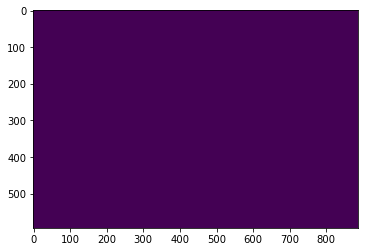

In [90]:
# imagePath = ['C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40641_SFA001_Prox_0197.A.5.1.1.grayscale_soft_tissue.png',\
#              'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40641_SFA001_Prox_0197.A.5.1.1.grayscale_calc_sheet.png', \
#         'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40641_SFA001_Prox_0197.A.5.1.1.grayscale_calc_nodular.png',]

# CV40642_SFA002_Dist_1447.A.4.1.6.grayscale_soft_tissue
imagePath = ['C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40642_SFA002_Dist_1447.A.4.1.6.grayscale_soft_tissue.png',\
             'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40642_SFA002_Dist_1447.A.4.1.6.grayscale_calc_sheet.png', \
        'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\ora_180919\\Layers\\train\\mask\\CV40642_SFA002_Dist_1447.A.4.1.6.grayscale_calc_nodular.png',]


image = cv2.imread(imagePath[1], 0).astype(np.int16)#cv2.imread(imagePath[1])
print(np.unique(image))
print(image.shape)
plt.imshow((image==image.max())*1)

# UNET WIT DIFFERENT CLASSES

- 2 CALCIFICATIONS
- NO CALCIFICATIONS AT ALL 
- BACKGROUND

## IMAGES GENERATION:  

In [92]:
#---------------------
# 0. Data parameters to create the dataset 
error = 0
Area = 50
train =  True
# With only the criteria of 2 calcifications: 223 Images and masks are created
more_classes =  False
num_classes = 4

image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, num_classes= num_classes)
print('Images and masks are created:', len(image_list))

# with multi 3 with only 3 classes
# Images and masks are created
# 166 166

Images and masks are created: 177


In [ ]:
def data_augmentation

In [96]:
n = []
m = []
list_labels = []
all_labels = []

for i in range(len(mask_list)):
    labels, counts_elements = np.unique(mask_list[i], return_counts=True)
    all_labels = all_labels + list(labels)
    #print(name_list[i], labels, [np.round(x*100) for x in counts_elements/np.sum(counts_elements)], mask_list[i].shape)
    n.append(mask_list[i].shape[0])
    m.append(mask_list[i].shape[1])
    # if 4 not in labels and 3 not in labels:
    #     print(name_list[i], labels, mask_list[i].shape)

labels, counts_elements = np.unique(all_labels, return_counts=True)
print(labels, '\n',[np.round(x*100) for x in counts_elements/np.sum(counts_elements)])

[0 1 2 3] 
 [25.0, 25.0, 25.0, 25.0]


In [ ]:
index = 12
print(np.unique(mask_list[index]))
plt.imshow(mask_list[index])
img = image_list[index][0] 
plt.imshow(img)

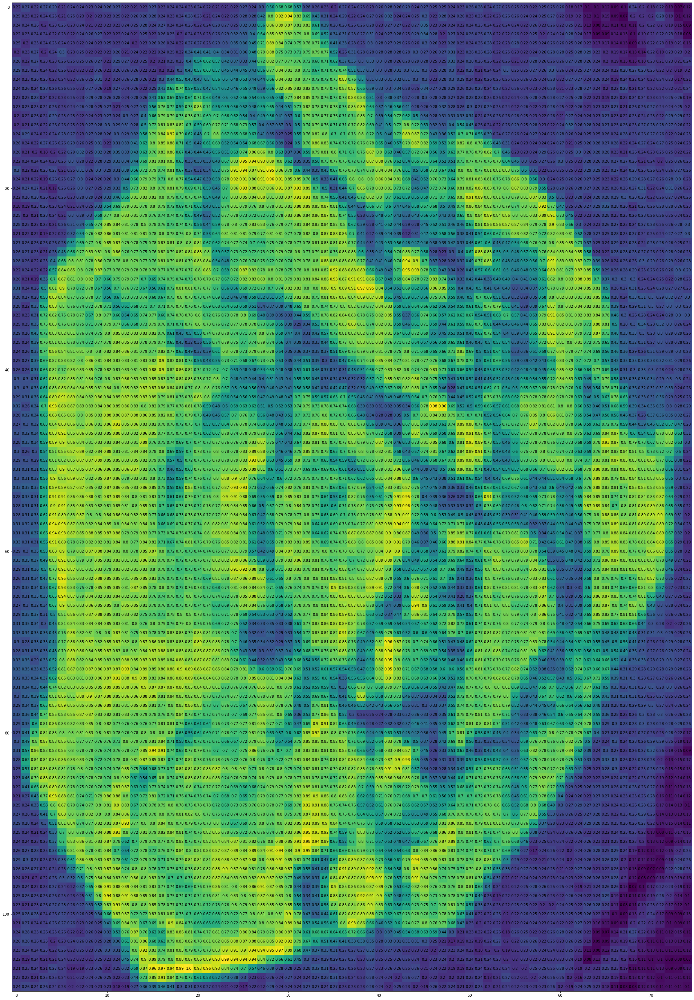

In [27]:
import matplotlib
matplotlib.rcParams.update({'font.size': 10})
index = 0
img = image_list[index][0] 
fig = plt.figure(figsize=(50,50))
channel = 0
col = 'black'
ax  =  plt.subplot()
ax.imshow(img[:,:,channel])
#ax.set_title(" SR CT  "+str(name_list[index]['Slice'][2*i]))
for l in range(img[:,:,channel].shape[0]):
    for m in range(img[:,:,channel].shape[1]):
        text = ax.text(m, l, str(np.round(img[:,:,channel][l, m], 2)),
                    ha="center", va="center", color=col)

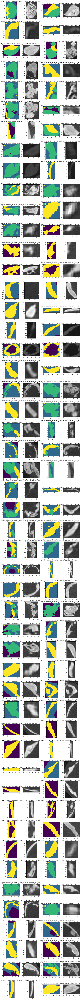

In [93]:
# plot_images(mask_new[100:], image_list[100:] , name_list[100:])
def add_zeros(image):
    image[0,0] = int(0)
    image[0,1] = int(1)
    image[1,0] = int(2)
    image[1,1] = int(3)
    return image
    
mask_new = [ add_zeros(image) for image in mask_list] # if image.shape[0]>0]
len(mask_new)

plot_images(mask_new[:100], image_list[:100] , name_list[:100])



In [112]:
# plot_images(mask_new[100:], image_list[100:] , name_list[100:])

In [ ]:

#i = np.random.randint(0, len(mask_list))
i = 180
print(np.unique(image_list[i][0]))
print(name_list[i], np.unique(mask_list[i]), name_list[i+1],np.unique(mask_list[i+1]) )
plt.imshow(mask_list[i])
plt.show()
plt.imshow(image_list[i][0])
plt.show()
plt.imshow(mask_list[i+1])
plt.show()
plt.imshow(image_list[i+1][0])
plt.show()

## Training Model 1 more_classes

Images and masks are created: 824
Current step: 0  Loss: 0.7988317012786865  
Current step: 30  Loss: 0.8139539361000061  
Saving Model0.torch
Current step: 0  Loss: 0.7678783535957336  
Current step: 30  Loss: 0.7577248811721802  
Current step: 0  Loss: 0.7305727601051331  
Current step: 30  Loss: 0.7139196395874023  
Current step: 0  Loss: 0.6914812326431274  
Current step: 30  Loss: 0.6807370781898499  
Current step: 0  Loss: 0.6920143365859985  
Current step: 30  Loss: 0.6691073775291443  
Current step: 0  Loss: 0.675110936164856  
Current step: 30  Loss: 0.6494549512863159  
Saving Model5.torch
Current step: 0  Loss: 0.6865152716636658  
Current step: 30  Loss: 0.6507322788238525  
Current step: 0  Loss: 0.6669312715530396  
Current step: 30  Loss: 0.6349672079086304  
Current step: 0  Loss: 0.6899608373641968  
Current step: 30  Loss: 0.6157798767089844  
Current step: 0  Loss: 0.6726364493370056  
Current step: 30  Loss: 0.6470396518707275  
Current step: 0  Loss: 0.694491147994

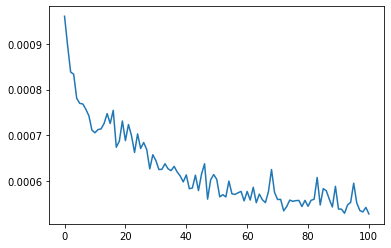

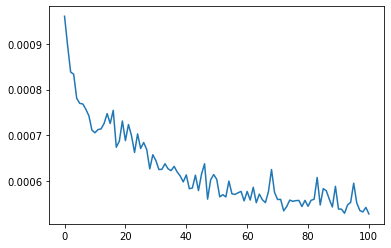

In [114]:
op_value = None
error = 15
Area = 50
train =  True
more_classes =  True
num_classes = 4
add_SR_CT = False


image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value, num_classes  =  num_classes )
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)
## ADD images from SR data saet SFA006
if add_SR_CT:
    SR_img_list_aux = (np.load(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers\train\SR_SFA006_images.npy'))
    n,m = SR_img_list_aux.shape[1], SR_img_list_aux.shape[2]
    SR_mask_list = [np.zeros((n,m),np.int64) ]*len(SR_img_list_aux)
    print('len SR mask', len(SR_img_list_aux ))
    #print(SR_img_list_aux.shape)
    num_img = SR_img_list_aux.shape[0]-2
    SR_img_list= [[SR_img_list_aux[i], SR_img_list_aux[i+1], SR_img_list_aux[i+2]] for i in range(num_img)]

    # Add SR images
    print('Images and masks :', len(image_list))
    image_list = image_list + SR_img_list
    mask_list = mask_list + SR_mask_list
    print('Images and masks with SR CT images:', len(image_list))

    
image_shape = (64, 64) 
batch_size = 16

data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders = torch.utils.data.DataLoader(data, batch_size)
#----------------------
# Model 
input_channels = 9
num_classes = 4
learning_rate = 1e-3  
epochs = 101
loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi4_new_1_4class_Calc'


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
if not os.path.exists(modelPath):
    os.makedirs(modelPath)
    
#----------------------------------------------------------
#----------------------------------------------------------
net = UNET_multi_4_new(input_channels, num_classes) 
#----------------------------------------------------------
#----------------------------------------------------------

net.to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)
#summary(net)
#sum(p.numel() for p in net.parameters() if p.requires_grad) 
tloss, tloss_list = training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath,  multi= True)
plt.plot(tloss_list)

Images and masks are created: 824
Current step: 0  Loss: 0.786622166633606  
Current step: 30  Loss: 0.8089780211448669  
Saving Model0.torch
Current step: 0  Loss: 0.752845048904419  
Current step: 30  Loss: 0.7710887789726257  
Current step: 0  Loss: 0.725924015045166  
Current step: 30  Loss: 0.7325066328048706  
Current step: 0  Loss: 0.7001725435256958  
Current step: 30  Loss: 0.6984723210334778  
Current step: 0  Loss: 0.6669529676437378  
Current step: 30  Loss: 0.6669985055923462  
Current step: 0  Loss: 0.6383057832717896  
Current step: 30  Loss: 0.646741509437561  
Saving Model5.torch
Current step: 0  Loss: 0.6268402338027954  
Current step: 30  Loss: 0.632234513759613  
Current step: 0  Loss: 0.6160218715667725  
Current step: 30  Loss: 0.6280261278152466  
Current step: 0  Loss: 0.6121890544891357  
Current step: 30  Loss: 0.6252948641777039  
Current step: 0  Loss: 0.5952309966087341  
Current step: 30  Loss: 0.6068605780601501  
Current step: 0  Loss: 0.570206880569458 

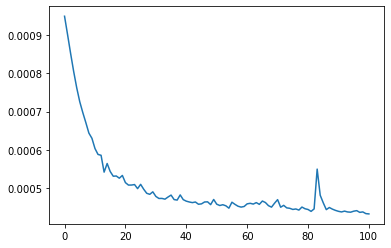

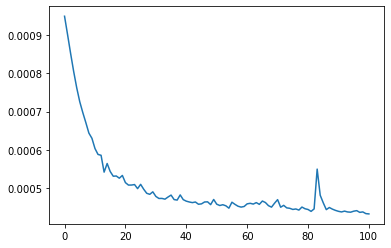

In [111]:
op_value = None
error = 15
Area = 50
train =  True
more_classes =  True
num_classes = 4
add_SR_CT = False


image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value, num_classes  =  num_classes )
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)
## ADD images from SR data saet SFA006
if add_SR_CT:
    SR_img_list_aux = (np.load(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers\train\SR_SFA006_images.npy'))
    n,m = SR_img_list_aux.shape[1], SR_img_list_aux.shape[2]
    SR_mask_list = [np.zeros((n,m),np.int64) ]*len(SR_img_list_aux)
    print('len SR mask', len(SR_img_list_aux ))
    #print(SR_img_list_aux.shape)
    num_img = SR_img_list_aux.shape[0]-2
    SR_img_list= [[SR_img_list_aux[i], SR_img_list_aux[i+1], SR_img_list_aux[i+2]] for i in range(num_img)]

    # Add SR images
    print('Images and masks :', len(image_list))
    image_list = image_list + SR_img_list
    mask_list = mask_list + SR_mask_list
    print('Images and masks with SR CT images:', len(image_list))

    
image_shape = (64, 64) 
batch_size = 16

data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders = torch.utils.data.DataLoader(data, batch_size)
#----------------------
# Model 
input_channels = 9
num_classes = 4
learning_rate = 1e-3  
epochs = 101
loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi4_1_4class_Calc'


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
if not os.path.exists(modelPath):
    os.makedirs(modelPath)
    
#----------------------------------------------------------
#----------------------------------------------------------
net = UNET_multi_4(input_channels, num_classes) 
#----------------------------------------------------------
#----------------------------------------------------------

net.to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)
#summary(net)
#sum(p.numel() for p in net.parameters() if p.requires_grad) 
tloss, tloss_list = training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath,  multi= True)
plt.plot(tloss_list)

Images and masks are created: 801
Current step: 0  Loss: 0.7912678122520447  
Current step: 30  Loss: 0.8004867434501648  
Saving Model0.torch
Current step: 0  Loss: 0.7396407723426819  
Current step: 30  Loss: 0.7529386281967163  
Current step: 0  Loss: 0.6993975043296814  
Current step: 30  Loss: 0.7175465226173401  
Current step: 0  Loss: 0.6696840524673462  
Current step: 30  Loss: 0.693031907081604  
Current step: 0  Loss: 0.6491345167160034  
Current step: 30  Loss: 0.6717583537101746  
Current step: 0  Loss: 0.6320450305938721  
Current step: 30  Loss: 0.6590352058410645  
Saving Model5.torch
Current step: 0  Loss: 0.6169071197509766  
Current step: 30  Loss: 0.6495159864425659  
Current step: 0  Loss: 0.6108005046844482  
Current step: 30  Loss: 0.6408631801605225  
Current step: 0  Loss: 0.6004071235656738  
Current step: 30  Loss: 0.6386044025421143  
Current step: 0  Loss: 0.5941784977912903  
Current step: 30  Loss: 0.6345055103302002  
Current step: 0  Loss: 0.587443232536

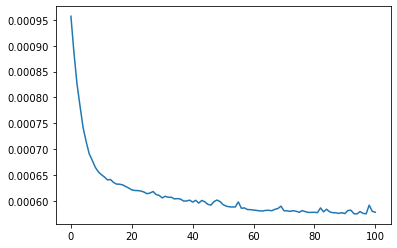

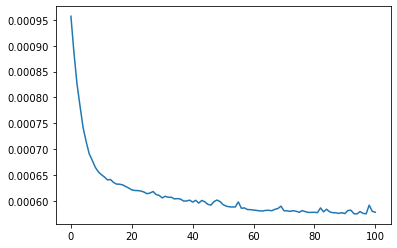

In [108]:
op_value = None
error = 25
Area = 80
train =  True
more_classes =  True
num_classes = 4
add_SR_CT = False


image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value, num_classes  =  num_classes )
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)
## ADD images from SR data saet SFA006
if add_SR_CT:
    SR_img_list_aux = (np.load(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers\train\SR_SFA006_images.npy'))
    n,m = SR_img_list_aux.shape[1], SR_img_list_aux.shape[2]
    SR_mask_list = [np.zeros((n,m),np.int64) ]*len(SR_img_list_aux)
    print('len SR mask', len(SR_img_list_aux ))
    #print(SR_img_list_aux.shape)
    num_img = SR_img_list_aux.shape[0]-2
    SR_img_list= [[SR_img_list_aux[i], SR_img_list_aux[i+1], SR_img_list_aux[i+2]] for i in range(num_img)]

    # Add SR images
    print('Images and masks :', len(image_list))
    image_list = image_list + SR_img_list
    mask_list = mask_list + SR_mask_list
    print('Images and masks with SR CT images:', len(image_list))

    
image_shape = (128, 128) 
batch_size = 16

data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders = torch.utils.data.DataLoader(data, batch_size)
#----------------------
# Model 
input_channels = 9
num_classes = 4
learning_rate = 1e-3  
epochs = 101
loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_3_4_classes_onlyCalc'


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
if not os.path.exists(modelPath):
    os.makedirs(modelPath)

net = UNET_multi(input_channels, num_classes) 
net.to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)
#summary(net)
#sum(p.numel() for p in net.parameters() if p.requires_grad) 
tloss, tloss_list = training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath,  multi= True)
plt.plot(tloss_list)

In [ ]:
op_value = None
error = 15
Area = 50
train =  True
more_classes =  True
num_classes = 4
add_SR_CT = False #model 6 False others True


image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value, num_classes  =  num_classes )
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)
## ADD images from SR data saet SFA006
if add_SR_CT:
    SR_img_list_aux = (np.load(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers\train\SR_SFA006_images.npy'))
    n,m = SR_img_list_aux.shape[1], SR_img_list_aux.shape[2]
    SR_mask_list = [np.zeros((n,m),np.int64) ]*len(SR_img_list_aux)
    print('len SR mask', len(SR_img_list_aux ))
    #print(SR_img_list_aux.shape)
    num_img = SR_img_list_aux.shape[0]-2
    SR_img_list= [[SR_img_list_aux[i], SR_img_list_aux[i+1], SR_img_list_aux[i+2]] for i in range(num_img)]

    # Add SR images
    print('Images and masks :', len(image_list))
    image_list = image_list + SR_img_list
    mask_list = mask_list + SR_mask_list
    print('Images and masks with SR CT images:', len(image_list))


In [ ]:
image_shape = (64, 64) 
batch_size = 16


data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders = torch.utils.data.DataLoader(data, batch_size)
#----------------------
# Model 
input_channels = 9
num_classes = 4
learning_rate = 1e-3  
epochs = 101
loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_6_more_classes'


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
if not os.path.exists(modelPath):
    os.makedirs(modelPath)

net = UNET_multi(input_channels, num_classes) 
net.to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)
#summary(net)
#sum(p.numel() for p in net.parameters() if p.requires_grad) 
tloss, tloss_list = training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath,  multi= True)
plt.plot(tloss_list)

### Test with images SR from center line SFA006

In [98]:
from sklearn import metrics

def test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = False):
    loss_classes =  np.array([[0] * num_classes])
    loss = []
    for _, batch in enumerate(dataloaders_test): 
        if multi:
                X, X_af, X_be, y = batch
                X, X_af, X_be, y = X.to(device), X_af.to(device), X_be.to(device), y.to(device)
                pred = net(X, X_af, X_be)
        else:
                X, y = batch
                X, y  = X.to(device), y.to(device)
                pred = net(X)

        seg = torch.argmax(pred, dim=1).detach().numpy()[0]# torch.argmax(pred, 1).numpy()  # Get  prediction classes
        loss_v = loss_fn(pred, y)
        loss_classes_  = []
        for i in range(pred.shape[1]):
            y1 = 1*(y==i)
            pred1 = pred[:,i,:,:].unsqueeze(0)
            loss_classes_.append(-(loss_fn(pred1, y1).item()-1))
        #loss_classes_ , loss_v = loss_fn(pred, y, Test = True)
        loss_classes  = np.concatenate((loss_classes, np.array([loss_classes_])), axis = 0)
        loss.append(loss_v.item())
        print(loss_v)
        # print(seg.shape)
        # print(y.squeeze().detach().numpy().shape)

        print(metrics.classification_report(y.squeeze().detach().numpy().flatten(), seg.flatten(), digits=5))

        if plot_:
            print(loss_classes_)
            _, (ax1, ax2, ax3) = plt.subplots(1,3)
            ax1.imshow(X.squeeze().permute(1,2,0))
            ax2.imshow(seg)
            ax3.imshow(y.squeeze())
            plt.show()
    return loss_classes[1:,:].mean(0), np.mean(loss)


Images and masks are created: 24
tensor(0.6318, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70162   0.82363   0.75775      7320
           1    0.78139   0.62611   0.69518      7644
           2    0.07383   0.01794   0.02887       613
           3    0.47528   0.89343   0.62048       807

    accuracy                        0.70477     16384
   macro avg    0.50803   0.59028   0.52557     16384
weighted avg    0.70420   0.70477   0.69453     16384

[0.5828884840011597, 0.5531333684921265, 0.550835132598877, 0.6135275363922119]


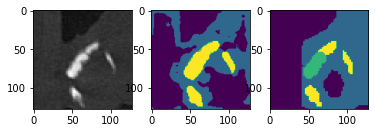

tensor(0.5745, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.50294   0.94910   0.65748      4499
           1    0.95244   0.47688   0.63554      8692
           2    0.10833   0.00962   0.01768      1351
           3    0.53244   0.98914   0.69225      1842

    accuracy                        0.62561     16384
   macro avg    0.52404   0.60618   0.50074     16384
weighted avg    0.71218   0.62561   0.59699     16384

[0.6974249482154846, 0.6249333620071411, 0.5654441118240356, 0.6168073415756226]


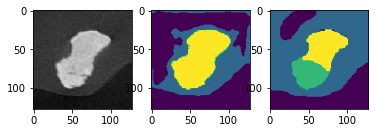

tensor(0.5728, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.89466   0.75500   0.81892      7143
           1    0.78072   0.86103   0.81891      7534
           2    0.03093   0.01538   0.02055       390
           3    0.64544   0.90812   0.75457      1317

    accuracy                        0.79846     16384
   macro avg    0.58794   0.63489   0.60324     16384
weighted avg    0.80167   0.79846   0.79474     16384

[0.7119565010070801, 0.6489747762680054, 0.523268461227417, 0.6065358519554138]


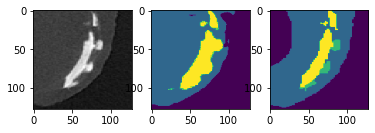

tensor(0.5998, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74597   0.47861   0.58310      6872
           1    0.64474   0.82516   0.72387      7933
           2    0.13675   0.07143   0.09384       224
           3    0.78006   0.98155   0.86928      1355

    accuracy                        0.68243     16384
   macro avg    0.57688   0.58919   0.56753     16384
weighted avg    0.69144   0.68243   0.66824     16384

[0.6246218085289001, 0.643487274646759, 0.5064892768859863, 0.6866191029548645]


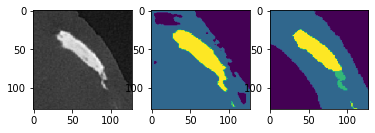

tensor(0.5993, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.97837   0.70188   0.81738      7024
           1    0.74852   0.93205   0.83026      6917
           2    0.34171   0.02793   0.05163      2435
           3    0.00237   0.75000   0.00472         8

    accuracy                        0.69891     16384
   macro avg    0.51774   0.60296   0.42600     16384
weighted avg    0.78623   0.69891   0.70861     16384

[0.684930145740509, 0.6858611106872559, 0.6202260851860046, 0.465831995010376]


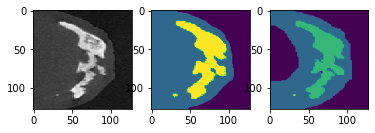

tensor(0.5966, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.92988   0.49000   0.64180      9500
           1    0.53942   0.85194   0.66058      5606
           2    0.00000   0.00000   0.00000         0
           3    0.54561   0.98748   0.70287      1278

    accuracy                        0.65265     16384
   macro avg    0.50373   0.58236   0.50131     16384
weighted avg    0.76631   0.65265   0.65299     16384

[0.646247386932373, 0.6741155385971069, 0.4630858898162842, 0.6668776273727417]


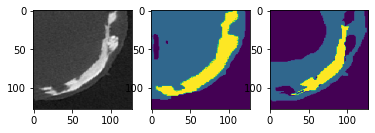

tensor(0.5445, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.89356   0.48657   0.63005      7557
           1    0.64888   0.87485   0.74511      7311
           2    0.00000   0.00000   0.00000         0
           3    0.68128   0.98417   0.80518      1516

    accuracy                        0.70587     16384
   macro avg    0.55593   0.58640   0.54509     16384
weighted avg    0.76473   0.70587   0.69760     16384

[0.6920651197433472, 0.6835145354270935, 0.4660138487815857, 0.7545718550682068]


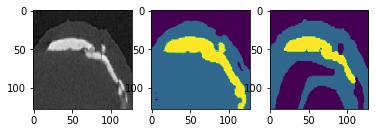

tensor(0.6114, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.96087   0.23107   0.37255      6907
           1    0.54040   0.88131   0.66998      7111
           2    0.00000   0.00000   0.00000         0
           3    0.82741   0.97464   0.89501      2366

    accuracy                        0.62067     16384
   macro avg    0.58217   0.52176   0.48439     16384
weighted avg    0.75910   0.62067   0.57709     16384

[0.537722110748291, 0.5951114892959595, 0.43685972690582275, 0.7911497354507446]


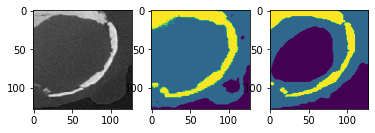

tensor(0.6456, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.17771   0.13111   0.15090       450
           1    0.94137   0.89335   0.91673     10370
           2    0.00000   0.00000   0.00000         0
           3    0.91988   0.93889   0.92929      5564

    accuracy                        0.88788     16384
   macro avg    0.50974   0.49084   0.49923     16384
weighted avg    0.91310   0.88788   0.89996     16384

[0.505989670753479, 0.6506069302558899, 0.39666080474853516, 0.7342140078544617]


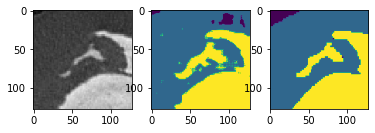

tensor(0.6237, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69874   0.14496   0.24011      4208
           1    0.64127   0.79714   0.71076      8055
           2    0.00000   0.00000   0.00000         0
           3    0.81401   0.98981   0.89334      4121

    accuracy                        0.67810     16384
   macro avg    0.53850   0.48298   0.46105     16384
weighted avg    0.69948   0.67810   0.63580     16384

[0.52880859375, 0.6296496391296387, 0.41453415155410767, 0.7845346331596375]


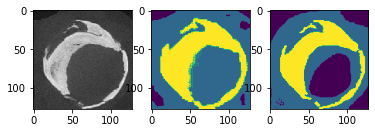

tensor(0.7682, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.39301   0.75654   0.51730      3479
           1    0.86661   0.52801   0.65621     11960
           2    0.34783   0.06264   0.10616       894
           3    0.00893   0.39216   0.01747        51

    accuracy                        0.55072     16384
   macro avg    0.40410   0.43484   0.32428     16384
weighted avg    0.73507   0.55072   0.59471     16384

[0.43695443868637085, 0.44883930683135986, 0.5682000517845154, 0.4717065691947937]


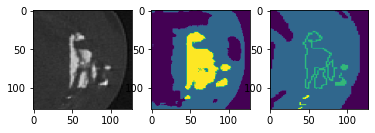

tensor(0.7570, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.32618   0.68483   0.44189      2551
           1    0.88500   0.57151   0.69452     12712
           2    0.34404   0.07022   0.11664      1068
           3    0.01077   0.52830   0.02110        53

    accuracy                        0.55634     16384
   macro avg    0.39150   0.46372   0.31854     16384
weighted avg    0.75990   0.55634   0.61534     16384

[0.45685380697250366, 0.4721103310585022, 0.5680490732192993, 0.4658914804458618]


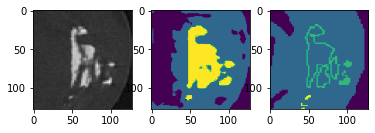

tensor(0.6883, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.26404   0.57902   0.36269      3069
           1    0.83719   0.57725   0.68333     11910
           2    0.00000   0.00000   0.00000         0
           3    0.96145   0.94093   0.95108      1405

    accuracy                        0.60876     16384
   macro avg    0.51567   0.52430   0.49928     16384
weighted avg    0.74049   0.60876   0.64623     16384

[0.4806479215621948, 0.5081050992012024, 0.4834108352661133, 0.678071916103363]


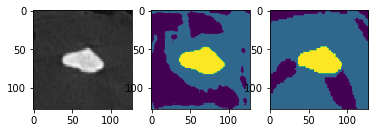

tensor(0.5140, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.93815   0.70492   0.80498      8757
           1    0.65846   0.90729   0.76311      5663
           2    0.40940   0.06839   0.11720       892
           3    0.55670   0.96175   0.70520      1072

    accuracy                        0.75702     16384
   macro avg    0.64068   0.66059   0.59762     16384
weighted avg    0.78773   0.75702   0.74653     16384

[0.7895908355712891, 0.7599810361862183, 0.5986106991767883, 0.6200243830680847]


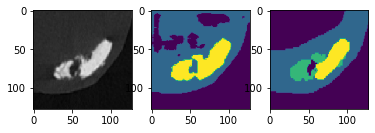

tensor(0.6106, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87922   0.52882   0.66042      9003
           1    0.54702   0.87182   0.67225      5851
           2    0.47500   0.03748   0.06947      1521
           3    0.00000   0.00000   0.00000         9

    accuracy                        0.60541     16384
   macro avg    0.47531   0.35953   0.35053     16384
weighted avg    0.72258   0.60541   0.60942     16384

[0.6790701150894165, 0.6642552018165588, 0.6894719004631042, 0.4791024923324585]


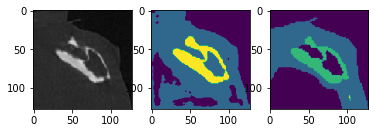

tensor(0.5649, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.91432   0.56692   0.69988      7285
           1    0.64744   0.91734   0.75911      6472
           2    0.55696   0.05063   0.09283      2607
           3    0.00000   0.00000   0.00000        20

    accuracy                        0.62250     16384
   macro avg    0.52968   0.38372   0.38795     16384
weighted avg    0.75092   0.62250   0.62583     16384

[0.7284146547317505, 0.7210673093795776, 0.7398914694786072, 0.46521854400634766]


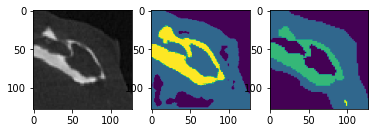

tensor(0.6289, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68230   0.68185   0.68207      4567
           1    0.80798   0.73990   0.77245      8616
           2    0.19538   0.02999   0.05200      3101
           3    0.02548   0.88000   0.04952       100

    accuracy                        0.59021     16384
   macro avg    0.42778   0.58294   0.38901     16384
weighted avg    0.65223   0.59021   0.60648     16384

[0.6557408571243286, 0.631788432598114, 0.6804386377334595, 0.452828049659729]


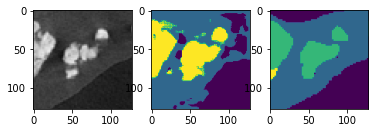

tensor(0.6862, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.33695   0.93318   0.49512      3427
           1    0.94699   0.42781   0.58937     11650
           2    0.32961   0.04514   0.07941      1307
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.50299     16384
   macro avg    0.40339   0.35153   0.29098     16384
weighted avg    0.77014   0.50299   0.52897     16384

[0.655033528804779, 0.4946080446243286, 0.618367612361908, 0.4787698984146118]


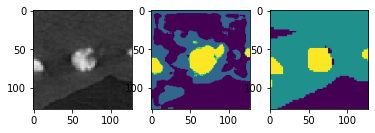

tensor(0.4303, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.93286   0.76445   0.84030      3944
           1    0.88695   0.84747   0.86676      8110
           2    0.05625   0.01643   0.02544      1643
           3    0.54499   0.99851   0.70512      2687

    accuracy                        0.76892     16384
   macro avg    0.60526   0.65672   0.60941     16384
weighted avg    0.75862   0.76892   0.74952     16384

[0.8539708256721497, 0.7349164485931396, 0.5407576560974121, 0.7071171998977661]


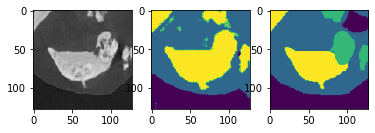

tensor(0.6264, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55285   0.24496   0.33950      2135
           1    0.83472   0.81335   0.82389      9531
           2    0.10782   0.02031   0.03419      3938
           3    0.14346   0.99487   0.25077       780

    accuracy                        0.55731     16384
   macro avg    0.40971   0.51837   0.36209     16384
weighted avg    0.59036   0.55731   0.54368     16384

[0.5682099461555481, 0.588309645652771, 0.5916942358016968, 0.5077739357948303]


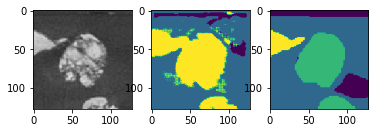

tensor(0.6438, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.54667   0.67940   0.60585      5836
           1    0.68953   0.51263   0.58807      8431
           2    0.24664   0.02598   0.04701      2117
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.50916     16384
   macro avg    0.37071   0.30450   0.31023     16384
weighted avg    0.58142   0.50916   0.52449     16384

[0.6697856187820435, 0.5196965932846069, 0.7183027267456055, 0.46244102716445923]


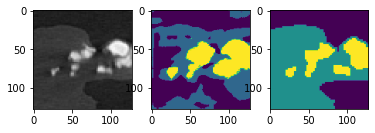

tensor(0.5651, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70606   0.83052   0.76325      3381
           1    0.92031   0.76221   0.83383      8848
           2    0.07625   0.01879   0.03014      1384
           3    0.58105   0.99350   0.73325      2771

    accuracy                        0.75262     16384
   macro avg    0.57091   0.65125   0.59012     16384
weighted avg    0.74742   0.75262   0.73436     16384

[0.6027249097824097, 0.6292363405227661, 0.4909331798553467, 0.7066806554794312]


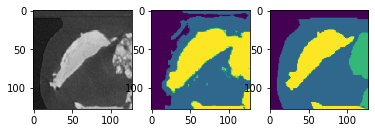

tensor(0.6215, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.92846   0.78473   0.85057     10833
           1    0.46537   0.60041   0.52434      3436
           2    0.15707   0.01418   0.02602      2115
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.64661     16384
   macro avg    0.38773   0.34983   0.35023     16384
weighted avg    0.73177   0.64661   0.67571     16384

[0.6762169599533081, 0.5857304334640503, 0.7057346701622009, 0.46336060762405396]


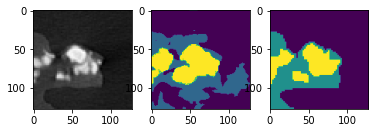

tensor(0.5337, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87230   0.70413   0.77924      5161
           1    0.83082   0.89063   0.85969      8348
           2    0.08553   0.02826   0.04248       460
           3    0.76516   0.98758   0.86226      2415

    accuracy                        0.82196     16384
   macro avg    0.63845   0.65265   0.63592     16384
weighted avg    0.81328   0.82196   0.81178     16384

[0.703618049621582, 0.7872156500816345, 0.5448981523513794, 0.6896442174911499]


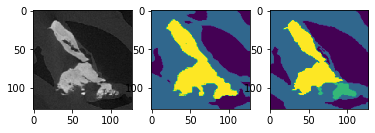

[0.63206197 0.622302   0.56175743 0.59872086] 0.6099573522806168


In [124]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 
import warnings
warnings.filterwarnings("ignore")


op_value = None
error = 20
Area = 100
train =  False
more_classes =  False
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 4

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_3_4_classes_onlyCalc'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 1-4  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


Images and masks are created: 94
tensor(0.6457, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58512   0.81844   0.68239      7320
           1    0.69256   0.44205   0.53965      7644
           2    0.62406   0.67700   0.64945       613
           3    0.66057   0.49195   0.56392       807

    accuracy                        0.62146     16384
   macro avg    0.64058   0.60736   0.60885     16384
weighted avg    0.64042   0.62146   0.60872     16384

[0.5095459222793579, 0.551327109336853, 0.5718344449996948, 0.6052820086479187]


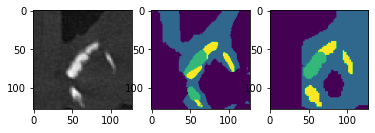

tensor(0.6446, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40146   0.98978   0.57123      4499
           1    0.95190   0.22768   0.36747      8692
           2    0.49508   0.74537   0.59498      1351
           3    0.70738   0.45277   0.55214      1842

    accuracy                        0.50494     16384
   macro avg    0.63896   0.60390   0.52145     16384
weighted avg    0.73559   0.50494   0.46294     16384

[0.5050288438796997, 0.5487486720085144, 0.5906097888946533, 0.6106396317481995]


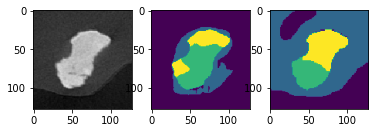

tensor(0.6722, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.98250   0.76111   0.85775     13278
           1    0.47983   0.94205   0.63581      3106

    accuracy                        0.79541     16384
   macro avg    0.73116   0.85158   0.74678     16384
weighted avg    0.88721   0.79541   0.81568     16384

[0.6523438692092896, 0.6514491438865662, 0.4992016553878784, 0.4998732805252075]


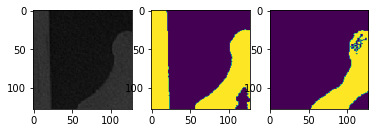

tensor(0.6140, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58292   0.69125   0.63248      7592
           1    0.62295   0.51796   0.56563      7850
           2    0.98176   0.51763   0.67786       624
           3    0.47429   0.78302   0.59075       318

    accuracy                        0.60339     16384
   macro avg    0.66548   0.62747   0.61668     16384
weighted avg    0.61518   0.60339   0.60137     16384

[0.5917133688926697, 0.6032084226608276, 0.5763891339302063, 0.5943331718444824]


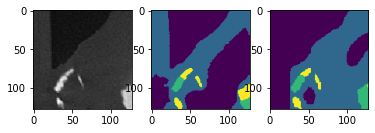

tensor(0.6501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74341   0.89999   0.81424     10379
           1    0.60487   0.35191   0.44495      5007
           2    0.67587   0.53577   0.59772       685
           3    0.19284   0.22364   0.20710       313

    accuracy                        0.70435     16384
   macro avg    0.55425   0.50283   0.51600     16384
weighted avg    0.68773   0.70435   0.68073     16384

[0.6006388068199158, 0.6088017225265503, 0.5717884302139282, 0.5227620005607605]


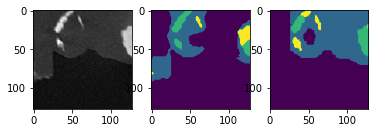

tensor(0.6897, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51968   0.94405   0.67035      6559
           1    0.91788   0.41751   0.57395      9825

    accuracy                        0.62830     16384
   macro avg    0.71878   0.68078   0.62215     16384
weighted avg    0.75847   0.62830   0.61254     16384

[0.5973829627037048, 0.6429529190063477, 0.49953407049179077, 0.49991321563720703]


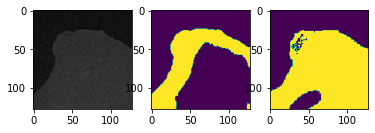

tensor(0.6368, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.66218   0.99916   0.79650      7143
           1    0.93050   0.51181   0.66039      7534
           2    0.08465   0.11026   0.09577       390
           3    0.65514   0.47456   0.55042      1317

    accuracy                        0.71173     16384
   macro avg    0.58312   0.52395   0.52577     16384
weighted avg    0.77125   0.71173   0.69745     16384

[0.635596752166748, 0.6525363922119141, 0.5109896063804626, 0.5618008971214294]


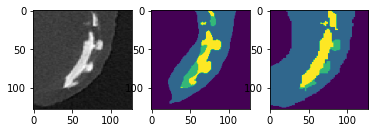

tensor(0.5436, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63880   0.99854   0.77915      6872
           1    0.95823   0.50611   0.66238      7933
           2    0.66667   0.04464   0.08368       224
           3    0.87404   0.92694   0.89971      1355

    accuracy                        0.74115     16384
   macro avg    0.78444   0.61906   0.60623     16384
weighted avg    0.81330   0.74115   0.72307     16384

[0.6880790591239929, 0.7110774517059326, 0.5075316429138184, 0.7298298478126526]


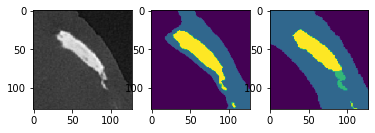

tensor(0.6866, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77153   0.99208   0.86801     10351
           1    0.96031   0.49299   0.65151      5988
           3    0.00000   0.00000   0.00000        45

    accuracy                        0.80695     16384
   macro avg    0.57728   0.49502   0.50651     16384
weighted avg    0.83840   0.80695   0.78650     16384

[0.6022243499755859, 0.6403834223747253, 0.49887657165527344, 0.4999532103538513]


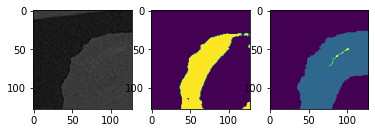

tensor(0.7553, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76162   0.99193   0.86165      9911
           1    0.97699   0.52464   0.68268      6473

    accuracy                        0.80731     16384
   macro avg    0.86930   0.75828   0.77217     16384
weighted avg    0.84671   0.80731   0.79094     16384

[0.4745250940322876, 0.4977465867996216, 0.4993271827697754, 0.4999340772628784]


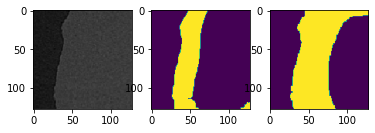

tensor(0.7623, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60887   0.99989   0.75686      8966
           1    0.99940   0.22398   0.36594      7407
           3    0.00000   0.00000   0.00000        11

    accuracy                        0.64844     16384
   macro avg    0.53609   0.40796   0.37427     16384
weighted avg    0.78501   0.64844   0.57962     16384

[0.4449130892753601, 0.5158463716506958, 0.4992002248764038, 0.4997706413269043]


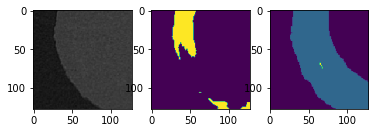

tensor(0.7227, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.54282   1.00000   0.70367      7828
           1    0.96949   0.17857   0.30159      8008
           3    0.96516   0.85949   0.90927       548

    accuracy                        0.59381     16384
   macro avg    0.82582   0.67935   0.63818     16384
weighted avg    0.76549   0.59381   0.51402     16384

[0.4451805353164673, 0.5064418315887451, 0.4988058805465698, 0.5854896306991577]


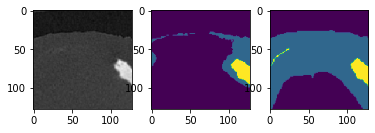

tensor(0.7065, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.86614   0.99519   0.92619     13725
           1    0.73458   0.11488   0.19869      2385
           3    1.00000   0.87956   0.93592       274

    accuracy                        0.86511     16384
   macro avg    0.86691   0.66321   0.68694     16384
weighted avg    0.84923   0.86511   0.82045     16384

[0.5324068069458008, 0.519498884677887, 0.49906647205352783, 0.5718892812728882]


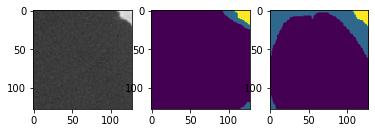

tensor(0.7802, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69905   1.00000   0.82287     11326
           1    1.00000   0.03598   0.06947      5058

    accuracy                        0.70239     16384
   macro avg    0.84952   0.51799   0.44617     16384
weighted avg    0.79196   0.70239   0.59028     16384

[0.4240947365760803, 0.5002239346504211, 0.4998105764389038, 0.49997079372406006]


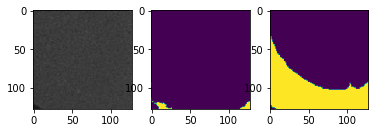

tensor(0.5749, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72940   0.99926   0.84327      8133
           1    0.94125   0.55059   0.69477      6780
           2    0.29245   0.14091   0.19018       220
           3    0.87436   0.81775   0.84511      1251

    accuracy                        0.78821     16384
   macro avg    0.70937   0.62713   0.64333     16384
weighted avg    0.82227   0.78821   0.77319     16384

[0.6583529710769653, 0.6651644110679626, 0.5058457851409912, 0.708634078502655]


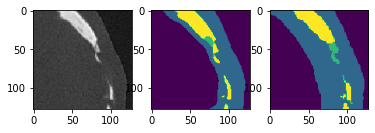

tensor(0.6120, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68005   0.99587   0.80820      7024
           1    0.91115   0.51742   0.66003      6917
           2    0.97051   0.62177   0.75795      2435
           3    0.00820   0.62500   0.01618         8

    accuracy                        0.73810     16384
   macro avg    0.64248   0.69001   0.56059     16384
weighted avg    0.82046   0.73810   0.73779     16384

[0.6350736021995544, 0.6561152935028076, 0.6160375475883484, 0.493294894695282]


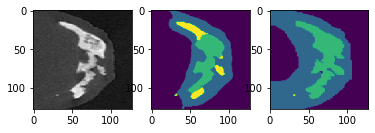

tensor(0.6789, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78066   0.99400   0.87451     10495
           1    0.97848   0.50470   0.66592      5857
           3    0.00000   0.00000   0.00000        32

    accuracy                        0.81714     16384
   macro avg    0.58638   0.49956   0.51347     16384
weighted avg    0.84986   0.81714   0.79823     16384

[0.6140922904014587, 0.6592992544174194, 0.49905169010162354, 0.49955952167510986]


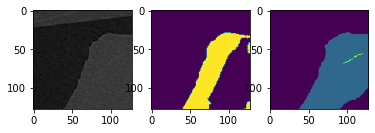

tensor(0.7317, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70074   0.99407   0.82202      9274
           1    0.98296   0.44627   0.61385      7110

    accuracy                        0.75635     16384
   macro avg    0.84185   0.72017   0.71794     16384
weighted avg    0.82322   0.75635   0.73169     16384

[0.5110005140304565, 0.5549616813659668, 0.49933159351348877, 0.49988770484924316]


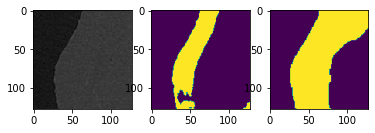

tensor(0.7418, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64429   1.00000   0.78367      9638
           1    0.97906   0.20309   0.33639      6677
           3    1.00000   0.57971   0.73394        69

    accuracy                        0.67346     16384
   macro avg    0.87445   0.59427   0.61800     16384
weighted avg    0.78222   0.67346   0.60118     16384

[0.46076834201812744, 0.5447344183921814, 0.49910569190979004, 0.525525689125061]


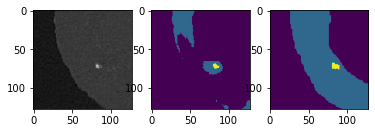

tensor(0.8228, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.39997   0.99080   0.56989      6195
           1    0.93834   0.09608   0.17432     10137
           3    0.00000   0.00000   0.00000        52

    accuracy                        0.43408     16384
   macro avg    0.44611   0.36229   0.24807     16384
weighted avg    0.73180   0.43408   0.32334     16384

[0.33149802684783936, 0.3917831778526306, 0.4996211528778076, 0.49965834617614746]


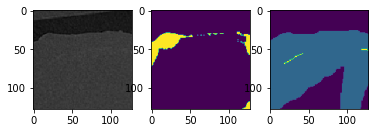

tensor(0.8176, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63385   0.99721   0.77506     10395
           1    0.03333   0.00017   0.00033      5989

    accuracy                        0.63275     16384
   macro avg    0.33359   0.49869   0.38769     16384
weighted avg    0.41434   0.63275   0.49186     16384

[0.36500293016433716, 0.3685431480407715, 0.49982231855392456, 0.4999617338180542]


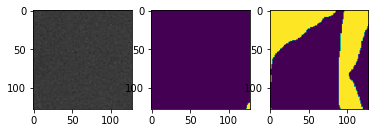

tensor(0.7899, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.57584   0.99945   0.73069      9113
           1    0.92495   0.06845   0.12747      7202
           3    1.00000   0.49275   0.66019        69

    accuracy                        0.58807     16384
   macro avg    0.83360   0.52022   0.50612     16384
weighted avg    0.73109   0.58807   0.46523     16384

[0.3845800757408142, 0.4378197193145752, 0.49968570470809937, 0.5224332809448242]


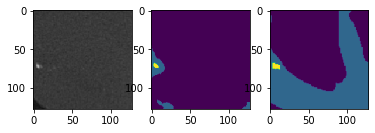

tensor(0.6648, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60147   0.99753   0.75045      7701
           1    0.95702   0.33782   0.49937      7646
           2    1.00000   0.16534   0.28376      1004
           3    0.00000   0.00000   0.00000        33

    accuracy                        0.63666     16384
   macro avg    0.63962   0.37517   0.38340     16384
weighted avg    0.79061   0.63666   0.60317     16384

[0.6147653460502625, 0.6603436470031738, 0.5378223657608032, 0.48709774017333984]


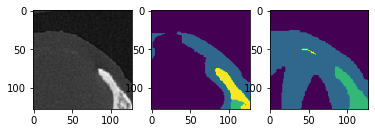

tensor(0.7435, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.56968   0.99898   0.72558      6834
           1    0.88608   0.25061   0.39071      6983
           2    0.95307   0.64083   0.76636      2567
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.62390     16384
   macro avg    0.60221   0.47260   0.47066     16384
weighted avg    0.76460   0.62390   0.58925     16384

[0.4374399781227112, 0.5199803113937378, 0.5616629719734192, 0.4882121682167053]


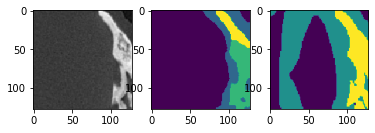

tensor(0.7417, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40576   0.99740   0.57685      5003
           1    0.93199   0.23027   0.36929      9641
           2    0.92165   0.74754   0.82552      1731
           3    0.03000   1.00000   0.05825         9

    accuracy                        0.51959     16384
   macro avg    0.57235   0.74380   0.45748     16384
weighted avg    0.76971   0.51959   0.48070     16384

[0.40902698040008545, 0.4509321451187134, 0.5851665139198303, 0.5048540830612183]


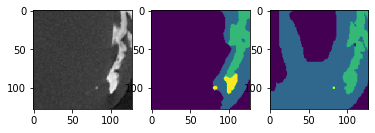

tensor(0.4714, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.85990   0.91421   0.88622      9500
           1    0.94411   0.73528   0.82671      5606
           2    0.00000   0.00000   0.00000         0
           3    0.76431   0.80438   0.78384      1278

    accuracy                        0.84442     16384
   macro avg    0.64208   0.61347   0.62419     16384
weighted avg    0.88126   0.84442   0.85788     16384

[0.8110564351081848, 0.8611489534378052, 0.4886293411254883, 0.7086923718452454]


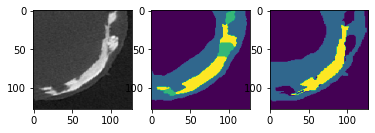

tensor(0.4673, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68103   0.93913   0.78952      7557
           1    0.94332   0.53727   0.68462      7311
           2    0.00000   0.00000   0.00000         0
           3    0.86280   0.93338   0.89670      1516

    accuracy                        0.75928     16384
   macro avg    0.62179   0.60244   0.59271     16384
weighted avg    0.81489   0.75928   0.75263     16384

[0.7450199127197266, 0.7586387395858765, 0.49634605646133423, 0.8250402212142944]


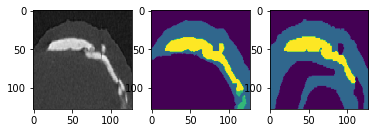

tensor(0.5856, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.91055   0.99268   0.94984     12151
           1    0.96574   0.70961   0.81809      4091
           3    0.97710   0.90141   0.93773       142

    accuracy                        0.92120     16384
   macro avg    0.95113   0.86790   0.90189     16384
weighted avg    0.92490   0.92120   0.91684     16384

[0.7597006559371948, 0.7701743841171265, 0.49889451265335083, 0.5570451617240906]


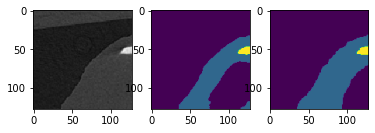

tensor(0.7449, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.61483   0.99773   0.76082      7929
           1    0.99488   0.41384   0.58453      8455

    accuracy                        0.69641     16384
   macro avg    0.80486   0.70578   0.67267     16384
weighted avg    0.81096   0.69641   0.66985     16384

[0.4838210344314575, 0.5311412215232849, 0.4995400905609131, 0.49991416931152344]


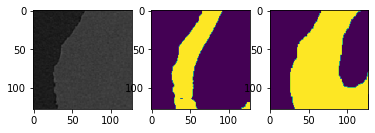

tensor(0.8062, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.43120   1.00000   0.60258      6246
           1    1.00000   0.18732   0.31553     10138

    accuracy                        0.49713     16384
   macro avg    0.71560   0.59366   0.45905     16384
weighted avg    0.78316   0.49713   0.42496     16384

[0.35043132305145264, 0.4307249188423157, 0.4995211362838745, 0.4999293088912964]


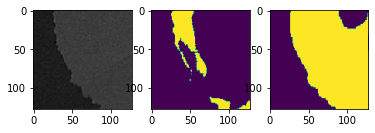

tensor(0.8036, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70802   0.99595   0.82766     11614
           1    0.00000   0.00000   0.00000      4770

    accuracy                        0.70599     16384
   macro avg    0.35401   0.49798   0.41383     16384
weighted avg    0.50189   0.70599   0.58670     16384

[0.39296311140060425, 0.4046558141708374, 0.49981510639190674, 0.4999774694442749]


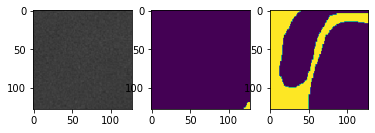

tensor(0.8486, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.43760   1.00000   0.60879      7051
           1    1.00000   0.02904   0.05643      9333

    accuracy                        0.44690     16384
   macro avg    0.71880   0.51452   0.33261     16384
weighted avg    0.75796   0.44690   0.29415     16384

[0.2908273935317993, 0.33749914169311523, 0.4998161792755127, 0.49996161460876465]


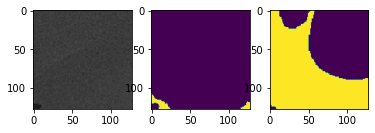

tensor(0.7242, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75473   0.85038   0.79971     10881
           1    0.89617   0.39439   0.54773      5165
           2    0.00000   0.00000   0.00000         0
           3    0.54474   0.61243   0.57660       338

    accuracy                        0.70172     16384
   macro avg    0.54891   0.46430   0.48101     16384
weighted avg    0.79499   0.70172   0.71567     16384

[0.4540741443634033, 0.5689888596534729, 0.4743996262550354, 0.572555422782898]


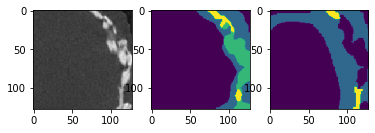

tensor(0.6157, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69547   0.91667   0.79089      8640
           1    0.95135   0.43774   0.59959      6344
           2    0.00000   0.00000   0.00000         0
           3    0.95052   0.59000   0.72807      1400

    accuracy                        0.70331     16384
   macro avg    0.64933   0.48610   0.52964     16384
weighted avg    0.81634   0.70331   0.71145     16384

[0.5881294012069702, 0.6742144823074341, 0.47737860679626465, 0.6538809537887573]


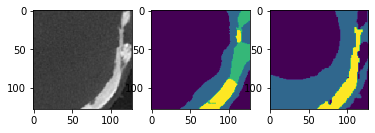

tensor(0.4643, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73696   0.81613   0.77453      6907
           1    0.77886   0.69934   0.73696      7111
           2    0.00000   0.00000   0.00000         0
           3    0.94042   0.71386   0.81163      2366

    accuracy                        0.75067     16384
   macro avg    0.61406   0.55733   0.58078     16384
weighted avg    0.78453   0.75067   0.76358     16384

[0.7798012495040894, 0.7578072547912598, 0.4880383014678955, 0.8063966035842896]


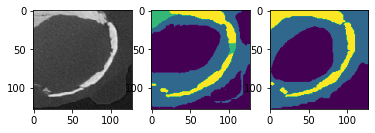

tensor(0.6802, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.06847   0.90667   0.12732       450
           1    0.87970   0.45342   0.59841     10370
           2    0.00000   0.00000   0.00000         0
           3    0.98883   0.73203   0.84127      5564

    accuracy                        0.56049     16384
   macro avg    0.48425   0.52303   0.39175     16384
weighted avg    0.89448   0.56049   0.66795     16384

[0.38257402181625366, 0.5982459783554077, 0.47970104217529297, 0.774441659450531]


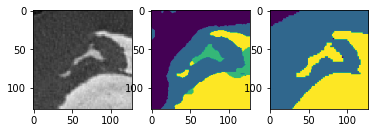

tensor(0.5488, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58169   0.58294   0.58231      4208
           1    0.75930   0.75779   0.75854      8055
           2    0.00000   0.00000   0.00000         0
           3    0.93941   0.53045   0.67804      4121

    accuracy                        0.65570     16384
   macro avg    0.57010   0.46780   0.50472     16384
weighted avg    0.75898   0.65570   0.69303     16384

[0.6605381369590759, 0.7450824975967407, 0.4631195068359375, 0.7517340183258057]


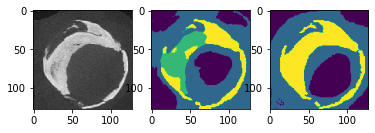

tensor(0.7159, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.79542   0.83249   0.81353     11307
           1    0.54935   0.49194   0.51906      4775
           2    0.00000   0.00000   0.00000         0
           3    0.97222   0.23179   0.37433       302

    accuracy                        0.72217     16384
   macro avg    0.57925   0.38905   0.42673     16384
weighted avg    0.72696   0.72217   0.71962     16384

[0.5258843898773193, 0.5457593202590942, 0.4966186285018921, 0.5298547148704529]


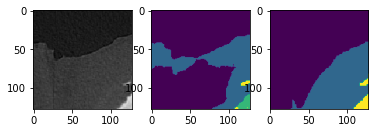

tensor(0.6149, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77026   0.97268   0.85972      9555
           1    0.87369   0.46804   0.60954      5335
           2    0.00000   0.00000   0.00000         0
           3    0.97266   0.50000   0.66048      1494

    accuracy                        0.76526     16384
   macro avg    0.65415   0.48518   0.53244     16384
weighted avg    0.82240   0.76526   0.76009     16384

[0.6178116798400879, 0.656287670135498, 0.4868435859680176, 0.6676563024520874]


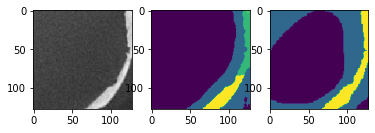

tensor(0.6118, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.85763   0.90803   0.88211     11895
           1    0.64373   0.52064   0.57568      3828
           3    0.93804   0.98487   0.96089       661

    accuracy                        0.82062     16384
   macro avg    0.81313   0.80451   0.80622     16384
weighted avg    0.81090   0.82062   0.81369     16384

[0.6444441080093384, 0.644631028175354, 0.49752914905548096, 0.631312370300293]


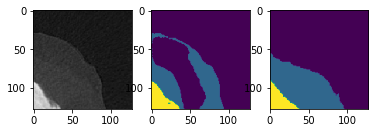

tensor(0.8699, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.99517   0.30930   0.47193     11319
           1    0.09419   0.02113   0.03451      5065
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.22021     16384
   macro avg    0.27234   0.08261   0.12661     16384
weighted avg    0.71664   0.22021   0.33670     16384

[0.5338112115859985, 0.3779115676879883, 0.25730228424072266, 0.49860167503356934]


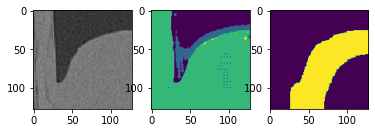

tensor(0.9877, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.96393   0.02805   0.05452     10481
           1    0.01899   0.00051   0.00099      5903
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.01813     16384
   macro avg    0.24573   0.00714   0.01388     16384
weighted avg    0.62348   0.01813   0.03523     16384

[0.2368912696838379, 0.33281439542770386, 0.15343976020812988, 0.49786490201950073]


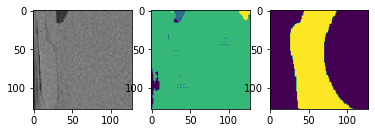

tensor(0.9024, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.99463   0.22361   0.36514     11587
           1    0.03387   0.00917   0.01444      4797
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.16083     16384
   macro avg    0.25712   0.05820   0.09489     16384
weighted avg    0.71333   0.16083   0.26246     16384

[0.46681493520736694, 0.3864997625350952, 0.27736592292785645, 0.4967094659805298]


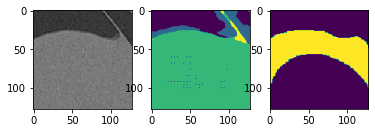

tensor(0.9897, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.00202   0.00402     15375
           1    0.00000   0.00000   0.00000      1009
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.00189     16384
   macro avg    0.25000   0.00050   0.00101     16384
weighted avg    0.93842   0.00189   0.00378     16384

[0.08925783634185791, 0.4833465814590454, 0.1591963768005371, 0.4981372356414795]


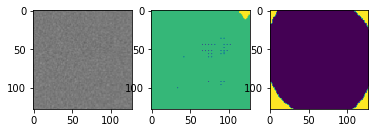

tensor(0.9010, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.35967   0.52905     12581
           1    0.00371   0.00421   0.00394      3803
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.27716     16384
   macro avg    0.25093   0.09097   0.13325     16384
weighted avg    0.76874   0.27716   0.40717     16384

[0.42417585849761963, 0.3171965479850769, 0.3657522201538086, 0.4913609027862549]


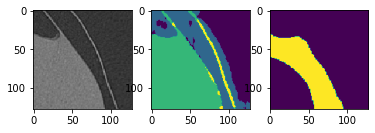

tensor(0.9535, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87064   0.17474   0.29106     11440
           1    0.00214   0.00101   0.00137      4944
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.12231     16384
   macro avg    0.21820   0.04394   0.07311     16384
weighted avg    0.60857   0.12231   0.20364     16384

[0.2757312059402466, 0.30992692708969116, 0.27316415309906006, 0.4918527603149414]


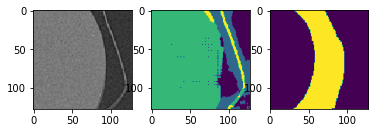

tensor(0.8221, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.25650   0.75970   0.38352      3479
           1    0.74598   0.26764   0.39394     11960
           2    0.24524   0.38926   0.30091       894
           3    0.03784   0.27451   0.06651        51

    accuracy                        0.37878     16384
   macro avg    0.32139   0.42278   0.28622     16384
weighted avg    0.61252   0.37878   0.38563     16384

[0.33345746994018555, 0.33310604095458984, 0.5409519672393799, 0.5022992491722107]


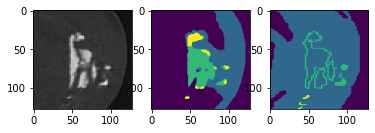

tensor(0.8533, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.16927   0.71384   0.27365      2551
           1    0.71216   0.19541   0.30667     12712
           2    0.24586   0.37547   0.29715      1068
           3    0.03945   0.37736   0.07143        53

    accuracy                        0.28845     16384
   macro avg    0.29168   0.41552   0.23722     16384
weighted avg    0.59506   0.28845   0.30014     16384

[0.28653979301452637, 0.2791706919670105, 0.5317897796630859, 0.49989479780197144]


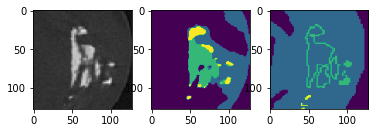

tensor(0.7773, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.21549   0.98371   0.35353      3069
           1    0.86750   0.07531   0.13860     11910
           3    0.97612   0.93096   0.95301      1405

    accuracy                        0.31885     16384
   macro avg    0.68637   0.66333   0.48171     16384
weighted avg    0.75469   0.31885   0.24870     16384

[0.284967303276062, 0.3180646300315857, 0.4981127977371216, 0.7037353515625]


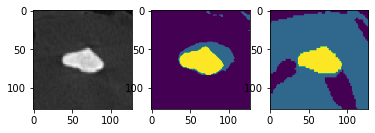

tensor(0.6384, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.96217   0.98130   0.97164     13687
           1    0.89443   0.80423   0.84693      2697

    accuracy                        0.95215     16384
   macro avg    0.92830   0.89276   0.90929     16384
weighted avg    0.95102   0.95215   0.95111     16384

[0.7119328379631042, 0.7115827798843384, 0.4989994168281555, 0.49993157386779785]


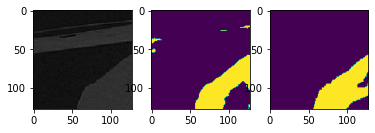

tensor(0.7013, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76133   0.92166   0.83386     10352
           1    0.78946   0.50414   0.61534      6032

    accuracy                        0.76794     16384
   macro avg    0.77540   0.71290   0.72460     16384
weighted avg    0.77169   0.76794   0.75341     16384

[0.5739856362342834, 0.609767496585846, 0.4991718530654907, 0.4999169707298279]


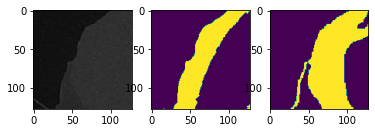

tensor(0.7500, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76876   0.88514   0.82286     12267
           1    0.37655   0.20670   0.26690      4117

    accuracy                        0.71466     16384
   macro avg    0.57266   0.54592   0.54488     16384
weighted avg    0.67021   0.71466   0.68315     16384

[0.4932342767715454, 0.5034782290458679, 0.499083936214447, 0.49995285272598267]


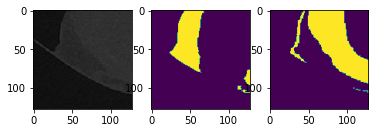

tensor(0.5728, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72573   0.83782   0.77776      9058
           1    0.71956   0.57352   0.63829      6760
           3    0.97217   0.92580   0.94842       566

    accuracy                        0.73181     16384
   macro avg    0.80582   0.77905   0.78816     16384
weighted avg    0.73170   0.73181   0.72611     16384

[0.6957867741584778, 0.7020707130432129, 0.4987773299217224, 0.6514056921005249]


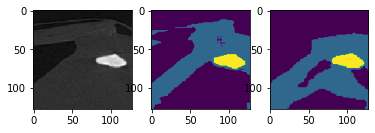

tensor(0.7778, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.65391   0.99862   0.79031     10115
           1    0.98506   0.14723   0.25618      6269

    accuracy                        0.67285     16384
   macro avg    0.81949   0.57292   0.52324     16384
weighted avg    0.78062   0.67285   0.58594     16384

[0.42964494228363037, 0.46450358629226685, 0.4998762607574463, 0.49992847442626953]


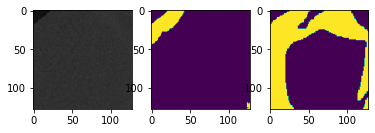

tensor(0.7372, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.65811   0.94044   0.77434     10494
           1    0.52148   0.11866   0.19332      5832
           3    0.78689   0.82759   0.80672        58

    accuracy                        0.64752     16384
   macro avg    0.65549   0.62889   0.59146     16384
weighted avg    0.60993   0.64752   0.56764     16384

[0.46640151739120483, 0.5065287351608276, 0.49933546781539917, 0.5454071760177612]


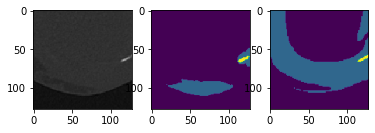

tensor(0.6004, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69509   0.82641   0.75508      8474
           1    0.72067   0.55380   0.62631      7221
           2    0.75000   0.02381   0.04615       126
           3    0.68783   0.92362   0.78848       563

    accuracy                        0.70343     16384
   macro avg    0.71340   0.58191   0.55401     16384
weighted avg    0.70654   0.70343   0.69402     16384

[0.629460334777832, 0.6605998277664185, 0.5103615522384644, 0.6468912959098816]


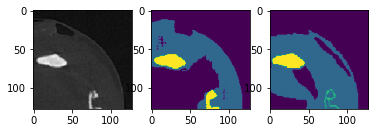

tensor(0.8097, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.54757   0.92508   0.68794      7061
           1    0.79762   0.29832   0.43423      8759
           2    0.18730   0.21989   0.20229       523
           3    0.02478   0.34146   0.04620        41

    accuracy                        0.56604     16384
   macro avg    0.38932   0.44619   0.34267     16384
weighted avg    0.66844   0.56604   0.53520     16384

[0.39424800872802734, 0.40823936462402344, 0.5100865960121155, 0.49588191509246826]


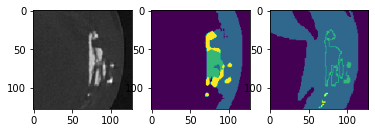

tensor(0.5759, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.79390   0.95656   0.86767     10313
           1    0.84899   0.50282   0.63158      5680
           2    0.38140   0.63077   0.47536       260
           3    0.56098   0.70229   0.62373       131

    accuracy                        0.79205     16384
   macro avg    0.64632   0.69811   0.64959     16384
weighted avg    0.80459   0.79205   0.77765     16384

[0.7012388110160828, 0.7057061195373535, 0.5539647340774536, 0.5796917676925659]


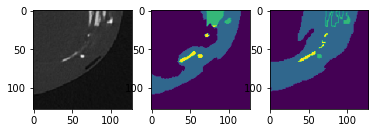

tensor(0.4806, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.86891   0.98024   0.92123      8757
           1    0.91397   0.76726   0.83421      5663
           2    0.45004   0.64126   0.52890       892
           3    0.71458   0.31996   0.44201      1072

    accuracy                        0.84497     16384
   macro avg    0.73688   0.67718   0.68159     16384
weighted avg    0.85158   0.84497   0.83844     16384

[0.8836769461631775, 0.8766034841537476, 0.5913528203964233, 0.5481837391853333]


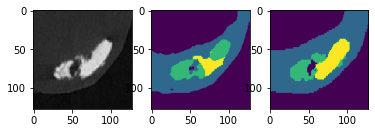

tensor(0.5795, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74700   0.85627   0.79791      9003
           1    0.67684   0.55700   0.61110      5851
           2    0.96231   0.47009   0.63163      1521
           3    0.00000   0.00000   0.00000         9

    accuracy                        0.71307     16384
   macro avg    0.59654   0.47084   0.51016     16384
weighted avg    0.74152   0.71307   0.71532     16384

[0.6985911130905151, 0.6959388256072998, 0.6657615900039673, 0.4919013977050781]


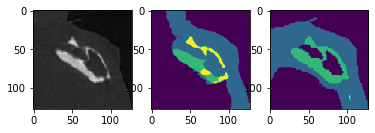

tensor(0.5284, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74265   0.78312   0.76234      7285
           1    0.69902   0.70875   0.70385      6472
           2    0.96393   0.48178   0.64246      2607
           3    0.00000   0.00000   0.00000        20

    accuracy                        0.70483     16384
   macro avg    0.60140   0.49341   0.52716     16384
weighted avg    0.75972   0.70483   0.71923     16384

[0.7614170908927917, 0.7508506774902344, 0.7069004774093628, 0.4863663911819458]


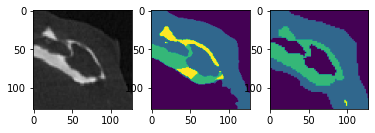

tensor(0.6440, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.90723   0.91677   0.91198     11222
           1    0.80862   0.79320   0.80083      5087
           2    0.00000   0.00000   0.00000        75
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.87421     16384
   macro avg    0.42896   0.42749   0.42820     16384
weighted avg    0.87246   0.87421   0.87329     16384

[0.697458028793335, 0.7102731466293335, 0.5044817328453064, 0.4990130662918091]


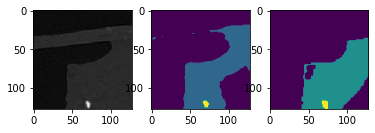

tensor(0.7380, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.80159   0.97310   0.87905      9553
           1    0.94060   0.65906   0.77506      6752
           2    0.00000   0.00000   0.00000        79
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.83899     16384
   macro avg    0.43555   0.40804   0.41353     16384
weighted avg    0.85501   0.83899   0.83196     16384

[0.506636381149292, 0.5545361638069153, 0.5043460726737976, 0.49904656410217285]


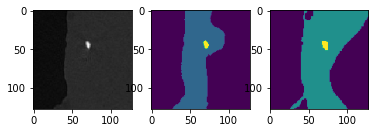

tensor(0.6135, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76088   0.80505   0.78234      9751
           1    0.61498   0.56784   0.59047      5727
           2    0.94311   0.34768   0.50806       906
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.69684     16384
   macro avg    0.57974   0.43014   0.47022     16384
weighted avg    0.71996   0.69684   0.70010     16384

[0.6824260354042053, 0.7026358842849731, 0.6124387383460999, 0.4928100109100342]


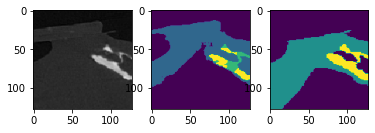

tensor(0.7485, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.82481   0.99630   0.90248     13232
           1    0.56846   0.04665   0.08622      2937
           2    0.00000   0.00000   0.00000       215
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.81299     16384
   macro avg    0.34832   0.26074   0.24717     16384
weighted avg    0.76804   0.81299   0.74432     16384

[0.5223937034606934, 0.5258213877677917, 0.5348007082939148, 0.4975842237472534]


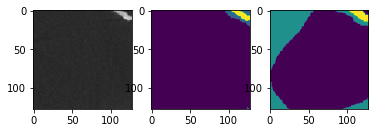

tensor(0.5581, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.54523   0.85658   0.66633      4567
           1    0.84865   0.61630   0.71405      8616
           2    0.94667   0.55530   0.70000      3101
           3    0.03530   0.40000   0.06488       100

    accuracy                        0.67041     16384
   macro avg    0.59396   0.60704   0.53631     16384
weighted avg    0.77766   0.67041   0.69412     16384

[0.6719313859939575, 0.708881139755249, 0.737469494342804, 0.48237407207489014]


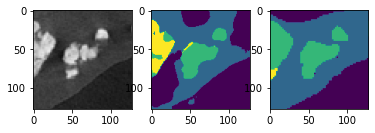

tensor(0.6732, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.31637   0.96878   0.47698      3427
           1    0.94255   0.38446   0.54615     11650
           2    0.96710   0.74216   0.83983      1307
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.53522     16384
   macro avg    0.55651   0.52385   0.46574     16384
weighted avg    0.81353   0.53522   0.55511     16384

[0.48790431022644043, 0.5445801019668579, 0.6438605785369873, 0.4977593421936035]


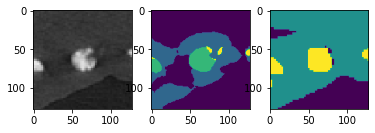

tensor(0.5068, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55828   0.84153   0.67125      3944
           1    0.86779   0.66609   0.75368      8110
           2    0.41425   0.64394   0.50417      1643
           3    0.70843   0.43766   0.54106      2687

    accuracy                        0.66864     16384
   macro avg    0.63719   0.64731   0.61754     16384
weighted avg    0.72167   0.66864   0.67395     16384

[0.7442634105682373, 0.7813027501106262, 0.5784260034561157, 0.6326956152915955]


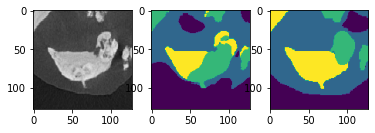

tensor(0.5982, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.18620   0.47635   0.26774      2135
           1    0.78261   0.51936   0.62437      9531
           2    0.81487   0.72092   0.76502      3938
           3    0.20845   0.29744   0.24511       780

    accuracy                        0.55164     16384
   macro avg    0.49803   0.50352   0.47556     16384
weighted avg    0.68531   0.55164   0.59365     16384

[0.5464504361152649, 0.6283953189849854, 0.6738409996032715, 0.5516170263290405]


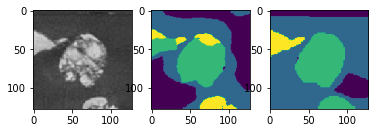

tensor(0.6021, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.47827   0.77313   0.59096      5836
           1    0.67661   0.38192   0.48825      8431
           2    0.82774   0.60605   0.69975      2117
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.55023     16384
   macro avg    0.49566   0.44028   0.44474     16384
weighted avg    0.62549   0.55023   0.55216     16384

[0.5951398015022278, 0.5663397908210754, 0.7364593744277954, 0.48942452669143677]


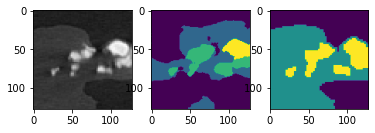

tensor(0.5554, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.52804   0.84117   0.64880      3381
           1    0.89897   0.69993   0.78706      8848
           2    0.41102   0.81936   0.54743      1384
           3    0.85630   0.41718   0.56103      2771

    accuracy                        0.69135     16384
   macro avg    0.67358   0.69441   0.63608     16384
weighted avg    0.77399   0.69135   0.70006     16384

[0.617131769657135, 0.7523664236068726, 0.54526287317276, 0.6649278998374939]


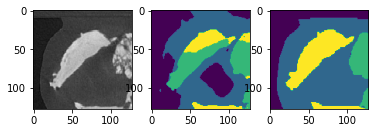

tensor(0.5534, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.89172   0.88258   0.88713     10833
           1    0.58974   0.57858   0.58410      3436
           2    0.84949   0.70449   0.77022      2115
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.79584     16384
   macro avg    0.58274   0.54141   0.56036     16384
weighted avg    0.82294   0.79584   0.80849     16384

[0.6997183561325073, 0.6293973326683044, 0.749068021774292, 0.49123620986938477]


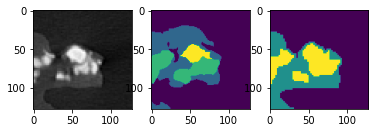

tensor(0.6872, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.89232   1.00000   0.94309     13797
           1    0.99091   0.16334   0.28045      2002
           2    0.00000   0.00000   0.00000         0
           3    0.95798   0.38974   0.55407       585

    accuracy                        0.87598     16384
   macro avg    0.71030   0.38827   0.44440     16384
weighted avg    0.90671   0.87598   0.84823     16384

[0.5867519974708557, 0.5669517517089844, 0.49258172512054443, 0.5772061944007874]


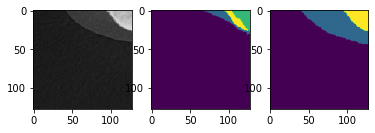

tensor(0.7500, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.4998267889022827, 0.4970782995223999, 0.49962711334228516, 0.49999284744262695]


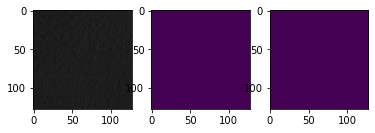

tensor(0.7500, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49984419345855713, 0.49748939275741577, 0.49958109855651855, 0.4999932646751404]


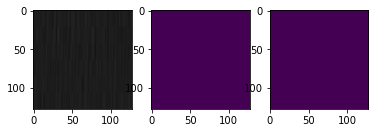

tensor(0.6050, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.83396   1.00000   0.90946     10904
           1    0.96031   0.25253   0.39989      2970
           2    0.07887   1.00000   0.14621       165
           3    0.96101   0.17868   0.30133      2345

    accuracy                        0.74695     16384
   macro avg    0.70854   0.60780   0.43922     16384
weighted avg    0.86744   0.74695   0.72236     16384

[0.8145699501037598, 0.6373194456100464, 0.5236110091209412, 0.5966911315917969]


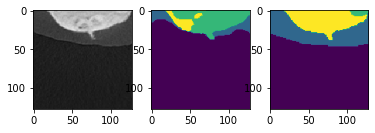

tensor(0.7500, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.4998377561569214, 0.4972352981567383, 0.49964141845703125, 0.4999929666519165]


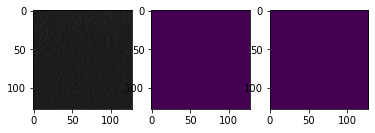

tensor(0.7500, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49983805418014526, 0.4973684549331665, 0.499591588973999, 0.49999338388442993]


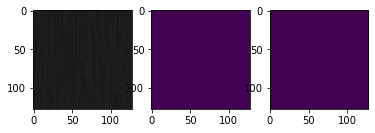

tensor(0.7268, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.42132   0.93180   0.58027      5161
           1    0.78589   0.19478   0.31218      8348
           2    0.11769   0.63478   0.19857       460
           3    0.66667   0.11594   0.19753      2415

    accuracy                        0.42767     16384
   macro avg    0.49789   0.46932   0.32214     16384
weighted avg    0.63472   0.42767   0.37654     16384

[0.5024287700653076, 0.5184041857719421, 0.5255679488182068, 0.5292732119560242]


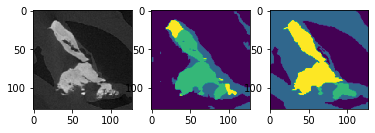

tensor(0.7700, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74490   0.91930   0.82296     12007
           1    0.38123   0.13639   0.20091      4377

    accuracy                        0.71014     16384
   macro avg    0.56307   0.52785   0.51194     16384
weighted avg    0.64775   0.71014   0.65678     16384

[0.4280070662498474, 0.5057239532470703, 0.4989827871322632, 0.4999274015426636]


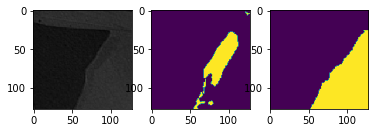

tensor(0.8066, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.44467   0.95580   0.60696      6651
           1    0.85920   0.18432   0.30353      9733

    accuracy                        0.49750     16384
   macro avg    0.65193   0.57006   0.45524     16384
weighted avg    0.69092   0.49750   0.42670     16384

[0.353424608707428, 0.41808974742889404, 0.4993751049041748, 0.49990594387054443]


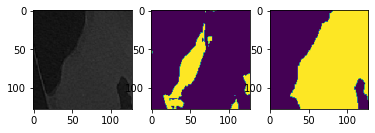

tensor(0.8101, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.49617   0.97523   0.65771      7831
           1    0.80444   0.09330   0.16721      8553

    accuracy                        0.51483     16384
   macro avg    0.65030   0.53426   0.41246     16384
weighted avg    0.65709   0.51483   0.40165     16384

[0.3564639091491699, 0.4087038040161133, 0.4995466470718384, 0.49991852045059204]


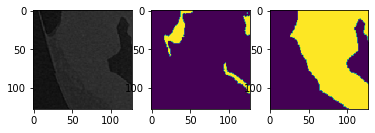

tensor(0.7684, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.82331   0.99940   0.90285     13381
           1    0.94326   0.04429   0.08461      3003

    accuracy                        0.82434     16384
   macro avg    0.88329   0.52185   0.49373     16384
weighted avg    0.84529   0.82434   0.75287     16384

[0.4532896876335144, 0.48026537895202637, 0.4991159439086914, 0.4999430179595947]


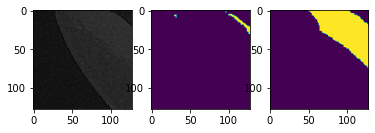

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.99969   0.99985     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.99969     16384
   macro avg    0.50000   0.49985   0.49992     16384
weighted avg    1.00000   0.99969   0.99985     16384

[0.499442458152771, 0.49466705322265625, 0.49801623821258545, 0.4999781847000122]


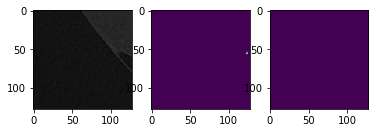

tensor(0.8358, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.36110   0.86254   0.50908      5900
           1    0.40918   0.06215   0.10791      9606
           2    0.00000   0.00000   0.00000         0
           3    0.92857   0.13326   0.23307       878

    accuracy                        0.35419     16384
   macro avg    0.42471   0.26449   0.21251     16384
weighted avg    0.41970   0.35419   0.25908     16384

[0.34031569957733154, 0.32665687799453735, 0.48895686864852905, 0.521653950214386]


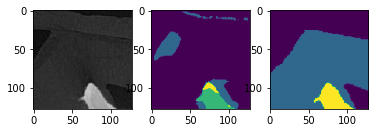

tensor(0.8692, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.18481   0.99011   0.31148      2123
           1    0.89451   0.12094   0.21307     10518
           2    0.00000   0.00000   0.00000        14
           3    0.97400   0.15071   0.26103      3729

    accuracy                        0.24023     16384
   macro avg    0.51333   0.31544   0.19639     16384
weighted avg    0.81988   0.24023   0.23655     16384

[0.28531962633132935, 0.4133012294769287, 0.43711453676223755, 0.4714761972427368]


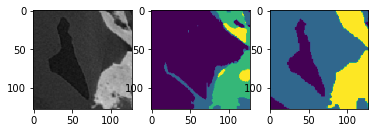

tensor(0.7788, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.81248   0.99947   0.89633     13313
           1    0.00000   0.00000   0.00000      3071

    accuracy                        0.81213     16384
   macro avg    0.40624   0.49974   0.44816     16384
weighted avg    0.66019   0.81213   0.72832     16384

[0.4425809383392334, 0.44552361965179443, 0.4989582300186157, 0.4999529719352722]


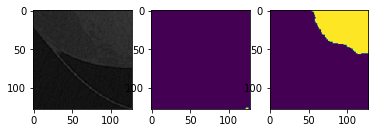

tensor(0.8218, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.43051   0.95491   0.59347      6764
           1    0.61745   0.06065   0.11044      9102
           2    0.00000   0.00000   0.00000         0
           3    0.93878   0.08880   0.16226       518

    accuracy                        0.43073     16384
   macro avg    0.49668   0.27609   0.21654     16384
weighted avg    0.55043   0.43073   0.31149     16384

[0.36223357915878296, 0.3715837001800537, 0.4933966398239136, 0.5081735253334045]


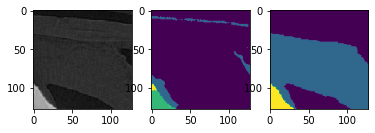

tensor(0.7852, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64864   0.99781   0.78620     10507
           1    0.89593   0.03369   0.06494      5877

    accuracy                        0.65198     16384
   macro avg    0.77228   0.51575   0.42557     16384
weighted avg    0.73734   0.65198   0.52748     16384

[0.4079672694206238, 0.45581042766571045, 0.49905186891555786, 0.4999445676803589]


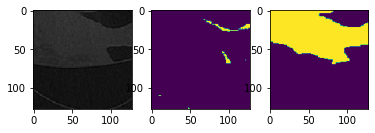

tensor(0.7340, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74168   0.96222   0.83768     11646
           1    0.65490   0.17623   0.27773      4738

    accuracy                        0.73492     16384
   macro avg    0.69829   0.56923   0.55770     16384
weighted avg    0.71658   0.73492   0.67575     16384

[0.5184341669082642, 0.5420535206794739, 0.49940621852874756, 0.4999135732650757]


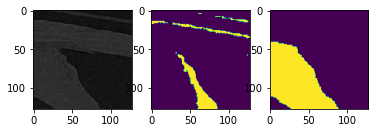

tensor(0.7383, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60901   0.99802   0.75643      9085
           1    0.98797   0.20249   0.33610      7299

    accuracy                        0.64362     16384
   macro avg    0.79849   0.60026   0.54627     16384
weighted avg    0.77784   0.64362   0.56918     16384

[0.4840809106826782, 0.5782381892204285, 0.4992977976799011, 0.4999208450317383]


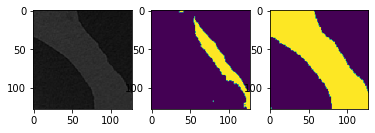

tensor(0.6764, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55914   0.95354   0.70493      7684
           1    0.82607   0.24780   0.38124      7724
           2    0.53130   0.60132   0.56414       607
           3    0.20652   0.15447   0.17674       369

    accuracy                        0.58978     16384
   macro avg    0.53076   0.48928   0.45676     16384
weighted avg    0.67601   0.58978   0.53522     16384

[0.5815017223358154, 0.5867921113967896, 0.5751444101333618, 0.5042729377746582]


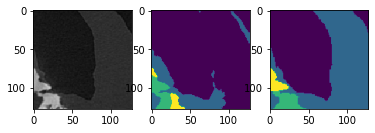

tensor(0.7347, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.32594   0.95067   0.48544      4095
           1    0.87987   0.23652   0.37282     10591
           2    0.70023   0.69601   0.69811      1329
           3    0.02574   0.01897   0.02184       369

    accuracy                        0.44739     16384
   macro avg    0.48294   0.47554   0.39455     16384
weighted avg    0.70761   0.44739   0.41945     16384

[0.4527534246444702, 0.4966087341308594, 0.594464898109436, 0.4924657940864563]


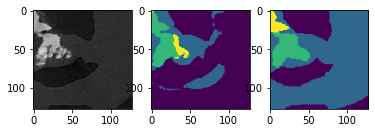

tensor(0.7405, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71567   0.99885   0.83387     11269
           1    0.98018   0.12571   0.22284      5115

    accuracy                        0.72626     16384
   macro avg    0.84792   0.56228   0.52835     16384
weighted avg    0.79825   0.72626   0.64311     16384

[0.49078369140625, 0.5563782453536987, 0.49878817796707153, 0.4999605417251587]


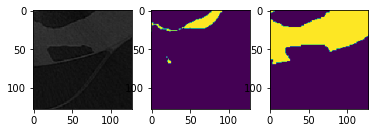

[0.52249752 0.55293192 0.51067372 0.54376498] 0.7060897730766459


In [104]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 
import warnings
warnings.filterwarnings("ignore")


op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 4

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_2_4_classes_onlyCalc'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 1-4  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


Images and masks are created: 94
tensor(0.7049, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60583   0.87158   0.71481      7320
           1    0.76476   0.40999   0.53381      7644
           2    0.34569   0.98858   0.51226       613
           3    0.50000   0.00124   0.00247       807

    accuracy                        0.61774     16384
   macro avg    0.55407   0.56785   0.44084     16384
weighted avg    0.66504   0.61774   0.58770     16384

[0.5375718474388123, 0.5394463539123535, 0.5517456531524658, 0.48824554681777954]


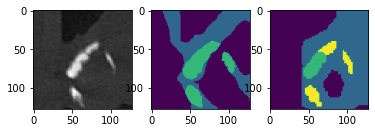

tensor(0.5541, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55591   0.93599   0.69753      4499
           1    0.94974   0.59353   0.73053      8692
           2    0.40800   0.98964   0.57779      1351
           3    0.80000   0.04343   0.08239      1842

    accuracy                        0.65839     16384
   macro avg    0.67841   0.64065   0.52206     16384
weighted avg    0.78009   0.65839   0.63601     16384

[0.7414002418518066, 0.7718002200126648, 0.5903158783912659, 0.4827617406845093]


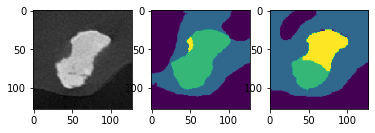

tensor(0.6704, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.98367   0.76653   0.86163     13278
           1    0.48650   0.94559   0.64246      3106

    accuracy                        0.80048     16384
   macro avg    0.73508   0.85606   0.75204     16384
weighted avg    0.88942   0.80048   0.82008     16384

[0.6524786353111267, 0.6469561457633972, 0.4998180866241455, 0.4995810389518738]


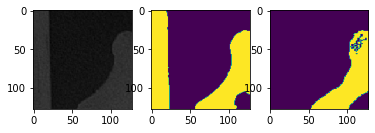

tensor(0.6521, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58737   0.70443   0.64059      7592
           1    0.63519   0.50038   0.55978      7850
           2    0.56530   0.99199   0.72019       624
           3    0.00000   0.00000   0.00000       318

    accuracy                        0.60394     16384
   macro avg    0.44696   0.54920   0.48014     16384
weighted avg    0.59804   0.60394   0.59247     16384

[0.5978092551231384, 0.6017395257949829, 0.5874801278114319, 0.49592268466949463]


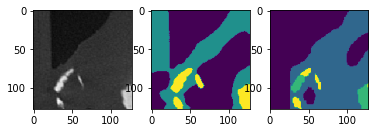

tensor(0.6252, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77885   0.83746   0.80709     10379
           1    0.58498   0.46814   0.52008      5007
           2    0.57362   0.98394   0.72473       685
           3    0.00000   0.00000   0.00000       313

    accuracy                        0.71472     16384
   macro avg    0.48436   0.57239   0.51298     16384
weighted avg    0.69614   0.71472   0.70052     16384

[0.6610073447227478, 0.6609581112861633, 0.5860881805419922, 0.4947316646575928]


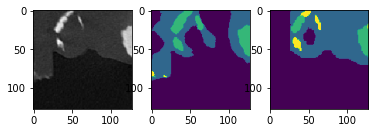

tensor(0.7178, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.48806   0.94420   0.64350      6559
           1    0.90095   0.33883   0.49246      9825

    accuracy                        0.58118     16384
   macro avg    0.69450   0.64151   0.56798     16384
weighted avg    0.73566   0.58118   0.55292     16384

[0.5503889322280884, 0.5841639041900635, 0.49972856044769287, 0.49978089332580566]


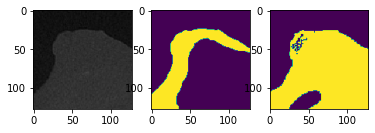

tensor(0.6175, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.67128   0.99720   0.80241      7143
           1    0.95841   0.51075   0.66638      7534
           2    0.16168   0.37436   0.22583       390
           3    0.62456   0.40547   0.49171      1317

    accuracy                        0.71112     16384
   macro avg    0.60398   0.57194   0.54658     16384
weighted avg    0.78743   0.71112   0.70116     16384

[0.6856739521026611, 0.6714176535606384, 0.5259851217269897, 0.5348306894302368]


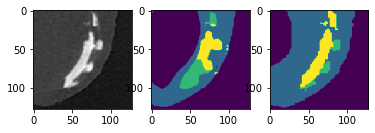

tensor(0.4769, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75956   0.98836   0.85899      6872
           1    0.96863   0.72003   0.82603      7933
           2    0.00000   0.00000   0.00000       224
           3    0.83301   0.94982   0.88759      1355

    accuracy                        0.84174     16384
   macro avg    0.64030   0.66455   0.64315     16384
weighted avg    0.85648   0.84174   0.83365     16384

[0.8253200054168701, 0.8431505560874939, 0.49521052837371826, 0.7179172039031982]


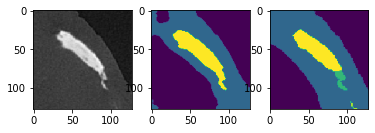

tensor(0.6726, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77737   0.99749   0.87378     10351
           1    0.99162   0.51369   0.67679      5988
           3    0.00000   0.00000   0.00000        45

    accuracy                        0.81793     16384
   macro avg    0.58966   0.50373   0.51686     16384
weighted avg    0.85354   0.81793   0.79938     16384

[0.6379907131195068, 0.6649655103683472, 0.49975156784057617, 0.49929535388946533]


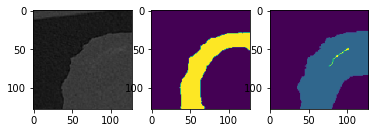

tensor(0.7597, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74062   0.99738   0.85003      9911
           1    0.99144   0.46516   0.63323      6473

    accuracy                        0.78711     16384
   macro avg    0.86603   0.73127   0.74163     16384
weighted avg    0.83971   0.78711   0.76438     16384

[0.47347819805145264, 0.49619507789611816, 0.4997202157974243, 0.49974894523620605]


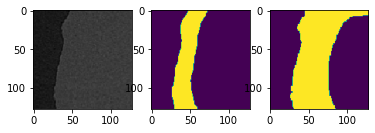

tensor(0.6989, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69793   0.99755   0.82127      8966
           1    0.99300   0.47847   0.64577      7407
           3    0.00000   0.00000   0.00000        11

    accuracy                        0.76221     16384
   macro avg    0.56364   0.49200   0.48901     16384
weighted avg    0.83086   0.76221   0.74138     16384

[0.5921880602836609, 0.6154747605323792, 0.49873149394989014, 0.499619722366333]


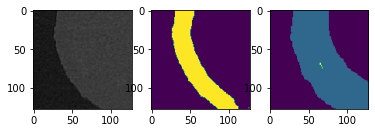

tensor(0.6225, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63013   0.99655   0.77207      7828
           1    0.98649   0.42870   0.59767      8008
           3    0.91985   0.87956   0.89925       548

    accuracy                        0.71509     16384
   macro avg    0.84549   0.76827   0.75633     16384
weighted avg    0.81400   0.71509   0.69108     16384

[0.6554323434829712, 0.6922805309295654, 0.4996943473815918, 0.582587718963623]


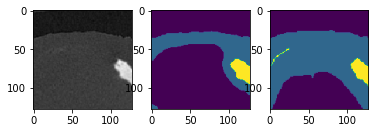

tensor(0.6926, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87525   0.99985   0.93341     13725
           1    0.96101   0.17568   0.29706      2385
           3    0.96283   0.94526   0.95396       274

    accuracy                        0.87897     16384
   macro avg    0.93303   0.70693   0.72814     16384
weighted avg    0.88920   0.87897   0.84112     16384

[0.5494528412818909, 0.5504360198974609, 0.49958711862564087, 0.574050784111023]


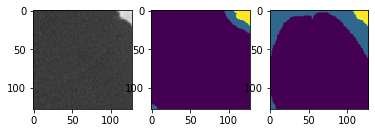

tensor(0.7638, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72017   0.99912   0.83701     11326
           1    0.98510   0.13068   0.23076      5058

    accuracy                        0.73102     16384
   macro avg    0.85263   0.56490   0.53388     16384
weighted avg    0.80196   0.73102   0.64985     16384

[0.4694772958755493, 0.49964195489883423, 0.49961793422698975, 0.4999045133590698]


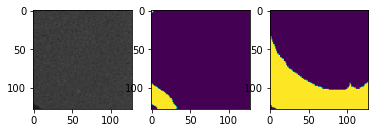

tensor(0.5265, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76603   0.99275   0.86478      8133
           1    0.95341   0.62773   0.75703      6780
           2    0.00000   0.00000   0.00000       220
           3    0.82536   0.91047   0.86583      1251

    accuracy                        0.82208     16384
   macro avg    0.63620   0.63274   0.62191     16384
weighted avg    0.83782   0.82208   0.80866     16384

[0.7448164820671082, 0.7464636564254761, 0.49535202980041504, 0.710909903049469]


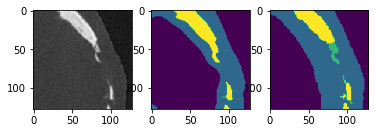

tensor(0.5845, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74443   0.98035   0.84626      7024
           1    0.94366   0.62961   0.75529      6917
           2    0.89273   0.59466   0.71383      2435
           3    0.00669   0.75000   0.01326         8

    accuracy                        0.77484     16384
   macro avg    0.64688   0.73866   0.58216     16384
weighted avg    0.85022   0.77484   0.78776     16384

[0.7165727615356445, 0.7218285202980042, 0.5894429683685303, 0.4931744337081909]


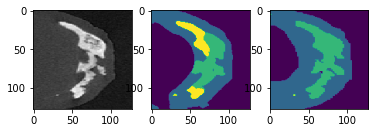

tensor(0.6768, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77859   0.98342   0.86910     10495
           1    0.94437   0.50435   0.65754      5857
           3    0.00000   0.00000   0.00000        32

    accuracy                        0.81024     16384
   macro avg    0.57432   0.49592   0.50888     16384
weighted avg    0.83633   0.81024   0.79177     16384

[0.628344714641571, 0.6552877426147461, 0.4997548460960388, 0.4992210865020752]


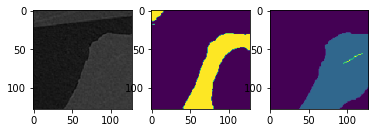

tensor(0.7295, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70130   0.99795   0.82373      9274
           1    0.99404   0.44557   0.61532      7110

    accuracy                        0.75824     16384
   macro avg    0.84767   0.72176   0.71953     16384
weighted avg    0.82833   0.75824   0.73329     16384

[0.5262297987937927, 0.5627318620681763, 0.499727725982666, 0.49972885847091675]


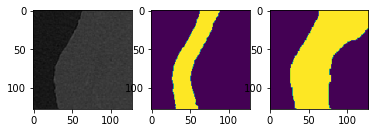

tensor(0.6451, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.80769   0.99357   0.89104      9638
           1    0.98279   0.63307   0.77009      6677
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000        69

    accuracy                        0.84247     16384
   macro avg    0.44762   0.40666   0.41528     16384
weighted avg    0.87565   0.84247   0.83799     16384

[0.6991433501243591, 0.7093537449836731, 0.49216651916503906, 0.4987485408782959]


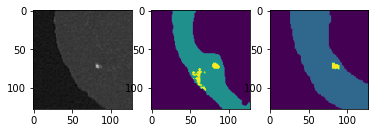

tensor(0.7631, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.43531   0.99822   0.60624      6195
           1    0.99495   0.21377   0.35193     10137
           3    0.00000   0.00000   0.00000        52

    accuracy                        0.50970     16384
   macro avg    0.47675   0.40400   0.31939     16384
weighted avg    0.78018   0.50970   0.44697     16384

[0.45353758335113525, 0.5111761689186096, 0.49969273805618286, 0.4990837574005127]


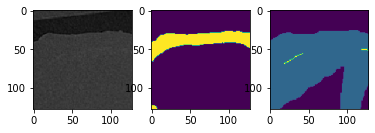

tensor(0.8172, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63443   0.99721   0.77549     10395
           1    0.35556   0.00267   0.00530      5989

    accuracy                        0.63367     16384
   macro avg    0.49499   0.49994   0.39040     16384
weighted avg    0.53249   0.63367   0.49396     16384

[0.36737334728240967, 0.39543336629867554, 0.4996321201324463, 0.4999103546142578]


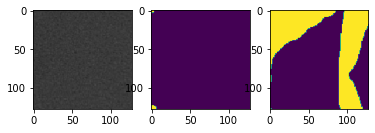

tensor(0.7618, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.61119   0.99221   0.75643      9113
           1    0.94726   0.19953   0.32962      7202
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000        69

    accuracy                        0.63959     16384
   macro avg    0.38961   0.29793   0.27151     16384
weighted avg    0.75635   0.63959   0.56563     16384

[0.470367968082428, 0.4980630874633789, 0.49827075004577637, 0.49893486499786377]


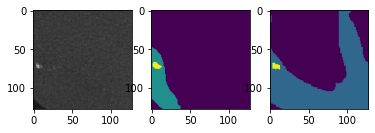

tensor(0.6491, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63639   0.99065   0.77495      7701
           1    0.96288   0.43081   0.59528      7646
           2    0.00000   0.00000   0.00000      1004
           3    0.00000   0.00000   0.00000        33

    accuracy                        0.66669     16384
   macro avg    0.39982   0.35537   0.34256     16384
weighted avg    0.74847   0.66669   0.64206     16384

[0.6978408694267273, 0.7108259797096252, 0.4861842393875122, 0.48342812061309814]


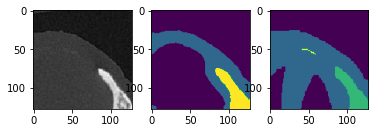

tensor(0.7536, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55914   0.99400   0.71569      6834
           1    0.91110   0.20693   0.33726      6983
           2    0.84799   0.36073   0.50615      2567
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.55933     16384
   macro avg    0.57956   0.39042   0.38978     16384
weighted avg    0.75440   0.55933   0.52157     16384

[0.4515601396560669, 0.5281041264533997, 0.5060776472091675, 0.4728466272354126]


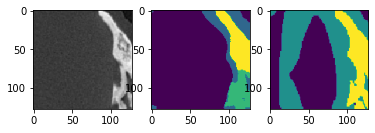

tensor(0.7383, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40560   0.98801   0.57510      5003
           1    0.94954   0.22643   0.36566      9641
           2    0.85596   0.71750   0.78064      1731
           3    0.02013   1.00000   0.03947         9

    accuracy                        0.51129     16384
   macro avg    0.55781   0.73299   0.44022     16384
weighted avg    0.77305   0.51129   0.47328     16384

[0.43689000606536865, 0.4714580178260803, 0.5647806525230408, 0.5023485422134399]


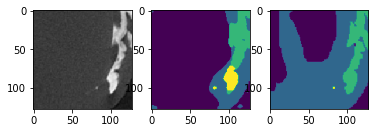

tensor(0.5427, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.80812   0.90705   0.85473      9500
           1    0.95248   0.57563   0.71759      5606
           2    0.00000   0.00000   0.00000         0
           3    0.52178   0.44053   0.47773      1278

    accuracy                        0.75726     16384
   macro avg    0.57060   0.48080   0.51251     16384
weighted avg    0.83518   0.75726   0.77840     16384

[0.7811471819877625, 0.7653783559799194, 0.47789645195007324, 0.6259931921958923]


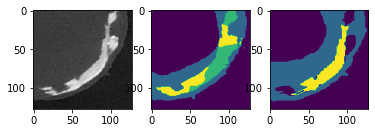

tensor(0.4363, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74346   0.93609   0.82873      7557
           1    0.97119   0.64547   0.77551      7311
           2    0.00000   0.00000   0.00000         0
           3    0.79207   0.96240   0.86897      1516

    accuracy                        0.80884     16384
   macro avg    0.62668   0.63599   0.61830     16384
weighted avg    0.84958   0.80884   0.80870     16384

[0.807704746723175, 0.8131864070892334, 0.4962650537490845, 0.8127385973930359]


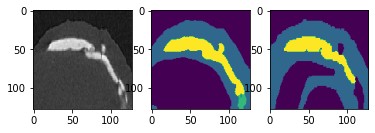

tensor(0.6102, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.89240   0.92215   0.90703     12151
           1    0.74163   0.66585   0.70170      4091
           3    0.89677   0.97887   0.93603       142

    accuracy                        0.85864     16384
   macro avg    0.84360   0.85562   0.84825     16384
weighted avg    0.85479   0.85864   0.85601     16384

[0.7152305841445923, 0.711300790309906, 0.4997549057006836, 0.555530846118927]


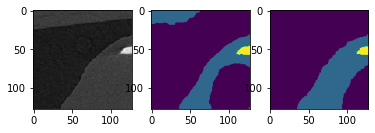

tensor(0.7630, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58957   0.99912   0.74155      7929
           1    0.99762   0.34772   0.51570      8455

    accuracy                        0.66296     16384
   macro avg    0.79360   0.67342   0.62863     16384
weighted avg    0.80015   0.66296   0.62500     16384

[0.46326571702957153, 0.49797672033309937, 0.49971628189086914, 0.4997101426124573]


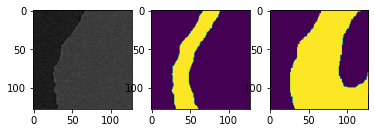

tensor(0.7525, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.49488   0.99808   0.66168      6246
           1    0.99683   0.37236   0.54219     10138

    accuracy                        0.61090     16384
   macro avg    0.74586   0.68522   0.60193     16384
weighted avg    0.80547   0.61090   0.58774     16384

[0.48598289489746094, 0.5112051963806152, 0.49945104122161865, 0.4997321367263794]


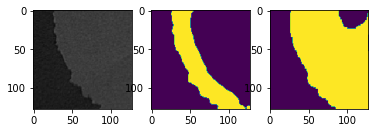

tensor(0.8028, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71029   1.00000   0.83061     11614
           1    1.00000   0.00692   0.01374      4770

    accuracy                        0.71088     16384
   macro avg    0.85515   0.50346   0.42218     16384
weighted avg    0.79464   0.71088   0.59279     16384

[0.3959518074989319, 0.4244624376296997, 0.49962711334228516, 0.4999138116836548]


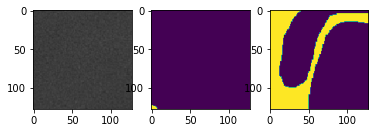

tensor(0.8388, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.45210   1.00000   0.62269      7051
           1    1.00000   0.08443   0.15572      9333

    accuracy                        0.47845     16384
   macro avg    0.72605   0.54222   0.38920     16384
weighted avg    0.76421   0.47845   0.35668     16384

[0.3216053247451782, 0.35897308588027954, 0.49962317943573, 0.49988341331481934]


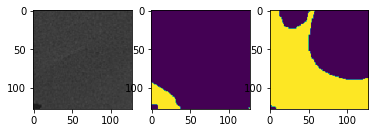

tensor(0.7190, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75950   0.84689   0.80082     10881
           1    0.93099   0.38916   0.54888      5165
           2    0.00000   0.00000   0.00000         0
           3    0.18765   0.70118   0.29606       338

    accuracy                        0.69958     16384
   macro avg    0.46953   0.48431   0.41144     16384
weighted avg    0.80176   0.69958   0.71098     16384

[0.46947962045669556, 0.5929093360900879, 0.48527204990386963, 0.5581458210945129]


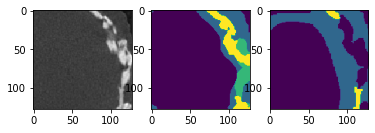

tensor(0.7097, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63728   0.89861   0.74571      8640
           1    0.89505   0.25946   0.40230      6344
           2    0.00000   0.00000   0.00000         0
           3    0.73897   0.28714   0.41358      1400

    accuracy                        0.59888     16384
   macro avg    0.56783   0.36130   0.39040     16384
weighted avg    0.74578   0.59888   0.58436     16384

[0.5196811556816101, 0.5675334930419922, 0.46660423278808594, 0.577129065990448]


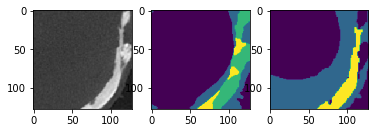

tensor(0.4800, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.82977   0.69089   0.75399      6907
           1    0.72721   0.83223   0.77618      7111
           2    0.00000   0.00000   0.00000         0
           3    0.91734   0.71767   0.80531      2366

    accuracy                        0.75610     16384
   macro avg    0.61858   0.56020   0.58387     16384
weighted avg    0.79790   0.75610   0.77103     16384

[0.7786937355995178, 0.7490967512130737, 0.4891093373298645, 0.7945610880851746]


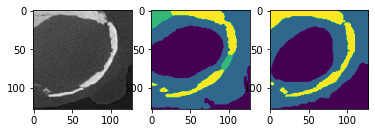

tensor(0.7308, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.01203   0.14444   0.02222       450
           1    0.85743   0.45699   0.59621     10370
           2    0.00000   0.00000   0.00000         0
           3    0.89264   0.41840   0.56975      5564

    accuracy                        0.43530     16384
   macro avg    0.44053   0.25496   0.29705     16384
weighted avg    0.84617   0.43530   0.57146     16384

[0.3697487711906433, 0.610943078994751, 0.45110875368118286, 0.619709312915802]


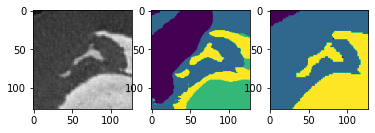

tensor(0.5237, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.94995   0.46008   0.61992      4208
           1    0.76239   0.93929   0.84165      8055
           2    0.00000   0.00000   0.00000         0
           3    0.90274   0.59913   0.72025      4121

    accuracy                        0.73065     16384
   macro avg    0.65377   0.49962   0.54545     16384
weighted avg    0.84587   0.73065   0.75416     16384

[0.7121638655662537, 0.7895089387893677, 0.47232162952423096, 0.7423647046089172]


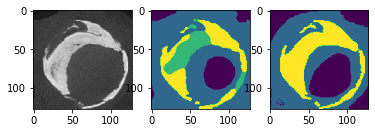

tensor(0.7512, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71837   0.79181   0.75330     11307
           1    0.34319   0.26010   0.29593      4775
           2    0.00000   0.00000   0.00000         0
           3    0.88489   0.40728   0.55782       302

    accuracy                        0.62976     16384
   macro avg    0.48661   0.36480   0.40176     16384
weighted avg    0.61209   0.62976   0.61640     16384

[0.45517563819885254, 0.46378040313720703, 0.4972466230392456, 0.540696382522583]


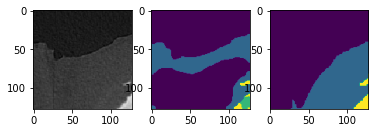

tensor(0.6986, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73900   0.98263   0.84358      9555
           1    0.90274   0.33927   0.49319      5335
           2    0.00000   0.00000   0.00000         0
           3    0.90688   0.29987   0.45070      1494

    accuracy                        0.71088     16384
   macro avg    0.63716   0.40544   0.44687     16384
weighted avg    0.80763   0.71088   0.69366     16384

[0.5624686479568481, 0.591054379940033, 0.4790961742401123, 0.5554370284080505]


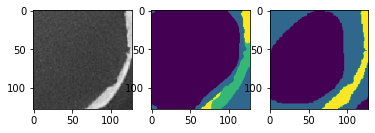

tensor(0.6099, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87988   0.87011   0.87497     11895
           1    0.60556   0.62043   0.61290      3828
           3    0.94134   0.99546   0.96765       661

    accuracy                        0.81683     16384
   macro avg    0.80893   0.82867   0.81851     16384
weighted avg    0.81826   0.81683   0.81748     16384

[0.6496681571006775, 0.6454305648803711, 0.4994887709617615, 0.6279924511909485]


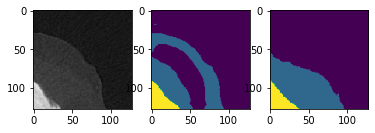

tensor(0.8479, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60850   0.59979   0.60411     11319
           1    0.01408   0.00434   0.00664      5065
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.41571     16384
   macro avg    0.15564   0.15103   0.15269     16384
weighted avg    0.42474   0.41571   0.41941     16384

[0.36746692657470703, 0.38265615701675415, 0.448657751083374, 0.49895352125167847]


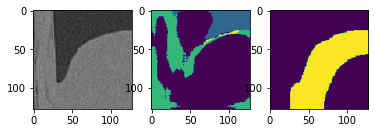

tensor(0.8752, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.56758   0.67350   0.61602     10481
           1    0.00000   0.00000   0.00000      5903
           2    0.00000   0.00000   0.00000         0

    accuracy                        0.43085     16384
   macro avg    0.18919   0.22450   0.20534     16384
weighted avg    0.36309   0.43085   0.39408     16384

[0.2868731617927551, 0.3589513301849365, 0.4249194264411926, 0.49955326318740845]


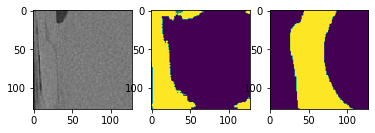

tensor(0.8397, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63776   0.67205   0.65445     11587
           1    0.00531   0.00334   0.00410      4797
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.47626     16384
   macro avg    0.16077   0.16885   0.16464     16384
weighted avg    0.45258   0.47626   0.46404     16384

[0.3578529357910156, 0.36180758476257324, 0.48460841178894043, 0.49967432022094727]


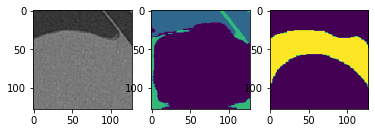

tensor(0.7492, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.97408   0.98485   0.97943     15375
           1    0.00000   0.00000   0.00000      1009
           2    0.00000   0.00000   0.00000         0

    accuracy                        0.92419     16384
   macro avg    0.32469   0.32828   0.32648     16384
weighted avg    0.91409   0.92419   0.91911     16384

[0.5890601277351379, 0.4867905378341675, 0.4897545576095581, 0.4997981786727905]


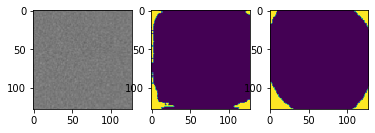

tensor(0.8375, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70067   0.63985   0.66888     12581
           1    0.00299   0.00184   0.00228      3803
           2    0.00000   0.00000   0.00000         0

    accuracy                        0.49176     16384
   macro avg    0.23455   0.21390   0.22372     16384
weighted avg    0.53873   0.49176   0.51415     16384

[0.34757816791534424, 0.39175188541412354, 0.45996129512786865, 0.4997161030769348]


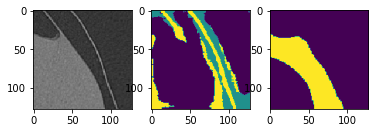

tensor(0.8771, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60617   0.59213   0.59907     11440
           1    0.00183   0.00081   0.00112      4944
           2    0.00000   0.00000   0.00000         0

    accuracy                        0.41370     16384
   macro avg    0.20267   0.19765   0.20006     16384
weighted avg    0.42381   0.41370   0.41864     16384

[0.2665214538574219, 0.33573806285858154, 0.4549657106399536, 0.4996976852416992]


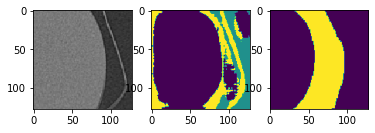

tensor(0.7984, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.27307   0.75941   0.40170      3479
           1    0.79151   0.28378   0.41777     11960
           2    0.32466   0.87919   0.47421       894
           3    0.00000   0.00000   0.00000        51

    accuracy                        0.41638     16384
   macro avg    0.34731   0.48060   0.32342     16384
weighted avg    0.65349   0.41638   0.41614     16384

[0.345309853553772, 0.3766176104545593, 0.5688316226005554, 0.49916183948516846]


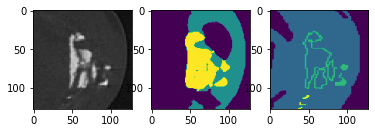

tensor(0.8179, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.18277   0.68953   0.28895      2551
           1    0.77307   0.24119   0.36767     12712
           2    0.32498   0.85019   0.47022      1068
           3    0.00000   0.00000   0.00000        53

    accuracy                        0.34991     16384
   macro avg    0.32021   0.44523   0.28171     16384
weighted avg    0.64945   0.34991   0.36091     16384

[0.323400616645813, 0.34291744232177734, 0.5654940605163574, 0.49916088581085205]


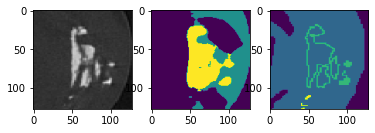

tensor(0.7739, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.23236   0.90225   0.36954      3069
           1    0.87763   0.22762   0.36149     11910
           2    0.00000   0.00000   0.00000         0
           3    0.99645   0.39929   0.57012      1405

    accuracy                        0.36871     16384
   macro avg    0.52661   0.38229   0.32529     16384
weighted avg    0.76695   0.36871   0.38089     16384

[0.3486933708190918, 0.4379769563674927, 0.4866717457771301, 0.5915637612342834]


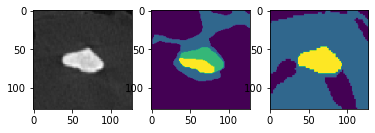

tensor(0.6592, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.94732   0.94995   0.94864     13687
           1    0.74238   0.73192   0.73712      2697

    accuracy                        0.91406     16384
   macro avg    0.84485   0.84094   0.84288     16384
weighted avg    0.91359   0.91406   0.91382     16384

[0.6799618601799011, 0.6660345196723938, 0.49979090690612793, 0.4996527433395386]


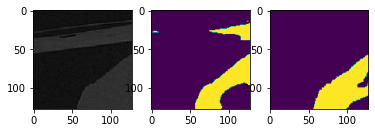

tensor(0.7082, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73498   0.92050   0.81734     10352
           1    0.75929   0.43037   0.54936      6032

    accuracy                        0.74005     16384
   macro avg    0.74713   0.67543   0.68335     16384
weighted avg    0.74393   0.74005   0.71868     16384

[0.5628776550292969, 0.5868903398513794, 0.49978411197662354, 0.49975764751434326]


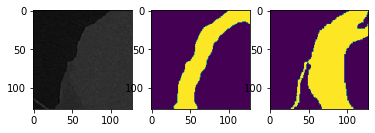

tensor(0.7443, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76974   0.79465   0.78200     12267
           1    0.32285   0.29172   0.30649      4117

    accuracy                        0.66827     16384
   macro avg    0.54630   0.54318   0.54425     16384
weighted avg    0.65745   0.66827   0.66251     16384

[0.5029525756835938, 0.5157616138458252, 0.49978387355804443, 0.4997504949569702]


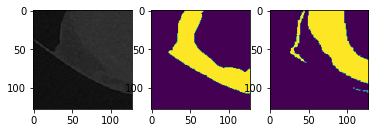

tensor(0.5911, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70402   0.78384   0.74179      9058
           1    0.65450   0.55710   0.60189      6760
           3    0.98349   0.94700   0.96490       566

    accuracy                        0.69592     16384
   macro avg    0.78067   0.76264   0.76952     16384
weighted avg    0.69324   0.69592   0.69177     16384

[0.669666051864624, 0.6632611751556396, 0.49977338314056396, 0.6500769257545471]


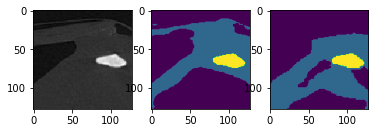

tensor(0.7827, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64672   0.99921   0.78522     10115
           1    0.98942   0.11932   0.21295      6269

    accuracy                        0.66254     16384
   macro avg    0.81807   0.55926   0.49909     16384
weighted avg    0.77785   0.66254   0.56626     16384

[0.4220808148384094, 0.4685560464859009, 0.49968767166137695, 0.4998737573623657]


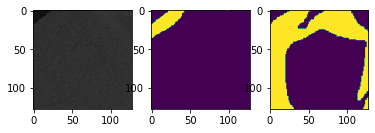

tensor(0.6805, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69908   0.89747   0.78595     10494
           1    0.61896   0.30333   0.40713      5832
           3    0.83333   0.77586   0.80357        58

    accuracy                        0.68555     16384
   macro avg    0.71713   0.65888   0.66555     16384
weighted avg    0.67104   0.68555   0.65117     16384

[0.5563777685165405, 0.6245172023773193, 0.49970245361328125, 0.5388633608818054]


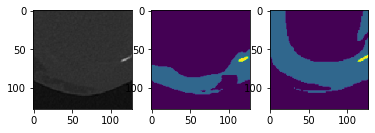

tensor(0.5873, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71572   0.79714   0.75424      8474
           1    0.70799   0.59632   0.64737      7221
           2    0.28226   0.83333   0.42169       126
           3    0.99390   0.86856   0.92701       563

    accuracy                        0.71136     16384
   macro avg    0.67497   0.77384   0.68758     16384
weighted avg    0.71854   0.71136   0.71052     16384

[0.6668523550033569, 0.6612540483474731, 0.5287947058677673, 0.6320637464523315]


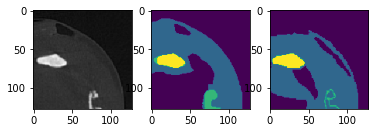

tensor(0.7742, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.57598   0.92763   0.71068      7061
           1    0.83995   0.33554   0.47952      8759
           2    0.30932   0.89484   0.45972       523
           3    0.00000   0.00000   0.00000        41

    accuracy                        0.60773     16384
   macro avg    0.43131   0.53950   0.41248     16384
weighted avg    0.70715   0.60773   0.57731     16384

[0.4184492826461792, 0.4469943046569824, 0.5407183766365051, 0.49926137924194336]


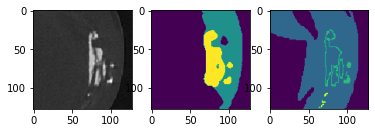

tensor(0.6275, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76788   0.97421   0.85883     10313
           1    0.88482   0.40035   0.55127      5680
           2    0.33014   0.92692   0.48687       260
           3    0.00000   0.00000   0.00000       131

    accuracy                        0.76672     16384
   macro avg    0.49571   0.57537   0.47424     16384
weighted avg    0.79534   0.76672   0.73944     16384

[0.6525682210922241, 0.6828620433807373, 0.5750420093536377, 0.4991655945777893]


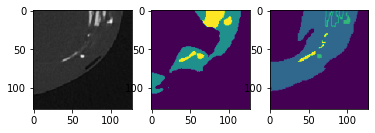

tensor(0.4878, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87488   0.97419   0.92187      8757
           1    0.94529   0.75667   0.84053      5663
           2    0.39095   0.92040   0.54880       892
           3    0.00000   0.00000   0.00000      1072

    accuracy                        0.83234     16384
   macro avg    0.55278   0.66282   0.57780     16384
weighted avg    0.81563   0.83234   0.81313     16384

[0.8889887928962708, 0.8741699457168579, 0.6179478168487549, 0.4818096160888672]


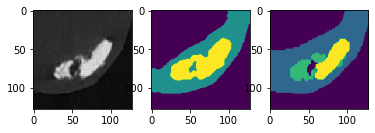

tensor(0.5347, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73657   0.86527   0.79575      9003
           1    0.72941   0.52059   0.60756      5851
           2    0.86275   0.92571   0.89312      1521
           3    0.00000   0.00000   0.00000         9

    accuracy                        0.74731     16384
   macro avg    0.58218   0.57789   0.57411     16384
weighted avg    0.74532   0.74731   0.73715     16384

[0.7051103115081787, 0.687775194644928, 0.7352074384689331, 0.49963754415512085]


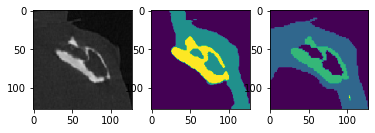

tensor(0.4527, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75209   0.86369   0.80404      7285
           1    0.86647   0.68279   0.76374      6472
           2    0.82728   0.92597   0.87385      2607
           3    0.00000   0.00000   0.00000        20

    accuracy                        0.80109     16384
   macro avg    0.61146   0.61811   0.61041     16384
weighted avg    0.80832   0.80109   0.79825     16384

[0.7889840602874756, 0.8007026314735413, 0.7980175614356995, 0.4994605779647827]


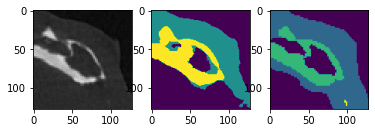

tensor(0.6539, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.84850   0.92132   0.88341     11222
           1    0.78476   0.63574   0.70243      5087
           2    0.91026   0.94667   0.92810        75

    accuracy                        0.83276     16384
   macro avg    0.84784   0.83457   0.83798     16384
weighted avg    0.82899   0.83276   0.82742     16384

[0.6540181040763855, 0.6615810990333557, 0.5267335772514343, 0.4997096061706543]


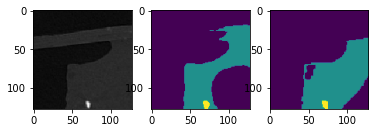

tensor(0.7533, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73752   0.97090   0.83827      9553
           1    0.92242   0.51066   0.65739      6752
           2    0.95714   0.84810   0.89933        79

    accuracy                        0.78064     16384
   macro avg    0.87236   0.77655   0.79833     16384
weighted avg    0.81477   0.78064   0.76402     16384

[0.45654934644699097, 0.49319708347320557, 0.5261566638946533, 0.49978673458099365]


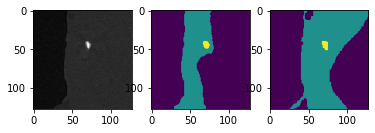

tensor(0.5851, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71075   0.81294   0.75842      9751
           1    0.58963   0.43077   0.49783      5727
           2    0.84145   0.97241   0.90220       906

    accuracy                        0.68817     16384
   macro avg    0.71394   0.73870   0.71948     16384
weighted avg    0.67564   0.68817   0.67528     16384

[0.6499708890914917, 0.6527637243270874, 0.6777524352073669, 0.49976956844329834]


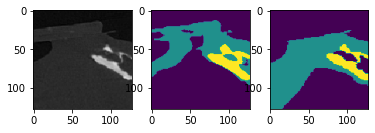

tensor(0.7222, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.82087   0.99705   0.90042     13232
           1    0.51515   0.01736   0.03360      2937
           2    0.94836   0.93953   0.94393       215

    accuracy                        0.82068     16384
   macro avg    0.76146   0.65132   0.62598     16384
weighted avg    0.76774   0.82068   0.74561     16384

[0.5006874203681946, 0.4786165952682495, 0.5867679119110107, 0.49983251094818115]


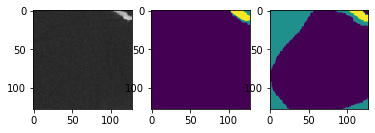

tensor(0.4845, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78519   0.81476   0.79970      4567
           1    0.87222   0.86038   0.86626      8616
           2    0.90191   0.72944   0.80656      3101
           3    0.00000   0.00000   0.00000       100

    accuracy                        0.81763     16384
   macro avg    0.63983   0.60114   0.61813     16384
weighted avg    0.84826   0.81763   0.83112     16384

[0.7702831029891968, 0.8266494274139404, 0.7460274696350098, 0.4892204999923706]


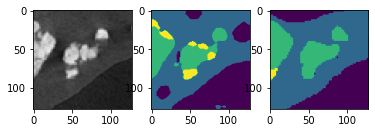

tensor(0.6429, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.35808   0.86986   0.50732      3427
           1    0.91437   0.53803   0.67744     11650
           2    0.94467   0.52257   0.67291      1307
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.60620     16384
   macro avg    0.55428   0.48261   0.46442     16384
weighted avg    0.80043   0.60620   0.64149     16384

[0.6060048937797546, 0.6159078478813171, 0.6103054881095886, 0.4927893877029419]


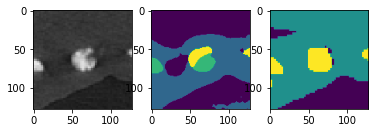

tensor(0.4556, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.82135   0.80553   0.81336      3944
           1    0.89222   0.88804   0.89012      8110
           2    0.31414   0.62082   0.41718      1643
           3    0.49708   0.22144   0.30639      2687

    accuracy                        0.73206     16384
   macro avg    0.63120   0.63395   0.60676     16384
weighted avg    0.75239   0.73206   0.72849     16384

[0.8756433725357056, 0.8801577091217041, 0.5599594116210938, 0.5591662526130676]


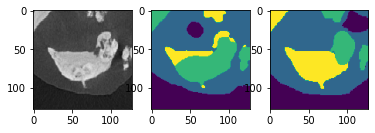

tensor(0.6311, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.00000   0.00000   0.00000      2135
           1    0.74177   0.70675   0.72383      9531
           2    0.93002   0.81666   0.86966      3938
           3    0.48175   0.77821   0.59510       780

    accuracy                        0.64447     16384
   macro avg    0.53838   0.57540   0.54715     16384
weighted avg    0.67798   0.64447   0.65843     16384

[0.4282491207122803, 0.6382114291191101, 0.6878902912139893, 0.6324020028114319]


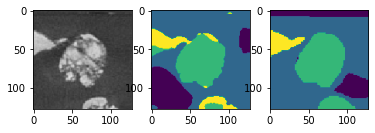

tensor(0.6049, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51874   0.73047   0.60666      5836
           1    0.71204   0.50445   0.59053      8431
           2    0.84061   0.44591   0.58272      2117
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.57739     16384
   macro avg    0.51785   0.42021   0.44498     16384
weighted avg    0.65980   0.57739   0.59527     16384

[0.6459305286407471, 0.6132318377494812, 0.6642940044403076, 0.48429155349731445]


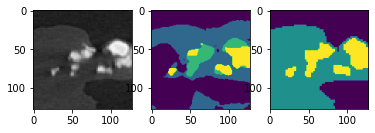

tensor(0.5930, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73417   0.69269   0.71283      3381
           1    0.87301   0.86867   0.87084      8848
           2    0.33433   0.64812   0.44111      1384
           3    0.65671   0.40455   0.50067      2771

    accuracy                        0.73523     16384
   macro avg    0.64955   0.65351   0.63136     16384
weighted avg    0.76227   0.73523   0.73932     16384

[0.5733807682991028, 0.8074271082878113, 0.5329998135566711, 0.6449053287506104]


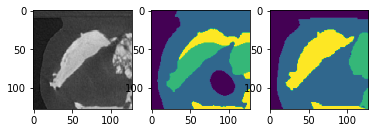

tensor(0.5038, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.95300   0.87972   0.91489     10833
           1    0.65760   0.75960   0.70493      3436
           2    0.84799   0.93901   0.89118      2115
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.86218     16384
   macro avg    0.61465   0.64458   0.62775     16384
weighted avg    0.87749   0.86218   0.86780     16384

[0.7510060667991638, 0.6626670360565186, 0.7829192280769348, 0.49867987632751465]


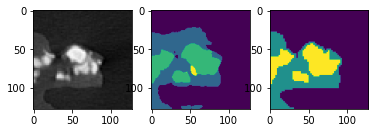

tensor(0.5704, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.97540   1.00000   0.98755     13797
           1    0.99939   0.81518   0.89794      2002
           2    0.00000   0.00000   0.00000         0
           3    0.94527   0.32479   0.48346       585

    accuracy                        0.95331     16384
   macro avg    0.73001   0.53499   0.59224     16384
weighted avg    0.97725   0.95331   0.95860     16384

[0.7925187945365906, 0.7576831579208374, 0.4934673309326172, 0.5620592832565308]


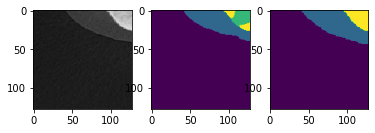

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49937278032302856, 0.48944807052612305, 0.49973809719085693, 0.49977821111679077]


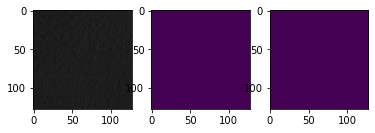

tensor(0.7500, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.4993624687194824, 0.489635705947876, 0.4997357130050659, 0.49978458881378174]


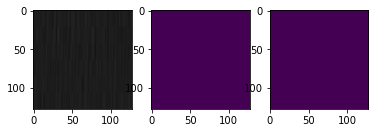

tensor(0.4785, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.96239   0.99972   0.98070     10904
           1    0.98809   0.83805   0.90690      2970
           2    0.06835   1.00000   0.12796       165
           3    0.89516   0.04733   0.08991      2345

    accuracy                        0.83411     16384
   macro avg    0.72850   0.72128   0.52637     16384
weighted avg    0.94842   0.83411   0.83124     16384

[0.9613233208656311, 0.895251989364624, 0.5181180238723755, 0.5115012526512146]


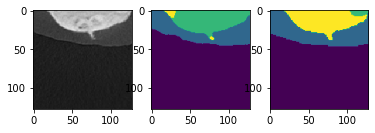

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.4993855357170105, 0.489723801612854, 0.49973994493484497, 0.49976831674575806]


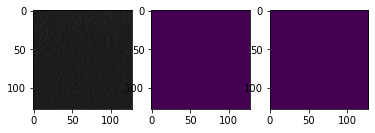

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.4993557929992676, 0.48932671546936035, 0.4997379779815674, 0.4997725486755371]


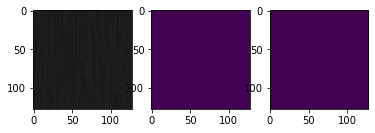

tensor(0.6230, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60060   0.89886   0.72006      5161
           1    0.89951   0.55223   0.68433      8348
           2    0.12532   0.96304   0.22178       460
           3    0.00000   0.00000   0.00000      2415

    accuracy                        0.59155     16384
   macro avg    0.40636   0.60353   0.40654     16384
weighted avg    0.65103   0.59155   0.58173     16384

[0.6943418979644775, 0.7334951758384705, 0.5334551334381104, 0.4557475447654724]


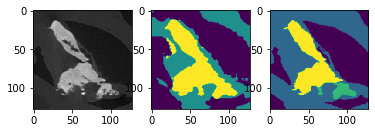

tensor(0.7643, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78957   0.76938   0.77935     12007
           1    0.40884   0.43751   0.42269      4377

    accuracy                        0.68073     16384
   macro avg    0.59921   0.60345   0.60102     16384
weighted avg    0.68786   0.68073   0.68407     16384

[0.4725607633590698, 0.4668537378311157, 0.4997859001159668, 0.49975407123565674]


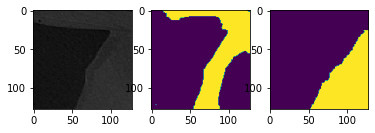

tensor(0.7563, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51558   0.92558   0.66226      6651
           1    0.88861   0.40573   0.55710      9733

    accuracy                        0.61676     16384
   macro avg    0.70210   0.66565   0.60968     16384
weighted avg    0.73718   0.61676   0.59979     16384

[0.4681503176689148, 0.5001853108406067, 0.4996669292449951, 0.4997882843017578]


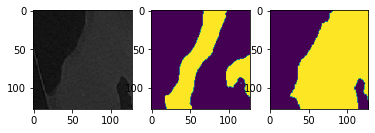

tensor(0.7928, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51357   0.76823   0.61561      7831
           1    0.61135   0.33380   0.43182      8553

    accuracy                        0.54144     16384
   macro avg    0.56246   0.55101   0.52371     16384
weighted avg    0.56462   0.54144   0.51966     16384

[0.40745246410369873, 0.4209468364715576, 0.4995373487472534, 0.49982380867004395]


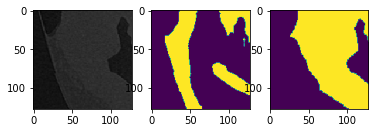

tensor(0.7562, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.85167   0.74920   0.79715     13381
           1    0.27249   0.41858   0.33009      3003

    accuracy                        0.68860     16384
   macro avg    0.56208   0.58389   0.56362     16384
weighted avg    0.74551   0.68860   0.71155     16384

[0.4784700870513916, 0.48688584566116333, 0.49964749813079834, 0.4997726082801819]


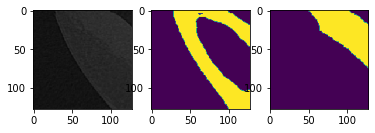

tensor(0.7715, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.85822   0.92370     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.85822     16384
   macro avg    0.50000   0.42911   0.46185     16384
weighted avg    1.00000   0.85822   0.92370     16384

[0.45911991596221924, 0.44999706745147705, 0.49974703788757324, 0.49965083599090576]


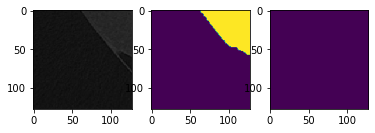

tensor(0.8702, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.24754   0.43864   0.31648      5900
           1    0.32991   0.17041   0.22474      9606
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000       878

    accuracy                        0.25787     16384
   macro avg    0.14436   0.15226   0.13530     16384
weighted avg    0.28257   0.25787   0.24573     16384

[0.317684531211853, 0.3035241365432739, 0.48350417613983154, 0.4872082471847534]


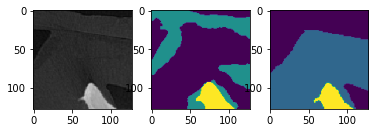

tensor(0.8114, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.25563   0.98351   0.40579      2123
           1    0.98061   0.40397   0.57222     10518
           2    0.00000   0.00000   0.00000        14
           3    1.00000   0.00027   0.00054      3729

    accuracy                        0.38684     16384
   macro avg    0.55906   0.34694   0.24464     16384
weighted avg    0.89025   0.38684   0.42005     16384

[0.4381101131439209, 0.5688902139663696, 0.42112863063812256, 0.4175684452056885]


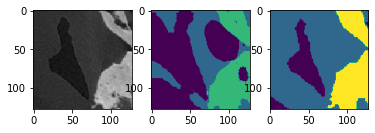

tensor(0.7269, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87306   0.83227   0.85218     13313
           1    0.39534   0.47542   0.43170      3071

    accuracy                        0.76538     16384
   macro avg    0.63420   0.65384   0.64194     16384
weighted avg    0.78352   0.76538   0.77336     16384

[0.5252587199211121, 0.5552022457122803, 0.49970167875289917, 0.4997471570968628]


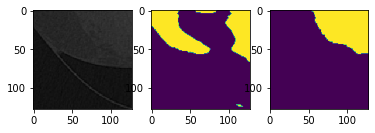

tensor(0.7891, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40901   0.69145   0.51398      6764
           1    0.52482   0.25324   0.34163      9102
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000       518

    accuracy                        0.42615     16384
   macro avg    0.23346   0.23617   0.21390     16384
weighted avg    0.46041   0.42615   0.40199     16384

[0.42466044425964355, 0.4579892158508301, 0.4903630018234253, 0.4929845333099365]


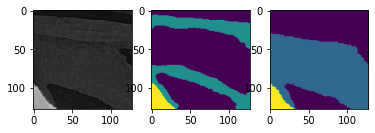

tensor(0.6222, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78950   0.99201   0.87924     10507
           1    0.97360   0.52714   0.68396      5877

    accuracy                        0.82526     16384
   macro avg    0.88155   0.75957   0.78160     16384
weighted avg    0.85554   0.82526   0.80920     16384

[0.7150299549102783, 0.7719135880470276, 0.49960923194885254, 0.49971598386764526]


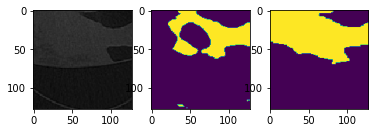

tensor(0.7624, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72148   0.73047   0.72595     11646
           1    0.31657   0.30688   0.31165      4738

    accuracy                        0.60797     16384
   macro avg    0.51903   0.51867   0.51880     16384
weighted avg    0.60439   0.60797   0.60614     16384

[0.4622099995613098, 0.47940677404403687, 0.49971485137939453, 0.49978339672088623]


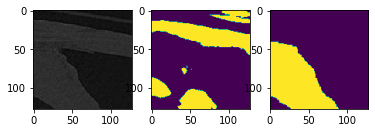

tensor(0.6112, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74627   0.99549   0.85305      9085
           1    0.99038   0.57830   0.73021      7299
           2    0.00000   0.00000   0.00000         0

    accuracy                        0.80963     16384
   macro avg    0.57888   0.52460   0.52775     16384
weighted avg    0.85502   0.80963   0.79833     16384

[0.7486007809638977, 0.7881293296813965, 0.4987027645111084, 0.4997779130935669]


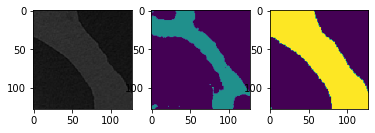

tensor(0.6319, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70549   0.97918   0.82010      7684
           1    0.96320   0.55917   0.70757      7724
           2    0.48745   0.99176   0.65364       607
           3    0.00000   0.00000   0.00000       369

    accuracy                        0.75958     16384
   macro avg    0.53903   0.63253   0.54533     16384
weighted avg    0.80302   0.75958   0.74241     16384

[0.6651467084884644, 0.6181226968765259, 0.5895776152610779, 0.49394500255584717]


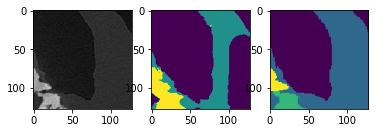

tensor(0.6010, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.48200   0.93187   0.63536      4095
           1    0.95602   0.59938   0.73681     10591
           2    0.68911   0.94733   0.79785      1329
           3    0.00000   0.00000   0.00000       369

    accuracy                        0.69720     16384
   macro avg    0.53178   0.61964   0.54251     16384
weighted avg    0.79436   0.69720   0.69981     16384

[0.6289573311805725, 0.676690936088562, 0.6348616480827332, 0.49401193857192993]


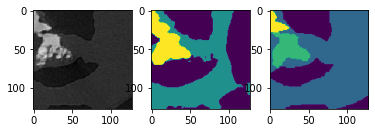

tensor(0.5393, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.93801   0.97347   0.95541     11269
           1    0.93623   0.85826   0.89555      5115

    accuracy                        0.93750     16384
   macro avg    0.93712   0.91586   0.92548     16384
weighted avg    0.93745   0.93750   0.93672     16384

[0.8845304250717163, 0.9131598472595215, 0.4998205304145813, 0.49969416856765747]


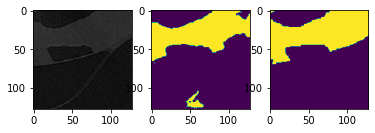

[0.5692688  0.5928612  0.52677044 0.52803932] 0.68084890664892


In [105]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 
import warnings
warnings.filterwarnings("ignore")


op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 4

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_6_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 5  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


Images and masks are created: 94
tensor(0.7036, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.56102   0.89372   0.68932      7320
           1    0.73864   0.31907   0.44564      7644
           2    0.43457   0.86134   0.57768       613
           3    0.60680   0.15489   0.24679       807

    accuracy                        0.58801     16384
   macro avg    0.58526   0.55726   0.48986     16384
weighted avg    0.64141   0.58801   0.54966     16384

[0.503636360168457, 0.4726998805999756, 0.563418984413147, 0.5413303971290588]


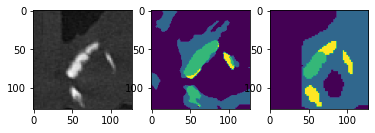

tensor(0.6812, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.42890   0.98822   0.59818      4499
           1    0.98100   0.31477   0.47661      8692
           2    0.12960   0.12509   0.12731      1351
           3    0.39013   0.40771   0.39873      1842

    accuracy                        0.49451     16384
   macro avg    0.48241   0.45895   0.40021     16384
weighted avg    0.69276   0.49451   0.47244     16384

[0.6003601551055908, 0.5365439653396606, 0.5618390440940857, 0.538739800453186]


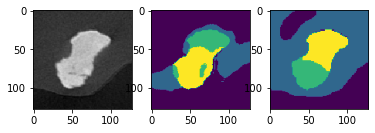

tensor(0.6550, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.98078   0.86474   0.91911     13278
           1    0.61599   0.92756   0.74033      3106

    accuracy                        0.87665     16384
   macro avg    0.79839   0.89615   0.82972     16384
weighted avg    0.91163   0.87665   0.88522     16384

[0.6785465478897095, 0.6808195114135742, 0.49960148334503174, 0.4998197555541992]


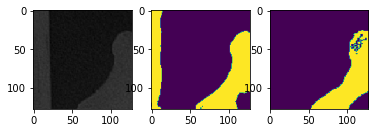

tensor(0.6805, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51579   0.69916   0.59364      7592
           1    0.55280   0.36344   0.43855      7850
           2    0.69022   0.61058   0.64796       624
           3    0.40789   0.48742   0.44413       318

    accuracy                        0.53082     16384
   macro avg    0.54168   0.54015   0.53107     16384
weighted avg    0.53807   0.53082   0.51850     16384

[0.532849133014679, 0.5116948485374451, 0.5823913216590881, 0.5586767196655273]


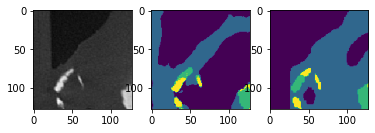

tensor(0.6382, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72296   0.83727   0.77593     10379
           1    0.49572   0.33533   0.40005      5007
           2    0.77628   0.75474   0.76536       685
           3    0.56592   0.56230   0.56410       313

    accuracy                        0.67517     16384
   macro avg    0.64022   0.62241   0.62636     16384
weighted avg    0.65274   0.67517   0.65657     16384

[0.6239713430404663, 0.5806540846824646, 0.586577296257019, 0.5590372085571289]


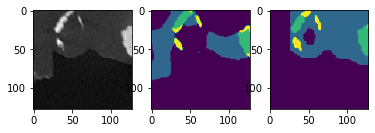

tensor(0.6932, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51585   0.96280   0.67177      6559
           1    0.94109   0.39674   0.55817      9825

    accuracy                        0.62335     16384
   macro avg    0.72847   0.67977   0.61497     16384
weighted avg    0.77085   0.62335   0.60365     16384

[0.597549557685852, 0.6084268093109131, 0.4996832013130188, 0.49977970123291016]


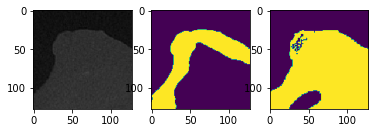

tensor(0.6805, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60704   1.00000   0.75547      7143
           1    0.93039   0.38320   0.54282      7534
           2    0.07149   0.20256   0.10569       390
           3    0.30073   0.09339   0.14253      1317

    accuracy                        0.62451     16384
   macro avg    0.47741   0.41979   0.38663     16384
weighted avg    0.71836   0.62451   0.59295     16384

[0.5976654291152954, 0.563866376876831, 0.5372855067253113, 0.5070891380310059]


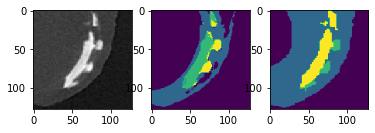

tensor(0.5833, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.62960   0.99927   0.77248      6872
           1    0.95951   0.48985   0.64859      7933
           2    0.08036   0.08036   0.08036       224
           3    0.86367   0.76679   0.81235      1355

    accuracy                        0.72083     16384
   macro avg    0.63328   0.58407   0.57845     16384
weighted avg    0.80119   0.72083   0.70633     16384

[0.6765112280845642, 0.675057590007782, 0.5138397216796875, 0.6599625945091248]


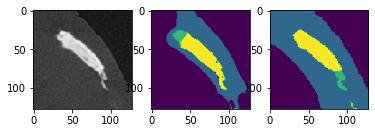

tensor(0.6850, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75217   0.99749   0.85763     10351
           1    0.98645   0.43771   0.60636      5988
           3    0.00000   0.00000   0.00000        45

    accuracy                        0.79016     16384
   macro avg    0.57954   0.47840   0.48800     16384
weighted avg    0.83573   0.79016   0.76344     16384

[0.632614016532898, 0.6240901350975037, 0.49939656257629395, 0.4991093873977661]


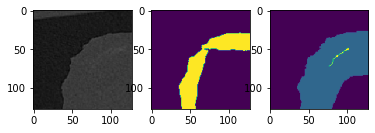

tensor(0.7673, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71768   0.99132   0.83259      9911
           1    0.96808   0.40290   0.56900      6473

    accuracy                        0.75885     16384
   macro avg    0.84288   0.69711   0.70079     16384
weighted avg    0.81661   0.75885   0.72845     16384

[0.46926045417785645, 0.46669459342956543, 0.4992915391921997, 0.4997902512550354]


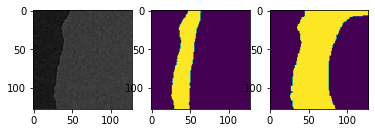

tensor(0.7086, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69088   0.99186   0.81445      8966
           1    0.97608   0.46281   0.62790      7407
           3    0.00000   0.00000   0.00000        11

    accuracy                        0.75201     16384
   macro avg    0.55565   0.48489   0.48078     16384
weighted avg    0.81935   0.75201   0.72957     16384

[0.5817723870277405, 0.5783854126930237, 0.498590886592865, 0.49949485063552856]


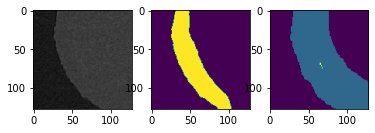

tensor(0.6527, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60996   0.99987   0.75770      7828
           1    0.99216   0.37925   0.54874      8008
           2    0.00000   0.00000   0.00000         0
           3    0.97222   0.51095   0.66986       548

    accuracy                        0.68018     16384
   macro avg    0.64359   0.47252   0.49407     16384
weighted avg    0.80888   0.68018   0.65263     16384

[0.667081892490387, 0.6533076763153076, 0.4941197633743286, 0.550769567489624]


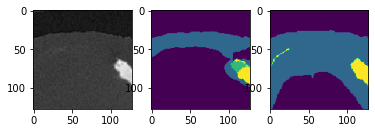

tensor(0.7355, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.86007   1.00000   0.92477     13725
           1    0.92571   0.06792   0.12656      2385
           2    0.00000   0.00000   0.00000         0
           3    0.99265   0.49270   0.65854       274

    accuracy                        0.85583     16384
   macro avg    0.69461   0.39016   0.42747     16384
weighted avg    0.87184   0.85583   0.80412     16384

[0.5227619409561157, 0.5000792741775513, 0.4971848726272583, 0.547613263130188]


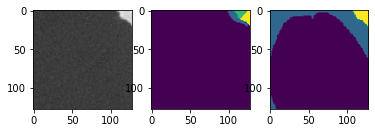

tensor(0.7800, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70637   1.00000   0.82792     11326
           1    1.00000   0.06920   0.12944      5058

    accuracy                        0.71265     16384
   macro avg    0.85319   0.53460   0.47868     16384
weighted avg    0.79702   0.71265   0.61229     16384

[0.4564458131790161, 0.44374096393585205, 0.4999762177467346, 0.49997103214263916]


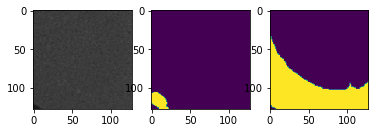

tensor(0.6166, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72793   0.99975   0.84246      8133
           1    0.94790   0.55015   0.69622      6780
           2    0.05070   0.08182   0.06261       220
           3    0.83658   0.61791   0.71080      1251

    accuracy                        0.77222     16384
   macro avg    0.64078   0.56241   0.57802     16384
weighted avg    0.81816   0.77222   0.76142     16384

[0.651782751083374, 0.6476256847381592, 0.5118584036827087, 0.6349784135818481]


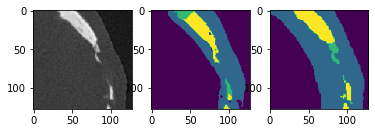

tensor(0.6596, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.62834   0.99673   0.77078      7024
           1    0.91609   0.41824   0.57429      6917
           2    0.95406   0.33265   0.49330      2435
           3    0.00000   0.00000   0.00000         8

    accuracy                        0.65332     16384
   macro avg    0.62462   0.43690   0.45959     16384
weighted avg    0.79792   0.65332   0.64621     16384

[0.5899977684020996, 0.5810568332672119, 0.6355655789375305, 0.4798567295074463]


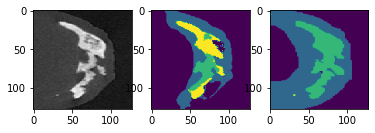

tensor(0.6929, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75302   0.99733   0.85813     10495
           1    0.98873   0.41933   0.58890      5857
           3    0.00000   0.00000   0.00000        32

    accuracy                        0.78876     16384
   macro avg    0.58058   0.47222   0.48234     16384
weighted avg    0.83581   0.78876   0.76021     16384

[0.608065128326416, 0.6059436798095703, 0.4994134306907654, 0.4992438554763794]


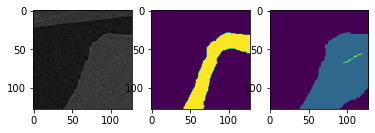

tensor(0.7494, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.66664   0.99623   0.79877      9274
           1    0.98614   0.35021   0.51687      7110

    accuracy                        0.71588     16384
   macro avg    0.82639   0.67322   0.65782     16384
weighted avg    0.80529   0.71588   0.67644     16384

[0.5052320957183838, 0.5047835111618042, 0.49922096729278564, 0.49968409538269043]


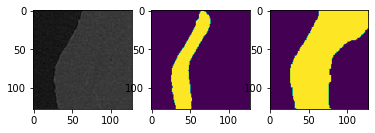

tensor(0.6618, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77044   0.98962   0.86638      9638
           1    0.97125   0.57676   0.72374      6677
           2    0.00000   0.00000   0.00000         0
           3    1.00000   0.43478   0.60606        69

    accuracy                        0.81903     16384
   macro avg    0.68542   0.50029   0.54904     16384
weighted avg    0.85324   0.81903   0.80715     16384

[0.6554036736488342, 0.6538057327270508, 0.49806827306747437, 0.5185079574584961]


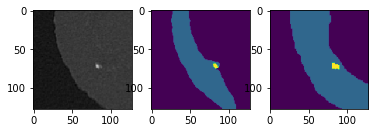

tensor(0.7811, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.42213   0.99887   0.59346      6195
           1    0.99246   0.16889   0.28865     10137
           3    0.00000   0.00000   0.00000        52

    accuracy                        0.48218     16384
   macro avg    0.47153   0.38925   0.29404     16384
weighted avg    0.77366   0.48218   0.40299     16384

[0.4536283612251282, 0.45423710346221924, 0.49977171421051025, 0.49913454055786133]


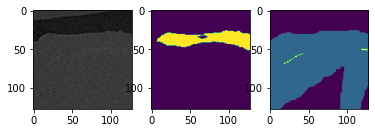

tensor(0.8175, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63446   1.00000   0.77635     10395
           1    0.00000   0.00000   0.00000      5989

    accuracy                        0.63446     16384
   macro avg    0.31723   0.50000   0.38818     16384
weighted avg    0.40254   0.63446   0.49257     16384

[0.37454795837402344, 0.37496811151504517, 0.49998754262924194, 0.49997174739837646]


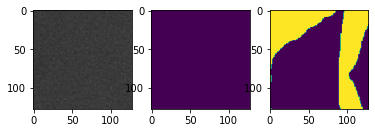

tensor(0.7879, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.57849   1.00000   0.73297      9113
           1    0.98642   0.08067   0.14915      7202
           2    0.00000   0.00000   0.00000         0
           3    0.96774   0.43478   0.60000        69

    accuracy                        0.59351     16384
   macro avg    0.63316   0.37886   0.37053     16384
weighted avg    0.75945   0.59351   0.47577     16384

[0.42441779375076294, 0.4107656478881836, 0.499564528465271, 0.5185408592224121]


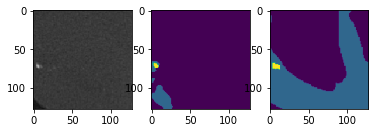

tensor(0.6155, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63879   0.99779   0.77892      7701
           1    0.95550   0.43526   0.59808      7646
           2    0.96591   0.08466   0.15568      1004
           3    0.00000   0.00000   0.00000        33

    accuracy                        0.67731     16384
   macro avg    0.64005   0.37943   0.38317     16384
weighted avg    0.80535   0.67731   0.65476     16384

[0.7075608968734741, 0.6982272267341614, 0.6014651656150818, 0.48844343423843384]


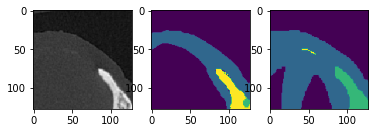

tensor(0.7562, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55248   0.99898   0.71148      6834
           1    0.89911   0.20163   0.32940      6983
           2    0.88394   0.29373   0.44094      2567
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.54865     16384
   macro avg    0.58388   0.37358   0.37045     16384
weighted avg    0.75215   0.54865   0.50624     16384

[0.42072510719299316, 0.4698601961135864, 0.5878427028656006, 0.4701230525970459]


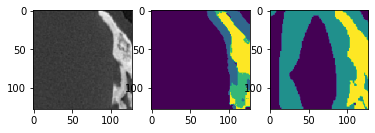

tensor(0.7758, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.38009   0.99820   0.55055      5003
           1    0.94299   0.14926   0.25772      9641
           2    0.90608   0.75794   0.82542      1731
           3    0.00369   0.11111   0.00714         9

    accuracy                        0.47278     16384
   macro avg    0.55821   0.50413   0.41021     16384
weighted avg    0.76669   0.47278   0.40698     16384

[0.37983471155166626, 0.37556594610214233, 0.5909892916679382, 0.49768269062042236]


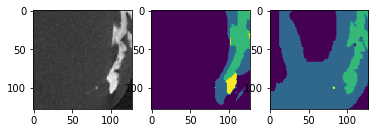

tensor(0.6529, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.71622   0.91737   0.80441      9500
           1    0.95350   0.35480   0.51716      5606
           2    0.00000   0.00000   0.00000         0
           3    0.34753   0.12128   0.17981      1278

    accuracy                        0.66278     16384
   macro avg    0.50431   0.34836   0.37535     16384
weighted avg    0.76865   0.66278   0.65740     16384

[0.6548076868057251, 0.6275168657302856, 0.4669548273086548, 0.5621936917304993]


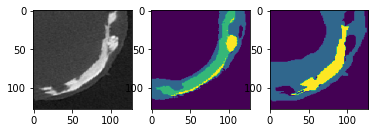

tensor(0.5506, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64209   0.94270   0.76389      7557
           1    0.94166   0.48133   0.63704      7311
           2    0.00000   0.00000   0.00000         0
           3    0.81871   0.56003   0.66510      1516

    accuracy                        0.70142     16384
   macro avg    0.60062   0.49601   0.51651     16384
weighted avg    0.79211   0.70142   0.69814     16384

[0.7064858675003052, 0.7053398489952087, 0.4845602512359619, 0.7217959761619568]


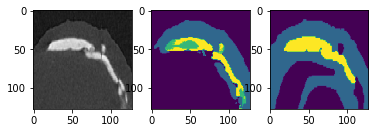

tensor(0.6490, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.83283   0.99506   0.90675     12151
           1    0.96163   0.41041   0.57530      4091
           3    1.00000   0.84507   0.91603       142

    accuracy                        0.84778     16384
   macro avg    0.93148   0.75018   0.79936     16384
weighted avg    0.86644   0.84778   0.82406     16384

[0.6558809280395508, 0.6364906430244446, 0.49853503704071045, 0.5491814017295837]


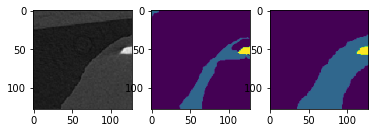

tensor(0.7745, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.56810   0.99735   0.72388      7929
           1    0.99148   0.28894   0.44748      8455

    accuracy                        0.63177     16384
   macro avg    0.77979   0.64315   0.58568     16384
weighted avg    0.78659   0.63177   0.58124     16384

[0.4578665494918823, 0.44849419593811035, 0.49930453300476074, 0.4997529983520508]


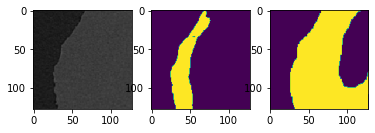

tensor(0.7560, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.49086   0.99776   0.65801      6246
           1    0.99620   0.36240   0.53146     10138

    accuracy                        0.60461     16384
   macro avg    0.74353   0.68008   0.59474     16384
weighted avg    0.80356   0.60461   0.57971     16384

[0.4882481098175049, 0.483792245388031, 0.4985189437866211, 0.4997025728225708]


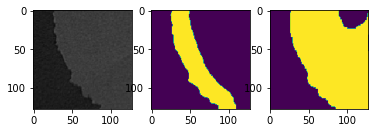

tensor(0.8037, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70886   1.00000   0.82963     11614
           1    0.00000   0.00000   0.00000      4770

    accuracy                        0.70886     16384
   macro avg    0.35443   0.50000   0.41482     16384
weighted avg    0.50249   0.70886   0.58809     16384

[0.406438946723938, 0.40330278873443604, 0.49998289346694946, 0.49996644258499146]


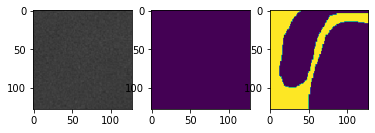

tensor(0.8469, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.44494   1.00000   0.61586      7051
           1    1.00000   0.05754   0.10881      9333

    accuracy                        0.46313     16384
   macro avg    0.72247   0.52877   0.36234     16384
weighted avg    0.76113   0.46313   0.32703     16384

[0.3228648900985718, 0.31300246715545654, 0.4999293088912964, 0.49996405839920044]


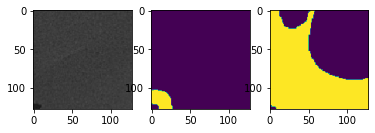

tensor(0.7514, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75358   0.85130   0.79946     10881
           1    0.91229   0.37657   0.53310      5165
           2    0.00000   0.00000   0.00000         0
           3    0.05459   0.07396   0.06281       338

    accuracy                        0.68561     16384
   macro avg    0.43011   0.32546   0.34884     16384
weighted avg    0.78919   0.68561   0.70030     16384

[0.46661442518234253, 0.5439552664756775, 0.47128021717071533, 0.5346093773841858]


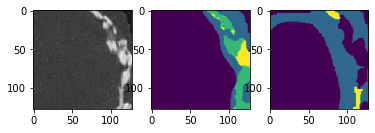

tensor(0.7695, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.61055   0.91725   0.73312      8640
           1    0.94303   0.16961   0.28751      6344
           2    0.00000   0.00000   0.00000         0
           3    0.94186   0.05786   0.10902      1400

    accuracy                        0.55432     16384
   macro avg    0.62386   0.28618   0.28241     16384
weighted avg    0.76760   0.55432   0.50725     16384

[0.4804708957672119, 0.45290762186050415, 0.46089625358581543, 0.5167406797409058]


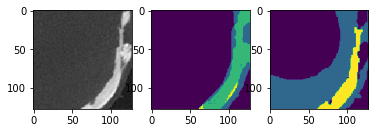

tensor(0.5875, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.59564   1.00000   0.74658      6907
           1    0.96461   0.32583   0.48712      7111
           2    0.00000   0.00000   0.00000         0
           3    0.93421   0.48014   0.63428      2366

    accuracy                        0.63232     16384
   macro avg    0.62361   0.45149   0.46700     16384
weighted avg    0.80467   0.63232   0.61775     16384

[0.6922230124473572, 0.6057409048080444, 0.4706794023513794, 0.7358287572860718]


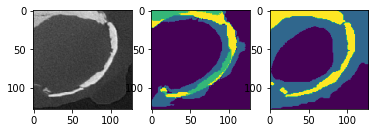

tensor(0.8052, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.04988   0.97556   0.09491       450
           1    0.84774   0.19865   0.32187     10370
           2    0.00000   0.00000   0.00000         0
           3    0.99454   0.55607   0.71331      5564

    accuracy                        0.34137     16384
   macro avg    0.47304   0.43257   0.28252     16384
weighted avg    0.87568   0.34137   0.44857     16384

[0.3058311939239502, 0.40349817276000977, 0.4268956184387207, 0.666893482208252]


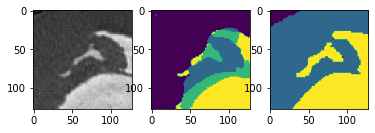

tensor(0.5802, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.50091   0.85266   0.63108      4208
           1    0.84839   0.51546   0.64129      8055
           2    0.00000   0.00000   0.00000         0
           3    0.95232   0.57195   0.71468      4121

    accuracy                        0.61627     16384
   macro avg    0.57540   0.48502   0.49676     16384
weighted avg    0.78528   0.61627   0.65712     16384

[0.6657467484474182, 0.6361820101737976, 0.44087904691696167, 0.7362291216850281]


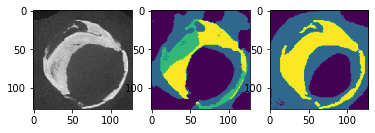

tensor(0.7842, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68777   0.88388   0.77359     11307
           1    0.16603   0.05487   0.08248      4775
           2    0.00000   0.00000   0.00000         0
           3    0.98795   0.27152   0.42597       302

    accuracy                        0.63098     16384
   macro avg    0.46044   0.30257   0.32051     16384
weighted avg    0.54125   0.63098   0.56576     16384

[0.42259615659713745, 0.4170091152191162, 0.4962940812110901, 0.5360321402549744]


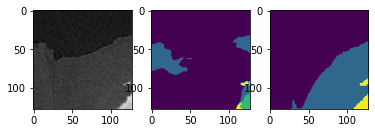

tensor(0.7658, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69375   1.00000   0.81919      9555
           1    0.95091   0.18519   0.31001      5335
           2    0.00000   0.00000   0.00000         0
           3    0.94828   0.11044   0.19784      1494

    accuracy                        0.65356     16384
   macro avg    0.64823   0.32391   0.33176     16384
weighted avg    0.80070   0.65356   0.59673     16384

[0.5240430235862732, 0.4502602219581604, 0.474865198135376, 0.5205062031745911]


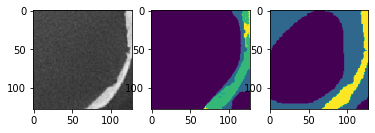

tensor(0.7220, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77110   0.82640   0.79779     11895
           1    0.29711   0.22858   0.25838      3828
           2    0.00000   0.00000   0.00000         0
           3    0.97422   0.80030   0.87874       661

    accuracy                        0.68567     16384
   macro avg    0.51061   0.46382   0.48373     16384
weighted avg    0.66855   0.68567   0.67503     16384

[0.5061413645744324, 0.4879668951034546, 0.4920421838760376, 0.6021933555603027]


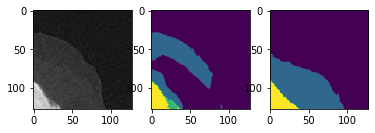

tensor(0.7354, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.97873   0.34155   0.50639     11319
           1    0.39997   0.91333   0.55631      5065
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.51831     16384
   macro avg    0.34467   0.31372   0.26567     16384
weighted avg    0.79981   0.51831   0.52182     16384

[0.533025324344635, 0.541695773601532, 0.4692167043685913, 0.49796873331069946]


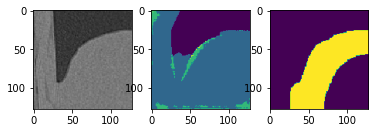

tensor(0.8999, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.00782   0.01553     10481
           1    0.36819   0.96866   0.53357      5903
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.35400     16384
   macro avg    0.34205   0.24412   0.13727     16384
weighted avg    0.77237   0.35400   0.20217     16384

[0.20508617162704468, 0.2367647886276245, 0.46780669689178467, 0.4985165596008301]


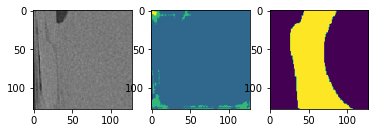

tensor(0.7538, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.98936   0.29680   0.45662     11587
           1    0.37218   0.94476   0.53399      4797
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.48651     16384
   macro avg    0.34038   0.31039   0.24765     16384
weighted avg    0.80865   0.48651   0.47927     16384

[0.4902770519256592, 0.5063724517822266, 0.47674810886383057, 0.49694061279296875]


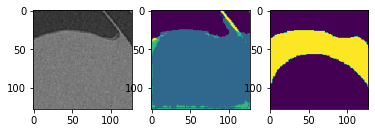

tensor(0.9801, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.59770   0.00338   0.00673     15375
           1    0.04310   0.66402   0.08094      1009
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.04407     16384
   macro avg    0.16020   0.16685   0.02192     16384
weighted avg    0.56355   0.04407   0.01130     16384

[0.05133622884750366, 0.07494306564331055, 0.47070950269699097, 0.49842286109924316]


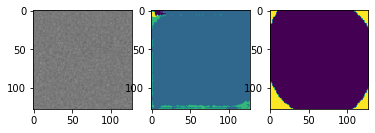

tensor(0.7476, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.98046   0.57833   0.72753     12581
           1    0.43125   0.86511   0.57558      3803
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.64490     16384
   macro avg    0.35293   0.36086   0.32578     16384
weighted avg    0.85298   0.64490   0.69226     16384

[0.5188111662864685, 0.5376506447792053, 0.4708535671234131, 0.4918729066848755]


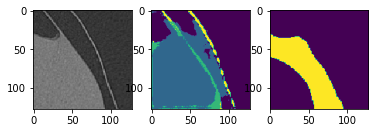

tensor(0.8593, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.96546   0.23942   0.38369     11440
           1    0.37166   0.93163   0.53135      4944
           2    0.00000   0.00000   0.00000         0
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.44830     16384
   macro avg    0.33428   0.29276   0.22876     16384
weighted avg    0.78627   0.44830   0.42825     16384

[0.2851564288139343, 0.3244941830635071, 0.46866917610168457, 0.4935603141784668]


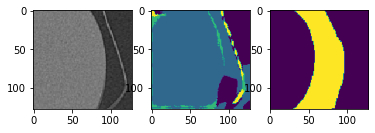

tensor(0.7760, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.29766   0.80512   0.43463      3479
           1    0.82403   0.34064   0.48202     11960
           2    0.30206   0.64094   0.41061       894
           3    0.09774   0.25490   0.14130        51

    accuracy                        0.45538     16384
   macro avg    0.38037   0.51040   0.36714     16384
weighted avg    0.68152   0.45538   0.46700     16384

[0.4006497859954834, 0.4033452272415161, 0.5660321712493896, 0.5063844323158264]


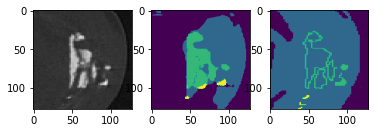

tensor(0.8053, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.20522   0.77068   0.32413      2551
           1    0.81687   0.28564   0.42327     12712
           2    0.30242   0.61985   0.40651      1068
           3    0.11765   0.37736   0.17937        53

    accuracy                        0.38324     16384
   macro avg    0.36054   0.51338   0.33332     16384
weighted avg    0.68584   0.38324   0.40595     16384

[0.3471826910972595, 0.35899317264556885, 0.5631356835365295, 0.5074350833892822]


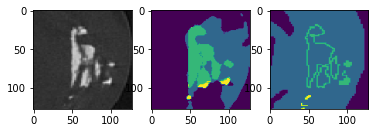

tensor(0.7812, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.25025   0.99088   0.39958      3069
           1    0.97535   0.24249   0.38841     11910
           2    0.00000   0.00000   0.00000         0
           3    1.00000   0.17722   0.30109      1405

    accuracy                        0.37708     16384
   macro avg    0.55640   0.35265   0.27227     16384
weighted avg    0.84164   0.37708   0.38301     16384

[0.4184226989746094, 0.4208831787109375, 0.48246216773986816, 0.57367342710495]


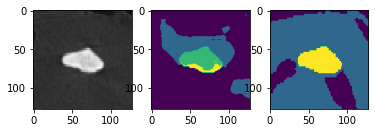

tensor(0.6458, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.94887   0.99123   0.96959     13687
           1    0.94247   0.72896   0.82208      2697

    accuracy                        0.94806     16384
   macro avg    0.94567   0.86010   0.89583     16384
weighted avg    0.94782   0.94806   0.94531     16384

[0.6904531121253967, 0.6985329389572144, 0.49940812587738037, 0.499619722366333]


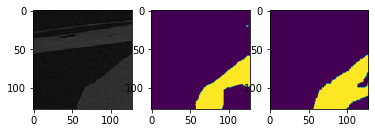

tensor(0.7100, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77517   0.92088   0.84177     10352
           1    0.79956   0.54161   0.64578      6032

    accuracy                        0.78125     16384
   macro avg    0.78736   0.73125   0.74377     16384
weighted avg    0.78415   0.78125   0.76961     16384

[0.5742324590682983, 0.5834763050079346, 0.4994601011276245, 0.4997190237045288]


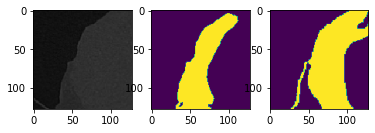

tensor(0.6441, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.89394   0.91587   0.90477     12267
           1    0.72956   0.67622   0.70188      4117

    accuracy                        0.85565     16384
   macro avg    0.81175   0.79605   0.80332     16384
weighted avg    0.85263   0.85565   0.85379     16384

[0.6873593330383301, 0.7036325931549072, 0.49895334243774414, 0.4994284510612488]


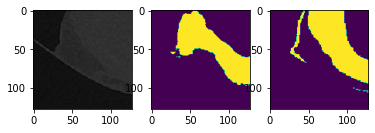

tensor(0.5869, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69982   0.97571   0.81505      9058
           1    0.92180   0.44290   0.59832      6760
           2    0.00000   0.00000   0.00000         0
           3    0.99402   0.88163   0.93446       566

    accuracy                        0.75262     16384
   macro avg    0.65391   0.57506   0.58696     16384
weighted avg    0.80157   0.75262   0.72975     16384

[0.6944554448127747, 0.7020975351333618, 0.4950098991394043, 0.628967821598053]


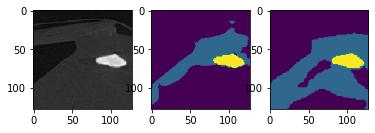

tensor(0.7978, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64055   1.00000   0.78090     10115
           1    1.00000   0.09459   0.17284      6269

    accuracy                        0.65356     16384
   macro avg    0.82028   0.54730   0.47687     16384
weighted avg    0.77809   0.65356   0.54824     16384

[0.40831345319747925, 0.41168367862701416, 0.4999854564666748, 0.4999798536300659]


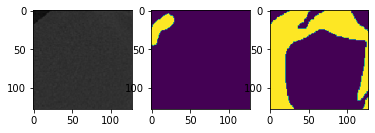

tensor(0.6047, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77341   0.98552   0.86667     10494
           1    0.94746   0.48234   0.63925      5832
           2    0.00000   0.00000   0.00000         0
           3    0.92500   0.63793   0.75510        58

    accuracy                        0.80518     16384
   macro avg    0.66147   0.52645   0.56525     16384
weighted avg    0.83590   0.80518   0.78532     16384

[0.7432777285575867, 0.7529208064079285, 0.4989887475967407, 0.5312385559082031]


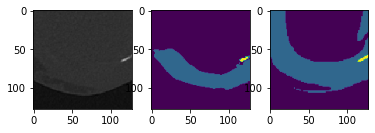

tensor(0.5725, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73332   0.91315   0.81341      8474
           1    0.83780   0.59369   0.69493      7221
           2    0.35294   0.57143   0.43636       126
           3    0.94716   0.85968   0.90130       563

    accuracy                        0.76788     16384
   macro avg    0.71780   0.73449   0.71150     16384
weighted avg    0.78379   0.76788   0.76131     16384

[0.712020993232727, 0.699885368347168, 0.5235840082168579, 0.6257628202438354]


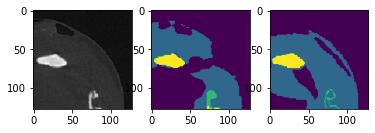

tensor(0.7573, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63024   0.94675   0.75674      7061
           1    0.88240   0.45747   0.60256      8759
           2    0.26877   0.60229   0.37168       523
           3    0.00000   0.00000   0.00000        41

    accuracy                        0.67181     16384
   macro avg    0.44536   0.50163   0.43274     16384
weighted avg    0.75194   0.67181   0.66013     16384

[0.4543887972831726, 0.47091495990753174, 0.5357272028923035, 0.5013061761856079]


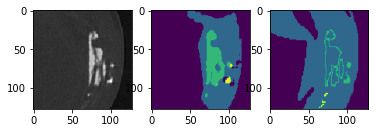

tensor(0.5861, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.81355   0.97101   0.88533     10313
           1    0.89621   0.55792   0.68772      5680
           2    0.31915   0.51923   0.39531       260
           3    0.32759   0.29008   0.30769       131

    accuracy                        0.81519     16384
   macro avg    0.58912   0.58456   0.56901     16384
weighted avg    0.83048   0.81519   0.80443     16384

[0.7272507548332214, 0.726166844367981, 0.5619307160377502, 0.539442777633667]


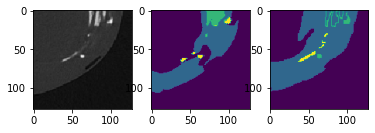

tensor(0.6550, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.65090   0.98367   0.78341      8757
           1    0.84348   0.19318   0.31437      5663
           2    0.34796   0.62220   0.44632       892
           3    0.47287   0.11381   0.18346      1072

    accuracy                        0.63385     16384
   macro avg    0.57880   0.47821   0.43189     16384
weighted avg    0.68932   0.63385   0.56368     16384

[0.6450799703598022, 0.5472650527954102, 0.5955004096031189, 0.5264261960983276]


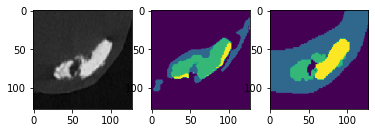

tensor(0.5653, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70375   0.96812   0.81504      9003
           1    0.90946   0.38284   0.53885      5851
           2    0.88167   0.65155   0.74934      1521
           3    0.00000   0.00000   0.00000         9

    accuracy                        0.72919     16384
   macro avg    0.62372   0.50063   0.52581     16384
weighted avg    0.79335   0.72919   0.70986     16384

[0.6725399494171143, 0.6653066277503967, 0.7127048373222351, 0.4914971590042114]


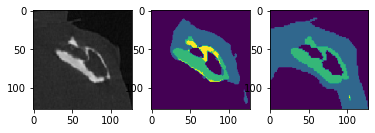

tensor(0.4885, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70374   0.94852   0.80800      7285
           1    0.91702   0.59935   0.72491      6472
           2    0.91618   0.60376   0.72786      2607
           3    0.00000   0.00000   0.00000        20

    accuracy                        0.75458     16384
   macro avg    0.63424   0.53791   0.56519     16384
weighted avg    0.82093   0.75458   0.76144     16384

[0.7723135948181152, 0.7584172487258911, 0.7585644721984863, 0.487484872341156]


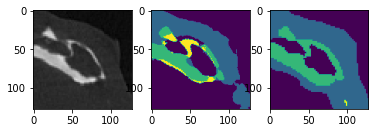

tensor(0.6631, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.81283   0.99225   0.89362     11222
           1    0.96144   0.49499   0.65352      5087
           2    0.93023   0.53333   0.67797        75
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.83575     16384
   macro avg    0.67613   0.50514   0.55628     16384
weighted avg    0.85951   0.83575   0.81809     16384

[0.6479759216308594, 0.6561791300773621, 0.5200620889663696, 0.4991954565048218]


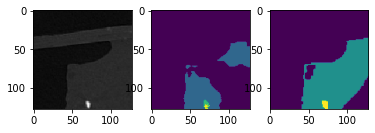

tensor(0.7460, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73932   0.98922   0.84621      9553
           1    0.96731   0.50829   0.66641      6752
           2    1.00000   0.12658   0.22472        79
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.78687     16384
   macro avg    0.67666   0.40602   0.43433     16384
weighted avg    0.83453   0.78687   0.76911     16384

[0.4979076385498047, 0.507697343826294, 0.5155165195465088, 0.4991028308868408]


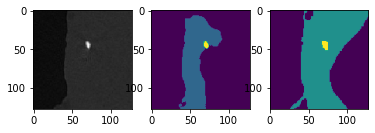

tensor(0.6343, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69872   0.97682   0.81469      9751
           1    0.90541   0.29247   0.44213      5727
           2    0.83815   0.32009   0.46326       906
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.70129     16384
   macro avg    0.61057   0.39735   0.43002     16384
weighted avg    0.77868   0.70129   0.66503     16384

[0.644383430480957, 0.6353254914283752, 0.6373807787895203, 0.49043720960617065]


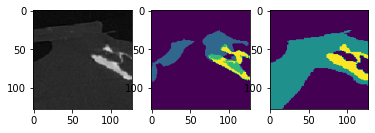

tensor(0.7620, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.81582   0.99856   0.89799     13232
           1    0.00000   0.00000   0.00000      2937
           2    0.83333   0.11628   0.20408       215
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.80798     16384
   macro avg    0.41229   0.27871   0.27552     16384
weighted avg    0.66980   0.80798   0.72791     16384

[0.48592889308929443, 0.45430535078048706, 0.5584625005722046, 0.497893750667572]


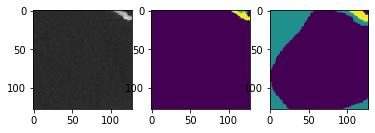

tensor(0.6099, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.42604   0.93716   0.58578      4567
           1    0.84418   0.33577   0.48045      8616
           2    0.95754   0.71267   0.81716      3101
           3    0.12438   0.75000   0.21337       100

    accuracy                        0.57727     16384
   macro avg    0.58803   0.68390   0.52419     16384
weighted avg    0.74469   0.57727   0.57191     16384

[0.5805045366287231, 0.5331940650939941, 0.758873462677002, 0.49989432096481323]


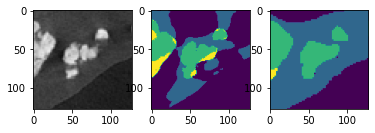

tensor(0.7517, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.26681   0.98278   0.41969      3427
           1    0.94862   0.21871   0.35547     11650
           2    0.96292   0.57613   0.72092      1307
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.40704     16384
   macro avg    0.54459   0.44441   0.37402     16384
weighted avg    0.80715   0.40704   0.39805     16384

[0.40968501567840576, 0.3865360617637634, 0.6309919953346252, 0.49414288997650146]


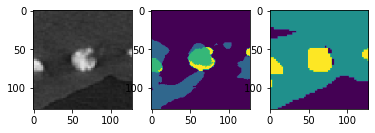

tensor(0.5012, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.45543   0.90035   0.60489      3944
           1    0.88105   0.46486   0.60860      8110
           2    0.71049   0.86184   0.77888      1643
           3    0.92138   0.79382   0.85286      2687

    accuracy                        0.66345     16384
   macro avg    0.74209   0.75522   0.71131     16384
weighted avg    0.76810   0.66345   0.66484     16384

[0.6770026683807373, 0.6276423335075378, 0.6093156933784485, 0.7512965202331543]


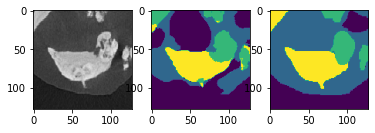

tensor(0.6710, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.19885   0.77518   0.31650      2135
           1    0.78175   0.29126   0.42440      9531
           2    0.81287   0.80853   0.81069      3938
           3    0.26476   0.20128   0.22870       780

    accuracy                        0.47437     16384
   macro avg    0.51456   0.51906   0.44507     16384
weighted avg    0.68866   0.47437   0.49387     16384

[0.4859158992767334, 0.4531211256980896, 0.7019500136375427, 0.533267617225647]


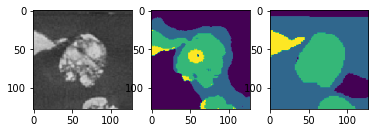

tensor(0.5679, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.52726   0.99931   0.69030      5836
           1    0.94411   0.37469   0.53647      8431
           2    0.90760   0.73311   0.81108      2117
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.64349     16384
   macro avg    0.59474   0.52678   0.50946     16384
weighted avg    0.79091   0.64349   0.62675     16384

[0.6634086966514587, 0.5904301404953003, 0.7564770579338074, 0.49200892448425293]


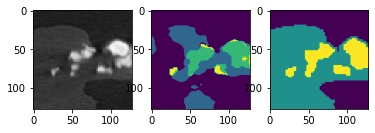

tensor(0.6375, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.47419   0.91571   0.62482      3381
           1    0.91935   0.58623   0.71594      8848
           2    0.22734   0.54913   0.32156      1384
           3    0.34253   0.10754   0.16369      2771

    accuracy                        0.57013     16384
   macro avg    0.49085   0.53965   0.45650     16384
weighted avg    0.67148   0.57013   0.57042     16384

[0.6509566903114319, 0.6002731323242188, 0.5115559101104736, 0.5241143703460693]


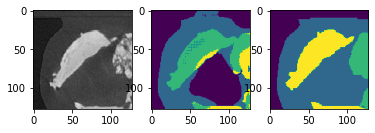

tensor(0.5559, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.86067   0.99963   0.92496     10833
           1    0.93414   0.53667   0.68170      3436
           2    0.88847   0.56123   0.68792      2115
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.84595     16384
   macro avg    0.67082   0.52438   0.57364     16384
weighted avg    0.87967   0.84595   0.84335     16384

[0.7217651009559631, 0.6523650288581848, 0.7123328447341919, 0.48878014087677]


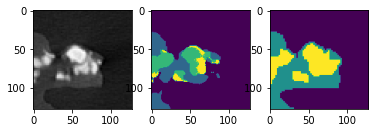

tensor(0.5803, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.96591   1.00000   0.98266     13797
           1    0.99866   0.74725   0.85486      2002
           2    0.00000   0.00000   0.00000         0
           3    0.98346   0.91453   0.94774       585

    accuracy                        0.96606     16384
   macro avg    0.73701   0.66545   0.69631     16384
weighted avg    0.97054   0.96606   0.96579     16384

[0.7598474025726318, 0.7415984272956848, 0.4928703308105469, 0.6025149822235107]


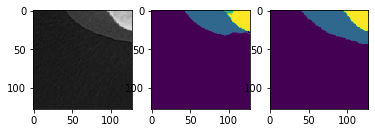

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49292653799057007, 0.4994856119155884, 0.49942970275878906, 0.4996147155761719]


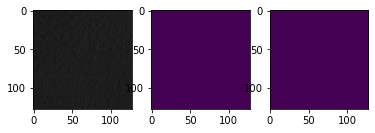

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49274003505706787, 0.49947893619537354, 0.49941080808639526, 0.4996076822280884]


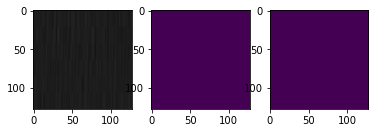

tensor(0.5052, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.88471   1.00000   0.93883     10904
           1    0.97837   0.51785   0.67723      2970
           2    0.13951   0.97576   0.24412       165
           3    0.98350   0.55906   0.71289      2345

    accuracy                        0.84924     16384
   macro avg    0.74652   0.76317   0.64327     16384
weighted avg    0.90832   0.84924   0.85207     16384

[0.8655840754508972, 0.7166244983673096, 0.5239070057868958, 0.7342833280563354]


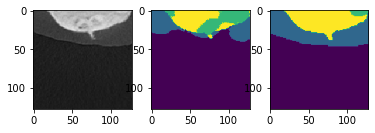

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49282777309417725, 0.4994623064994812, 0.49943602085113525, 0.49962031841278076]


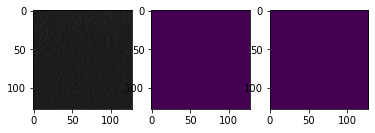

tensor(0.7501, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   1.00000   1.00000     16384

    accuracy                        1.00000     16384
   macro avg    1.00000   1.00000   1.00000     16384
weighted avg    1.00000   1.00000   1.00000     16384

[0.49293893575668335, 0.4994921088218689, 0.49942827224731445, 0.49962103366851807]


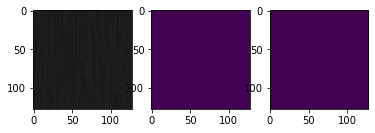

tensor(0.6275, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64199   0.96939   0.77243      5161
           1    0.97206   0.63776   0.77020      8348
           2    0.02543   0.14783   0.04340       460
           3    0.13636   0.02484   0.04203      2415

    accuracy                        0.63812     16384
   macro avg    0.44396   0.44495   0.40701     16384
weighted avg    0.71833   0.63812   0.64316     16384

[0.7131084203720093, 0.7320353388786316, 0.5253161191940308, 0.5044019818305969]


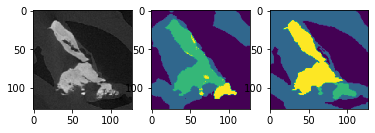

tensor(0.7196, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.82698   0.93945   0.87964     12007
           1    0.73506   0.46082   0.56649      4377

    accuracy                        0.81158     16384
   macro avg    0.78102   0.70013   0.72306     16384
weighted avg    0.80242   0.81158   0.79598     16384

[0.5582156777381897, 0.5663726329803467, 0.4994589686393738, 0.49967753887176514]


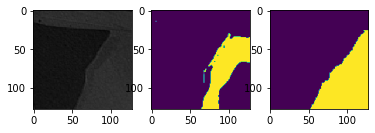

tensor(0.7598, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51808   0.98857   0.67987      6651
           1    0.97942   0.37162   0.53881      9733

    accuracy                        0.62207     16384
   macro avg    0.74875   0.68010   0.60934     16384
weighted avg    0.79214   0.62207   0.59607     16384

[0.4737752079963684, 0.48121118545532227, 0.49946844577789307, 0.49974989891052246]


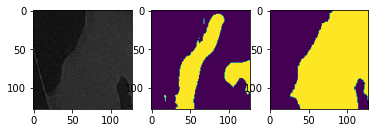

tensor(0.6997, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68254   0.90052   0.77652      7831
           1    0.87128   0.61651   0.72208      8553

    accuracy                        0.75226     16384
   macro avg    0.77691   0.75852   0.74930     16384
weighted avg    0.78107   0.75226   0.74810     16384

[0.5909240245819092, 0.5945323705673218, 0.49885094165802, 0.4995570182800293]


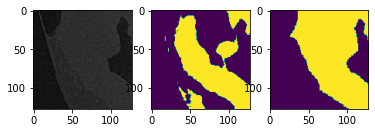

tensor(0.7202, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.95390   0.72678   0.82499     13381
           1    0.40927   0.84349   0.55113      3003

    accuracy                        0.74817     16384
   macro avg    0.68159   0.78513   0.68806     16384
weighted avg    0.85408   0.74817   0.77480     16384

[0.5472764372825623, 0.5569323897361755, 0.49886059761047363, 0.4995015263557434]


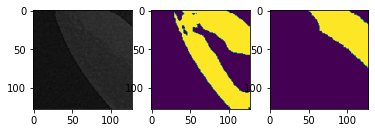

tensor(0.7649, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.89630   0.94532     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.89630     16384
   macro avg    0.50000   0.44815   0.47266     16384
weighted avg    1.00000   0.89630   0.94532     16384

[0.4602697491645813, 0.47004997730255127, 0.4990568161010742, 0.4994523525238037]


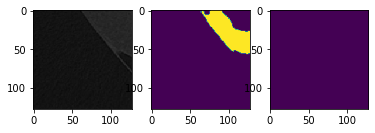

tensor(0.7813, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.36473   0.73898   0.48841      5900
           1    0.55776   0.20508   0.29989      9606
           2    0.00000   0.00000   0.00000         0
           3    0.96791   0.20615   0.33991       878

    accuracy                        0.39740     16384
   macro avg    0.47260   0.28755   0.28205     16384
weighted avg    0.51023   0.39740   0.36992     16384

[0.40873175859451294, 0.3849806785583496, 0.487044095993042, 0.5800874829292297]


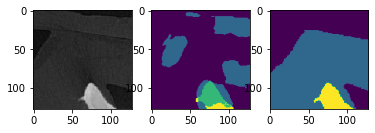

tensor(0.6875, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.35535   0.98069   0.52167      2123
           1    0.98684   0.63463   0.77248     10518
           2    0.00000   0.00000   0.00000        14
           3    0.98544   0.59909   0.74516      3729

    accuracy                        0.67084     16384
   macro avg    0.58191   0.55360   0.50983     16384
weighted avg    0.90385   0.67084   0.73310     16384

[0.5817912220954895, 0.6336874961853027, 0.4453544616699219, 0.58665931224823]


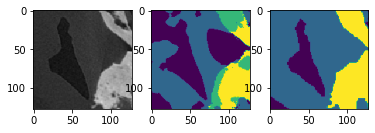

tensor(0.7052, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87919   0.89544   0.88724     13313
           1    0.50726   0.46662   0.48609      3071

    accuracy                        0.81506     16384
   macro avg    0.69323   0.68103   0.68667     16384
weighted avg    0.80948   0.81506   0.81205     16384

[0.5723937153816223, 0.5848788619041443, 0.49912261962890625, 0.49949491024017334]


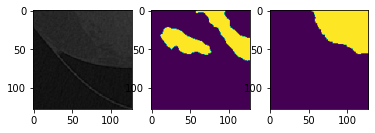

tensor(0.7272, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.46288   0.69234   0.55482      6764
           1    0.63622   0.40178   0.49253      9102
           2    0.00000   0.00000   0.00000         0
           3    0.95082   0.11197   0.20035       518

    accuracy                        0.51257     16384
   macro avg    0.51248   0.30152   0.31192     16384
weighted avg    0.57461   0.51257   0.50901     16384

[0.5212115049362183, 0.5171331167221069, 0.4923957586288452, 0.5510387420654297]


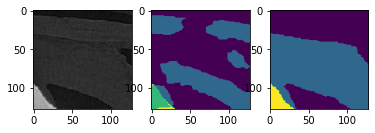

tensor(0.6371, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.79828   0.98230   0.88078     10507
           1    0.94616   0.55624   0.70060      5877

    accuracy                        0.82947     16384
   macro avg    0.87222   0.76927   0.79069     16384
weighted avg    0.85133   0.82947   0.81615     16384

[0.7151500582695007, 0.7337080836296082, 0.49916642904281616, 0.49959784746170044]


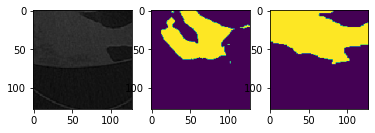

tensor(0.7034, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87365   0.74214   0.80254     11646
           1    0.53736   0.73618   0.62125      4738

    accuracy                        0.74042     16384
   macro avg    0.70550   0.73916   0.71190     16384
weighted avg    0.77640   0.74042   0.75012     16384

[0.5808095335960388, 0.5853778123855591, 0.49922555685043335, 0.4996645450592041]


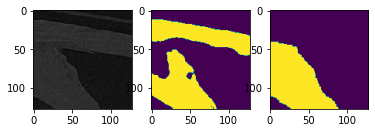

tensor(0.5559, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.86350   0.99780   0.92580      9085
           1    0.99660   0.80367   0.88980      7299

    accuracy                        0.91132     16384
   macro avg    0.93005   0.90074   0.90780     16384
weighted avg    0.92280   0.91132   0.90976     16384

[0.8658199906349182, 0.883349597454071, 0.49875569343566895, 0.49964195489883423]


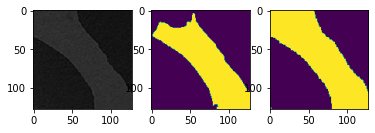

tensor(0.6008, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78512   0.99427   0.87740      7684
           1    0.98886   0.71284   0.82847      7724
           2    0.44977   0.64909   0.53136       607
           3    0.05742   0.03252   0.04152       369

    accuracy                        0.82715     16384
   macro avg    0.57029   0.59718   0.56969     16384
weighted avg    0.85236   0.82715   0.82269     16384

[0.7283264994621277, 0.6778119802474976, 0.5870051980018616, 0.4951401352882385]


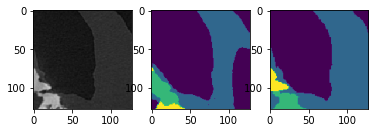

tensor(0.6377, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.47307   0.94579   0.63068      4095
           1    0.96288   0.58776   0.72995     10591
           2    0.59387   0.56885   0.58109      1329
           3    0.00436   0.00542   0.00483       369

    accuracy                        0.66260     16384
   macro avg    0.50854   0.52695   0.48664     16384
weighted avg    0.78893   0.66260   0.67673     16384

[0.6282082796096802, 0.6130430698394775, 0.5984291434288025, 0.49050605297088623]


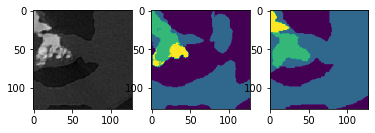

tensor(0.6136, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.83369   0.99024   0.90525     11269
           1    0.96332   0.56481   0.71210      5115

    accuracy                        0.85742     16384
   macro avg    0.89851   0.77752   0.80868     16384
weighted avg    0.87416   0.85742   0.84495     16384

[0.7419484257698059, 0.7765446901321411, 0.499098539352417, 0.4994978904724121]


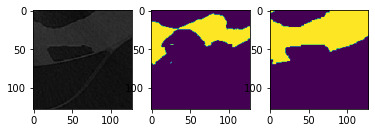

[0.55798271 0.55062407 0.52774493 0.53142186] 0.6961532260509248


In [106]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 
import warnings
warnings.filterwarnings("ignore")


op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 4

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_5_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 5  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


Images and masks are created: 94
tensor(0.7811, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.48692   0.99385   0.65361      7320
           1    0.86095   0.03807   0.07291      7644
           2    0.00000   0.00000   0.00000       613
           3    0.48869   0.66914   0.56485       807

    accuracy                        0.49475     16384
   macro avg    0.45914   0.42527   0.32284     16384
weighted avg    0.64329   0.49475   0.35386     16384

[0.37073612213134766, 0.4342299699783325, 0.48994243144989014, 0.5376607179641724]


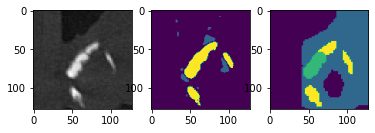

tensor(0.7174, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.34336   0.99667   0.51076      4499
           1    0.96011   0.03877   0.07453      8692
           2    0.58026   0.46558   0.51663      1351
           3    0.64127   0.65798   0.64952      1842

    accuracy                        0.40662     16384
   macro avg    0.63125   0.53975   0.43786     16384
weighted avg    0.72359   0.40662   0.29542     16384

[0.42639976739883423, 0.5637620091438293, 0.5116968750953674, 0.5072477459907532]


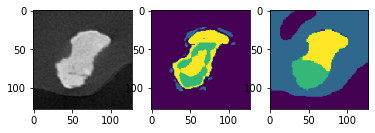

tensor(0.7668, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.81112   1.00000   0.89571     13278
           1    1.00000   0.00451   0.00897      3106

    accuracy                        0.81128     16384
   macro avg    0.90556   0.50225   0.45234     16384
weighted avg    0.84693   0.81128   0.72761     16384

[0.44402849674224854, 0.4559282064437866, 0.4999028444290161, 0.49732327461242676]


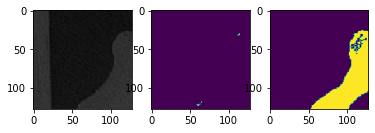

tensor(0.7590, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.49705   0.98762   0.66129      7592
           1    0.78085   0.04675   0.08822      7850
           2    1.00000   0.11058   0.19913       624
           3    0.29737   0.71069   0.41929       318

    accuracy                        0.49805     16384
   macro avg    0.64382   0.46391   0.34198     16384
weighted avg    0.64831   0.49805   0.36442     16384

[0.40521764755249023, 0.44950079917907715, 0.4969714879989624, 0.5255267024040222]


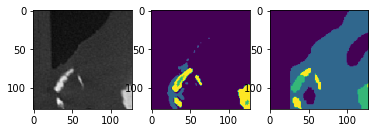

tensor(0.6961, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68835   0.99489   0.81371     10379
           1    0.84842   0.08049   0.14703      5007
           2    0.80757   0.37372   0.51098       685
           3    0.30964   0.58466   0.40487       313

    accuracy                        0.68164     16384
   macro avg    0.66350   0.50844   0.46915     16384
weighted avg    0.73502   0.68164   0.58950     16384

[0.5066248178482056, 0.5128157138824463, 0.5177379846572876, 0.5174931883811951]


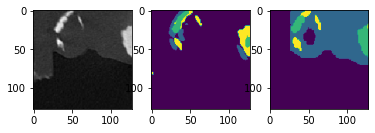

tensor(0.8488, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40154   0.99893   0.57283      6559
           1    0.89552   0.00611   0.01213      9825

    accuracy                        0.40356     16384
   macro avg    0.64853   0.50252   0.29248     16384
weighted avg    0.69777   0.40356   0.23659     16384

[0.2949410676956177, 0.43265897035598755, 0.49987053871154785, 0.4966112971305847]


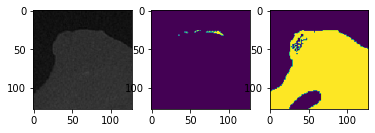

tensor(0.7428, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.50046   1.00000   0.66707      7143
           1    0.89199   0.06358   0.11870      7534
           2    0.06904   0.08462   0.07604       390
           3    0.67701   0.56340   0.61500      1317

    accuracy                        0.51251     16384
   macro avg    0.53462   0.42790   0.36920     16384
weighted avg    0.68442   0.51251   0.39665     16384

[0.418737530708313, 0.500618577003479, 0.4997488260269165, 0.5232458710670471]


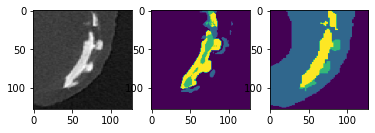

tensor(0.7279, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51284   0.99971   0.67792      6872
           1    0.95733   0.19513   0.32419      7933
           2    0.08899   0.43304   0.14764       224
           3    0.60498   0.12546   0.20782      1355

    accuracy                        0.53009     16384
   macro avg    0.54104   0.43834   0.33939     16384
weighted avg    0.72988   0.53009   0.46052     16384

[0.45277202129364014, 0.6169636845588684, 0.49621230363845825, 0.48823922872543335]


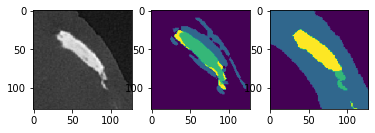

tensor(0.7913, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64885   0.99681   0.78604     10351
           1    0.93154   0.07498   0.13879      5988
           3    0.00000   0.00000   0.00000        45

    accuracy                        0.65717     16384
   macro avg    0.52679   0.35727   0.30828     16384
weighted avg    0.75038   0.65717   0.54733     16384

[0.3840174674987793, 0.3729470372200012, 0.4998828172683716, 0.4932527542114258]


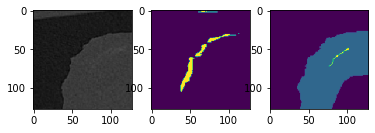

tensor(0.8208, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.61905   0.99869   0.76432      9911
           1    0.96709   0.05901   0.11124      6473

    accuracy                        0.62744     16384
   macro avg    0.79307   0.52885   0.43778     16384
weighted avg    0.75655   0.62744   0.50630     16384

[0.33465611934661865, 0.35731571912765503, 0.499908983707428, 0.48542696237564087]


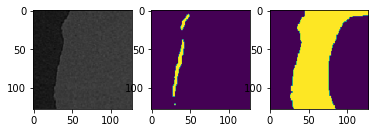

tensor(0.8282, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55081   0.99989   0.71032      8966
           1    0.99074   0.01445   0.02848      7407
           3    0.00000   0.00000   0.00000        11

    accuracy                        0.55371     16384
   macro avg    0.51385   0.33811   0.24627     16384
weighted avg    0.74933   0.55371   0.40159     16384

[0.33206623792648315, 0.38919776678085327, 0.4999028444290161, 0.48800575733184814]


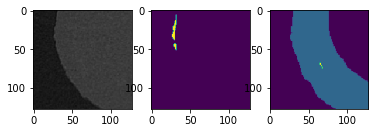

tensor(0.7809, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.49831   1.00000   0.66517      7828
           1    0.99010   0.02498   0.04872      8008
           3    0.97252   0.83942   0.90108       548

    accuracy                        0.51807     16384
   macro avg    0.82031   0.62146   0.53832     16384
weighted avg    0.75454   0.51807   0.37176     16384

[0.3728826642036438, 0.43186450004577637, 0.49987202882766724, 0.5238040685653687]


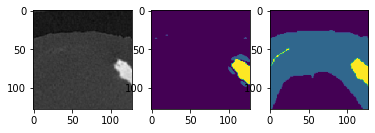

tensor(0.7374, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.85233   1.00000   0.92028     13725
           1    1.00000   0.01342   0.02648      2385
           2    0.00000   0.00000   0.00000         0
           3    0.99291   0.51095   0.67470       274

    accuracy                        0.84821     16384
   macro avg    0.71131   0.38109   0.40536     16384
weighted avg    0.87617   0.84821   0.78606     16384

[0.49729055166244507, 0.5477886199951172, 0.49926191568374634, 0.4833415746688843]


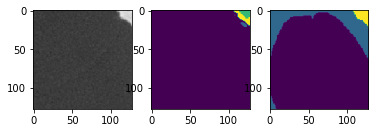

tensor(0.7975, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69128   1.00000   0.81747     11326
           1    0.00000   0.00000   0.00000      5058

    accuracy                        0.69128     16384
   macro avg    0.34564   0.50000   0.40873     16384
weighted avg    0.47787   0.69128   0.56510     16384

[0.4083020091056824, 0.446027934551239, 0.49995601177215576, 0.47489601373672485]


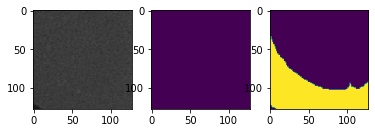

tensor(0.7078, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.59374   1.00000   0.74509      8133
           1    0.93835   0.19307   0.32024      6780
           2    0.11248   0.37273   0.17281       220
           3    0.76512   0.34373   0.47435      1251

    accuracy                        0.60754     16384
   macro avg    0.60242   0.47738   0.42812     16384
weighted avg    0.74297   0.60754   0.54092     16384

[0.4530590772628784, 0.6188057065010071, 0.49835288524627686, 0.5045333504676819]


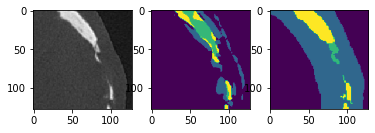

tensor(0.6946, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55425   0.99715   0.71248      7024
           1    0.94003   0.18809   0.31346      6917
           2    0.98452   0.49610   0.65975      2435
           3    0.00528   0.75000   0.01049         8

    accuracy                        0.58099     16384
   macro avg    0.62102   0.60783   0.42404     16384
weighted avg    0.78079   0.58099   0.53584     16384

[0.4737429618835449, 0.5549603700637817, 0.5441731810569763, 0.4948025941848755]


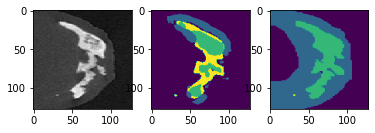

tensor(0.7783, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.66400   0.98761   0.79410     10495
           1    0.83204   0.10995   0.19424      5857
           3    0.00000   0.00000   0.00000        32

    accuracy                        0.67194     16384
   macro avg    0.49868   0.36586   0.32945     16384
weighted avg    0.72277   0.67194   0.57811     16384

[0.38657963275909424, 0.3899695873260498, 0.4998730421066284, 0.4952465295791626]


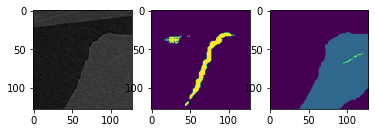

tensor(0.8119, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58521   0.99903   0.73807      9274
           1    0.98370   0.07637   0.14174      7110

    accuracy                        0.59863     16384
   macro avg    0.78445   0.53770   0.43990     16384
weighted avg    0.75814   0.59863   0.47929     16384

[0.34139686822891235, 0.37409305572509766, 0.4999016523361206, 0.4870353937149048]


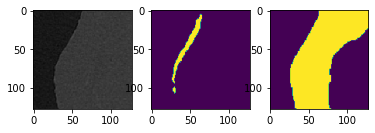

tensor(0.7920, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.59925   0.99917   0.74918      9638
           1    0.95880   0.03834   0.07373      6677
           3    0.97872   0.66667   0.79310        69

    accuracy                        0.60620     16384
   macro avg    0.84559   0.56806   0.53867     16384
weighted avg    0.74738   0.60620   0.47410     16384

[0.3683490753173828, 0.4570974111557007, 0.4998818635940552, 0.4982774257659912]


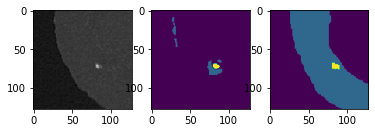

tensor(0.8618, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.37938   0.99661   0.54956      6195
           1    0.80909   0.00878   0.01737     10137
           3    0.00000   0.00000   0.00000        52

    accuracy                        0.38226     16384
   macro avg    0.39616   0.33513   0.18898     16384
weighted avg    0.64404   0.38226   0.21854     16384

[0.2758462429046631, 0.3113722801208496, 0.49991685152053833, 0.48573124408721924]


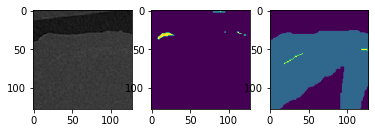

tensor(0.8175, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63446   1.00000   0.77635     10395
           1    0.00000   0.00000   0.00000      5989

    accuracy                        0.63446     16384
   macro avg    0.31723   0.50000   0.38818     16384
weighted avg    0.40254   0.63446   0.49257     16384

[0.3678828477859497, 0.39445972442626953, 0.49996036291122437, 0.47488629817962646]


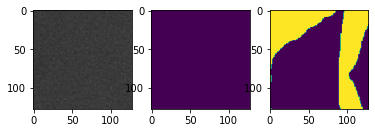

tensor(0.8125, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55870   1.00000   0.71688      9113
           1    1.00000   0.00430   0.00857      7202
           3    1.00000   0.60870   0.75676        69

    accuracy                        0.56067     16384
   macro avg    0.85290   0.53767   0.49407     16384
weighted avg    0.75454   0.56067   0.40569     16384

[0.35376620292663574, 0.4158271551132202, 0.49994516372680664, 0.48274827003479004]


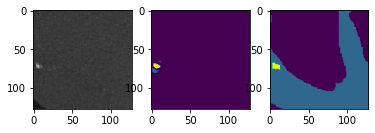

tensor(0.6646, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55915   0.99675   0.71641      7701
           1    0.94073   0.21174   0.34568      7646
           2    0.98624   0.64243   0.77805      1004
           3    0.00000   0.00000   0.00000        33

    accuracy                        0.60669     16384
   macro avg    0.62153   0.46273   0.46003     16384
weighted avg    0.76227   0.60669   0.54574     16384

[0.4836585521697998, 0.5263228416442871, 0.5727963447570801, 0.49189746379852295]


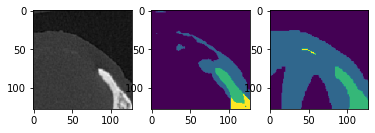

tensor(0.7692, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.51587   0.99898   0.68039      6834
           1    0.91614   0.08292   0.15207      6983
           2    0.94669   0.65719   0.77581      2567
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.55499     16384
   macro avg    0.59467   0.43477   0.40207     16384
weighted avg    0.75397   0.55499   0.47016     16384

[0.3718276023864746, 0.49027758836746216, 0.5264846086502075, 0.48424774408340454]


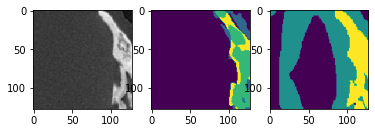

tensor(0.8119, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.35122   0.99820   0.51961      5003
           1    0.91707   0.03900   0.07482      9641
           2    0.92863   0.60890   0.73552      1731
           3    0.01452   1.00000   0.02862         9

    accuracy                        0.39264     16384
   macro avg    0.55286   0.66152   0.33964     16384
weighted avg    0.74501   0.39264   0.28042     16384

[0.32511866092681885, 0.4536969065666199, 0.5274773240089417, 0.4858708381652832]


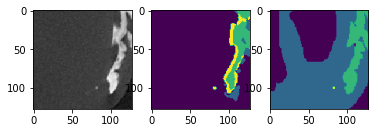

tensor(0.6899, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64575   0.92526   0.76064      9500
           1    0.93956   0.12201   0.21598      5606
           2    0.00000   0.00000   0.00000         0
           3    0.51535   0.49922   0.50715      1278

    accuracy                        0.61719     16384
   macro avg    0.52517   0.38662   0.37094     16384
weighted avg    0.73611   0.61719   0.55451     16384

[0.5312500596046448, 0.5868144631385803, 0.49368542432785034, 0.5107240676879883]


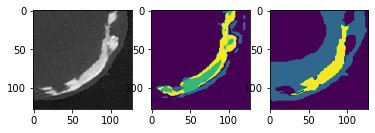

tensor(0.6033, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.59948   0.94455   0.73346      7557
           1    0.93525   0.35563   0.51531      7311
           2    0.00000   0.00000   0.00000         0
           3    0.76150   0.41491   0.53715      1516

    accuracy                        0.63275     16384
   macro avg    0.57406   0.42877   0.44648     16384
weighted avg    0.76430   0.63275   0.61795     16384

[0.5406845211982727, 0.6482070684432983, 0.49299943447113037, 0.5228713750839233]


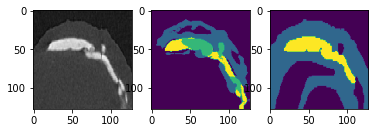

tensor(0.7037, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78847   0.99728   0.88067     12151
           1    0.96207   0.20460   0.33743      4091
           3    0.95862   0.97887   0.96864       142

    accuracy                        0.79919     16384
   macro avg    0.90305   0.72692   0.72891     16384
weighted avg    0.83329   0.79919   0.74579     16384

[0.47014951705932617, 0.42300546169281006, 0.4998169541358948, 0.5140755772590637]


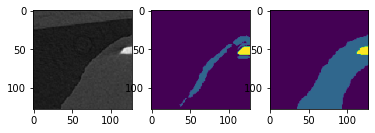

tensor(0.8286, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.50420   0.99874   0.67011      7929
           1    0.98525   0.07901   0.14628      8455

    accuracy                        0.52411     16384
   macro avg    0.74473   0.53887   0.40820     16384
weighted avg    0.75245   0.52411   0.39979     16384

[0.2990286946296692, 0.35468733310699463, 0.4998985528945923, 0.4869563579559326]


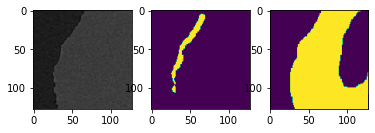

tensor(0.8698, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.38321   1.00000   0.55409      6246
           1    1.00000   0.00838   0.01663     10138

    accuracy                        0.38641     16384
   macro avg    0.69161   0.50419   0.28536     16384
weighted avg    0.76487   0.38641   0.22152     16384

[0.24515724182128906, 0.28814494609832764, 0.49990344047546387, 0.48949187994003296]


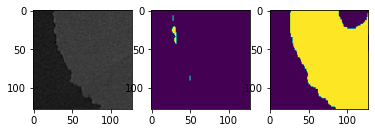

tensor(0.8034, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70886   1.00000   0.82963     11614
           1    0.00000   0.00000   0.00000      4770

    accuracy                        0.70886     16384
   macro avg    0.35443   0.50000   0.41482     16384
weighted avg    0.50249   0.70886   0.58809     16384

[0.3976977467536926, 0.4430040717124939, 0.4999347925186157, 0.4772402048110962]


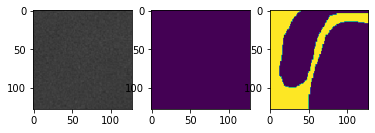

tensor(0.8630, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.43036   1.00000   0.60175      7051
           1    0.00000   0.00000   0.00000      9333

    accuracy                        0.43036     16384
   macro avg    0.21518   0.50000   0.30087     16384
weighted avg    0.18521   0.43036   0.25897     16384

[0.278630793094635, 0.3420296907424927, 0.499939501285553, 0.47715145349502563]


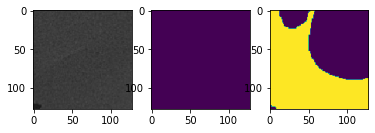

tensor(0.7780, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68550   0.85433   0.76066     10881
           1    0.82270   0.14734   0.24992      5165
           2    0.00000   0.00000   0.00000         0
           3    0.26455   0.29586   0.27933       338

    accuracy                        0.61993     16384
   macro avg    0.44319   0.32438   0.32248     16384
weighted avg    0.72007   0.61993   0.58972     16384

[0.38408923149108887, 0.5993072986602783, 0.48828834295272827, 0.4944460391998291]


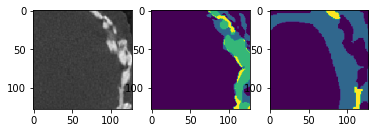

tensor(0.7452, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58361   0.92303   0.71509      8640
           1    0.94384   0.08212   0.15110      6344
           2    0.00000   0.00000   0.00000         0
           3    0.67802   0.46929   0.55466      1400

    accuracy                        0.55865     16384
   macro avg    0.55137   0.36861   0.35521     16384
weighted avg    0.73116   0.55865   0.48300     16384

[0.4403343200683594, 0.5987598896026611, 0.4929124116897583, 0.5020674467086792]


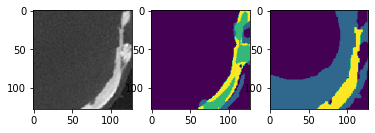

tensor(0.5976, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.53992   0.99971   0.70116      6907
           1    0.97184   0.16988   0.28920      7111
           2    0.00000   0.00000   0.00000         0
           3    0.92324   0.56932   0.70431      2366

    accuracy                        0.57739     16384
   macro avg    0.60875   0.43473   0.42367     16384
weighted avg    0.78274   0.57739   0.52282     16384

[0.5683878660202026, 0.6172700524330139, 0.49587297439575195, 0.5409830212593079]


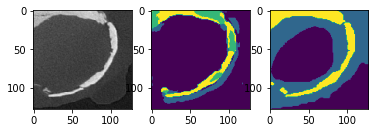

tensor(0.8581, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.04246   0.98444   0.08141       450
           1    0.79795   0.05256   0.09862     10370
           2    0.00000   0.00000   0.00000         0
           3    0.94217   0.26941   0.41901      5564

    accuracy                        0.15179     16384
   macro avg    0.44565   0.32660   0.14976     16384
weighted avg    0.82618   0.15179   0.20695     16384

[0.2882322072982788, 0.5208443999290466, 0.48305565118789673, 0.42552489042282104]


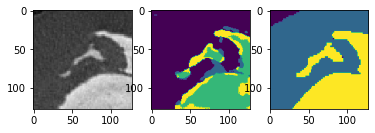

tensor(0.6478, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.43694   0.99216   0.60670      4208
           1    0.96641   0.28579   0.44112      8055
           2    0.00000   0.00000   0.00000         0
           3    0.84577   0.28610   0.42756      4121

    accuracy                        0.46729     16384
   macro avg    0.56228   0.39101   0.36885     16384
weighted avg    0.80008   0.46729   0.48024     16384

[0.5903735160827637, 0.6533555388450623, 0.482052206993103, 0.4898309111595154]


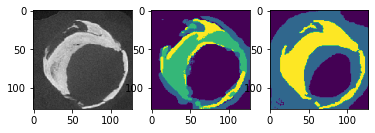

tensor(0.7790, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70850   0.97701   0.82137     11307
           1    0.44064   0.04586   0.08308      4775
           2    0.00000   0.00000   0.00000         0
           3    0.94915   0.18543   0.31025       302

    accuracy                        0.69104     16384
   macro avg    0.52458   0.30207   0.30367     16384
weighted avg    0.63487   0.69104   0.59678     16384

[0.4470008611679077, 0.36381423473358154, 0.4981720447540283, 0.4994692802429199]


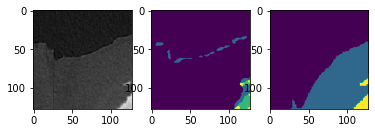

tensor(0.7268, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.66530   1.00000   0.79901      9555
           1    0.98504   0.07404   0.13773      5335
           2    0.00000   0.00000   0.00000         0
           3    0.89037   0.35877   0.51145      1494

    accuracy                        0.64001     16384
   macro avg    0.63518   0.35820   0.36205     16384
weighted avg    0.78994   0.64001   0.55746     16384

[0.49179381132125854, 0.5005906820297241, 0.4919711947441101, 0.5215091705322266]


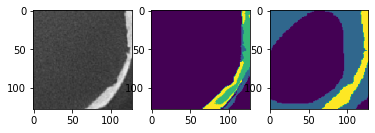

tensor(0.7185, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.76409   0.99470   0.86428     11895
           1    0.72124   0.04258   0.08041      3828
           2    0.00000   0.00000   0.00000         0
           3    0.95427   0.72617   0.82474       661

    accuracy                        0.76141     16384
   macro avg    0.60990   0.44086   0.44236     16384
weighted avg    0.76175   0.76141   0.67954     16384

[0.4934568405151367, 0.37723469734191895, 0.49945372343063354, 0.5259323716163635]


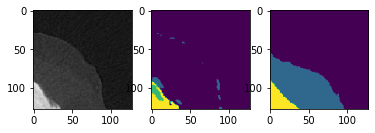

tensor(0.8022, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69310   0.92499   0.79243     11319
           1    0.00000   0.00000   0.00000      5065
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.63904     16384
   macro avg    0.23103   0.30833   0.26414     16384
weighted avg    0.47883   0.63904   0.54746     16384

[0.5167286396026611, 0.4631531834602356, 0.4998016953468323, 0.48835253715515137]


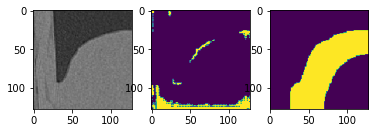

tensor(0.8393, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63077   0.89581   0.74028     10481
           1    0.00000   0.00000   0.00000      5903
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.57306     16384
   macro avg    0.21026   0.29860   0.24676     16384
weighted avg    0.40351   0.57306   0.47357     16384

[0.38110822439193726, 0.3956642150878906, 0.49977636337280273, 0.49001407623291016]


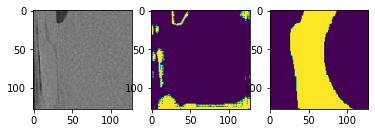

tensor(0.7983, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69359   0.91974   0.79081     11587
           1    0.00000   0.00000   0.00000      4797
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.65045     16384
   macro avg    0.23120   0.30658   0.26360     16384
weighted avg    0.49052   0.65045   0.55927     16384

[0.4492518901824951, 0.5044531226158142, 0.49979305267333984, 0.49111777544021606]


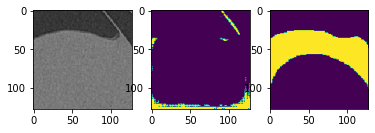

tensor(0.7633, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.97616   0.95876   0.96738     15375
           1    0.00000   0.00000   0.00000      1009
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.89972     16384
   macro avg    0.32539   0.31959   0.32246     16384
weighted avg    0.91604   0.89972   0.90781     16384

[0.528395414352417, 0.40277689695358276, 0.4997749328613281, 0.4914191961288452]


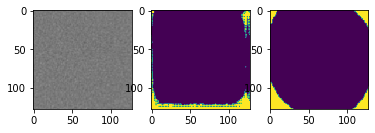

tensor(0.7699, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.79007   0.89683   0.84007     12581
           1    0.54394   0.12043   0.19720      3803
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.71661     16384
   macro avg    0.44467   0.33909   0.34576     16384
weighted avg    0.73294   0.71661   0.69085     16384

[0.5174462795257568, 0.4631671905517578, 0.49931633472442627, 0.490836501121521]


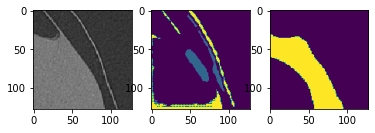

tensor(0.8223, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.69743   0.91477   0.79145     11440
           1    0.08718   0.00344   0.00662      4944
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.63977     16384
   macro avg    0.26154   0.30607   0.26602     16384
weighted avg    0.51329   0.63977   0.55462     16384

[0.4121318459510803, 0.3829418420791626, 0.49978530406951904, 0.49176859855651855]


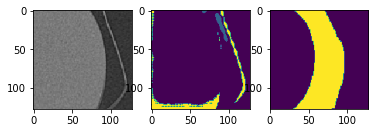

tensor(0.9005, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.23945   0.96867   0.38398      3479
           1    0.72366   0.03043   0.05841     11960
           2    0.11040   0.09620   0.10281       894
           3    0.00000   0.00000   0.00000        51

    accuracy                        0.23315     16384
   macro avg    0.26838   0.27383   0.13630     16384
weighted avg    0.58512   0.23315   0.12978     16384

[0.2484918236732483, 0.40343260765075684, 0.4875626564025879, 0.494503378868103]


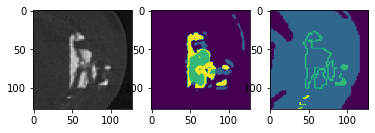

tensor(0.9202, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.17737   0.97648   0.30021      2551
           1    0.73871   0.01801   0.03517     12712
           2    0.08479   0.06367   0.07273      1068
           3    0.01466   0.33962   0.02810        53

    accuracy                        0.17126     16384
   macro avg    0.25388   0.34945   0.10905     16384
weighted avg    0.60634   0.17126   0.07886     16384

[0.22760820388793945, 0.38548481464385986, 0.48061323165893555, 0.49536073207855225]


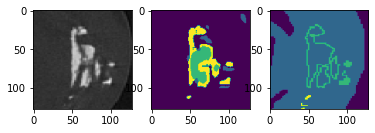

tensor(0.8084, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.20614   1.00000   0.34182      3069
           1    0.92763   0.02368   0.04618     11910
           2    0.00000   0.00000   0.00000         0
           3    1.00000   0.75730   0.86189      1405

    accuracy                        0.26947     16384
   macro avg    0.53344   0.44524   0.31247     16384
weighted avg    0.79869   0.26947   0.17151     16384

[0.24983078241348267, 0.5098165273666382, 0.49913227558135986, 0.5512597560882568]


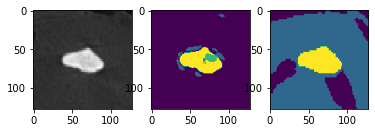

tensor(0.7642, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.83676   0.99730   0.91000     13687
           1    0.47887   0.01261   0.02457      2697

    accuracy                        0.83521     16384
   macro avg    0.65781   0.50495   0.46728     16384
weighted avg    0.77784   0.83521   0.76425     16384

[0.4509037733078003, 0.41344666481018066, 0.4998873472213745, 0.49792933464050293]


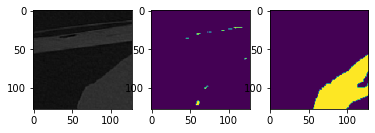

tensor(0.8054, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63466   1.00000   0.77651     10352
           1    1.00000   0.01210   0.02391      6032

    accuracy                        0.63629     16384
   macro avg    0.81733   0.50605   0.40021     16384
weighted avg    0.76917   0.63629   0.49943     16384

[0.36173051595687866, 0.4578244090080261, 0.4998556971549988, 0.49752742052078247]


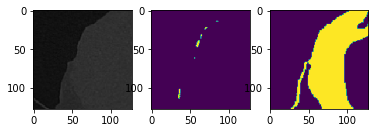

tensor(0.7798, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.74733   0.95769   0.83953     12267
           1    0.21837   0.03522   0.06066      4117

    accuracy                        0.72589     16384
   macro avg    0.48285   0.49646   0.45009     16384
weighted avg    0.61441   0.72589   0.64382     16384

[0.4194111227989197, 0.46122968196868896, 0.49982380867004395, 0.49793094396591187]


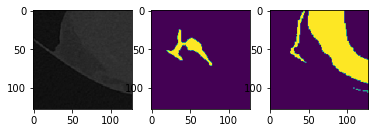

tensor(0.7173, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.58232   0.98521   0.73199      9058
           1    0.75132   0.06302   0.11628      6760
           3    0.99797   0.86749   0.92817       566

    accuracy                        0.60065     16384
   macro avg    0.77720   0.63857   0.59214     16384
weighted avg    0.66641   0.60065   0.48472     16384

[0.4339890480041504, 0.48702555894851685, 0.4998347759246826, 0.5658621191978455]


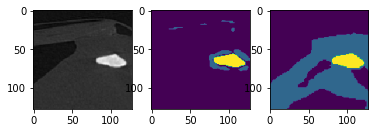

tensor(0.8112, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.61737   1.00000   0.76343     10115
           1    0.00000   0.00000   0.00000      6269

    accuracy                        0.61737     16384
   macro avg    0.30869   0.50000   0.38171     16384
weighted avg    0.38115   0.61737   0.47132     16384

[0.37886571884155273, 0.46886521577835083, 0.4998131990432739, 0.49647796154022217]


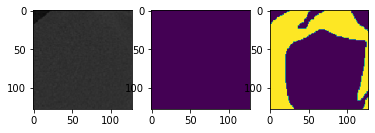

tensor(0.7804, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64400   1.00000   0.78346     10494
           1    1.00000   0.00343   0.00684      5832
           3    0.73913   0.87931   0.80315        58

    accuracy                        0.64484     16384
   macro avg    0.79438   0.62758   0.53115     16384
weighted avg    0.77106   0.64484   0.50708     16384

[0.413236141204834, 0.46487748622894287, 0.49983394145965576, 0.5177126526832581]


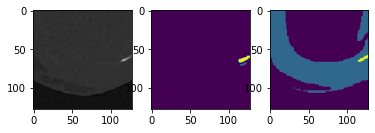

tensor(0.7268, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55603   0.98950   0.71198      8474
           1    0.82512   0.07187   0.13223      7221
           2    0.00000   0.00000   0.00000       126
           3    0.69706   0.80107   0.74545       563

    accuracy                        0.57098     16384
   macro avg    0.51955   0.46561   0.39742     16384
weighted avg    0.67520   0.57098   0.45214     16384

[0.4310535192489624, 0.47296613454818726, 0.49795424938201904, 0.540046215057373]


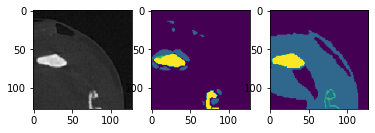

tensor(0.8316, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.48237   1.00000   0.65081      7061
           1    0.94262   0.05252   0.09949      8759
           2    0.22533   0.29254   0.25458       523
           3    0.01727   0.24390   0.03226        41

    accuracy                        0.46899     16384
   macro avg    0.41690   0.39724   0.25928     16384
weighted avg    0.71906   0.46899   0.34188     16384

[0.3392624855041504, 0.4334613084793091, 0.5063620805740356, 0.4963761568069458]


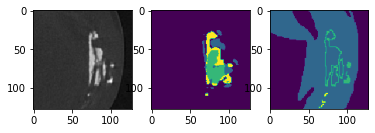

tensor(0.7166, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.67702   1.00000   0.80741     10313
           1    0.94941   0.09912   0.17950      5680
           2    0.30466   0.32692   0.31540       260
           3    0.26165   0.55725   0.35610       131

    accuracy                        0.67346     16384
   macro avg    0.54818   0.49582   0.41460     16384
weighted avg    0.76222   0.67346   0.57831     16384

[0.47200632095336914, 0.4968861937522888, 0.5169870257377625, 0.5222139954566956]


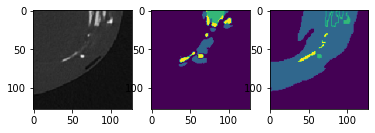

tensor(0.6991, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.60578   0.99600   0.75336      8757
           1    0.81772   0.05704   0.10664      5663
           2    0.37260   0.15247   0.21639       892
           3    0.61664   0.70522   0.65796      1072

    accuracy                        0.60651     16384
   macro avg    0.60319   0.47768   0.43359     16384
weighted avg    0.66705   0.60651   0.49435     16384

[0.5445303916931152, 0.5145246982574463, 0.4983370304107666, 0.5211439728736877]


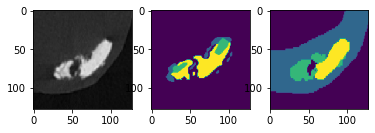

tensor(0.7497, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.61378   0.97101   0.75213      9003
           1    0.71748   0.12066   0.20658      5851
           2    1.00000   0.00460   0.00916      1521
           3    0.00000   0.00000   0.00000         9

    accuracy                        0.57709     16384
   macro avg    0.58281   0.27407   0.24197     16384
weighted avg    0.68633   0.57709   0.48792     16384

[0.5299052596092224, 0.5770902633666992, 0.4760713577270508, 0.4914771318435669]


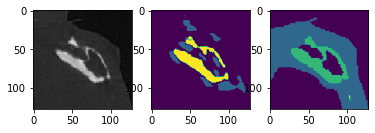

tensor(0.7657, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.53108   0.95937   0.68369      7285
           1    0.77153   0.16749   0.27523      6472
           2    0.00000   0.00000   0.00000      2607
           3    0.00000   0.00000   0.00000        20

    accuracy                        0.49274     16384
   macro avg    0.32565   0.28171   0.23973     16384
weighted avg    0.54091   0.49274   0.41272     16384

[0.5301424264907837, 0.5846586227416992, 0.45652544498443604, 0.48883700370788574]


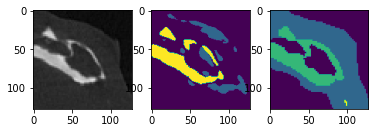

tensor(0.6825, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.78894   0.95233   0.86297     11222
           1    0.80382   0.43818   0.56718      5087
           2    0.98462   0.85333   0.91429        75

    accuracy                        0.79224     16384
   macro avg    0.85913   0.74794   0.78148     16384
weighted avg    0.79446   0.79224   0.77136     16384

[0.52341628074646, 0.5369099974632263, 0.5167961716651917, 0.4983641505241394]


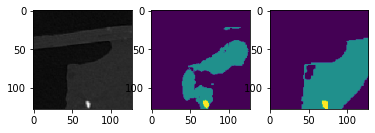

tensor(0.7984, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.64982   0.90600   0.75682      9553
           1    0.69963   0.31220   0.43175      6752
           2    0.00000   0.00000   0.00000        79
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.65692     16384
   macro avg    0.33736   0.30455   0.29714     16384
weighted avg    0.66722   0.65692   0.61921     16384

[0.362851083278656, 0.43735742568969727, 0.4987155795097351, 0.49813103675842285]


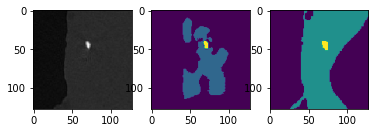

tensor(0.6824, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72069   0.96452   0.82496      9751
           1    0.86391   0.39462   0.54177      5727
           2    0.00000   0.00000   0.00000       906
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.71198     16384
   macro avg    0.39615   0.33978   0.34168     16384
weighted avg    0.73090   0.71198   0.68036     16384

[0.5857234001159668, 0.5873041749000549, 0.48556649684906006, 0.49401867389678955]


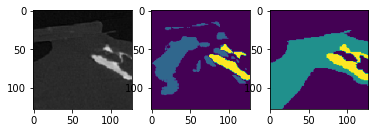

tensor(0.8038, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.75981   0.63210   0.69010     13232
           1    0.06275   0.11100   0.08018      2937
           2    0.00000   0.00000   0.00000       215
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.53040     16384
   macro avg    0.20564   0.18578   0.19257     16384
weighted avg    0.62489   0.53040   0.57171     16384

[0.48707324266433716, 0.2978757619857788, 0.4966716766357422, 0.49738895893096924]


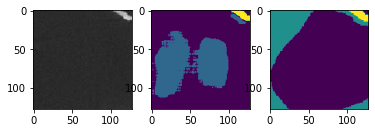

tensor(0.7685, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.30805   0.82987   0.44932      4567
           1    0.33467   0.04840   0.08457      8616
           2    0.99577   0.45501   0.62461      3101
           3    0.05430   0.77000   0.10145       100

    accuracy                        0.34760     16384
   macro avg    0.42320   0.52582   0.31499     16384
weighted avg    0.45067   0.34760   0.28856     16384

[0.42474615573883057, 0.5087286233901978, 0.5474098920822144, 0.4959760904312134]


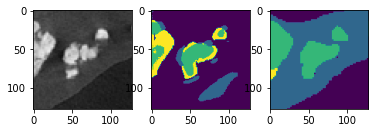

tensor(0.9029, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.20438   0.88182   0.33185      3427
           1    0.35079   0.01725   0.03289     11650
           2    0.00000   0.00000   0.00000      1307
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.19672     16384
   macro avg    0.13879   0.22477   0.09118     16384
weighted avg    0.29218   0.19672   0.09280     16384

[0.26125621795654297, 0.37425369024276733, 0.47853076457977295, 0.4895925521850586]


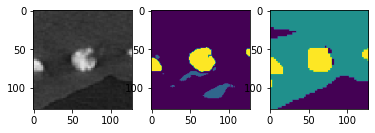

tensor(0.6515, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.35160   0.99062   0.51900      3944
           1    0.89455   0.09309   0.16864      8110
           2    0.44065   0.70724   0.54299      1643
           3    0.67728   0.45143   0.54176      2687

    accuracy                        0.42950     16384
   macro avg    0.59102   0.56060   0.44310     16384
weighted avg    0.68270   0.42950   0.35171     16384

[0.5384735465049744, 0.5625812411308289, 0.5693792104721069, 0.49178940057754517]


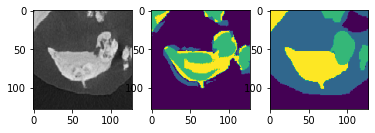

tensor(0.7075, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.18733   0.99485   0.31530      2135
           1    0.81928   0.04281   0.08136      9531
           2    0.94718   0.81971   0.87885      3938
           3    0.46754   0.68333   0.55521       780

    accuracy                        0.38409     16384
   macro avg    0.60533   0.63517   0.45768     16384
weighted avg    0.75093   0.38409   0.32609     16384

[0.39267146587371826, 0.5575370788574219, 0.5869325399398804, 0.5034223794937134]


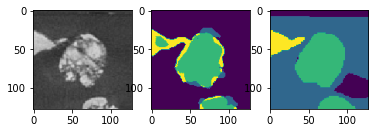

tensor(0.7346, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.39512   0.85401   0.54027      5836
           1    0.51474   0.11600   0.18933      8431
           2    0.97379   0.45631   0.62142      2117
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.42285     16384
   macro avg    0.47091   0.35658   0.33776     16384
weighted avg    0.53144   0.42285   0.37017     16384

[0.4885901212692261, 0.45263105630874634, 0.5556663870811462, 0.49454182386398315]


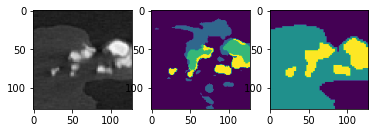

tensor(0.6527, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.32142   0.99763   0.48620      3381
           1    0.96622   0.17778   0.30031      8848
           2    0.51272   0.88801   0.65009      1384
           3    0.87024   0.58571   0.70017      2771

    accuracy                        0.47595     16384
   macro avg    0.66765   0.66228   0.53419     16384
weighted avg    0.77862   0.47595   0.43584     16384

[0.45267826318740845, 0.6171383857727051, 0.5367875695228577, 0.5085000991821289]


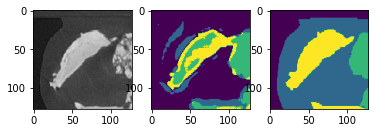

tensor(0.7021, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77375   0.85175   0.81088     10833
           1    0.33183   0.23632   0.27605      3436
           2    0.95870   0.41702   0.58122      2115
           3    0.00000   0.00000   0.00000         0

    accuracy                        0.66656     16384
   macro avg    0.51607   0.37627   0.41704     16384
weighted avg    0.70495   0.66656   0.66907     16384

[0.6214897632598877, 0.41997575759887695, 0.5360614657402039, 0.495830774307251]


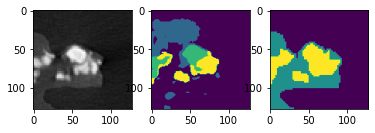

tensor(0.7339, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.87395   0.89498   0.88434     13797
           1    0.12921   0.10739   0.11729      2002
           2    0.00000   0.00000   0.00000         0
           3    0.96680   0.39829   0.56416       585

    accuracy                        0.78101     16384
   macro avg    0.49249   0.35017   0.39145     16384
weighted avg    0.78626   0.78101   0.77918     16384

[0.5450395345687866, 0.2877521514892578, 0.49760377407073975, 0.508441150188446]


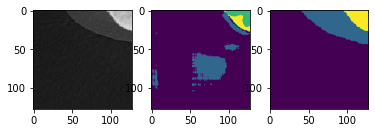

tensor(0.7682, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.96295   0.98113     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.96295     16384
   macro avg    0.50000   0.48148   0.49056     16384
weighted avg    1.00000   0.96295   0.98113     16384

[0.4909680485725403, 0.2325960397720337, 0.4999008774757385, 0.4991832375526428]


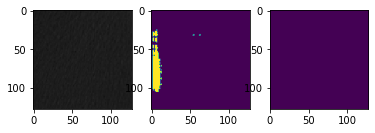

tensor(0.7657, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.95593   0.97747     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.95593     16384
   macro avg    0.50000   0.47797   0.48873     16384
weighted avg    1.00000   0.95593   0.97747     16384

[0.4915139675140381, 0.2422657012939453, 0.4999047517776489, 0.49913865327835083]


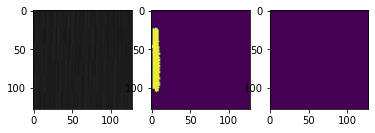

tensor(0.6386, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.73248   0.66517   0.69720     10904
           1    0.09390   0.12761   0.10819      2970
           2    0.02839   0.13333   0.04681       165
           3    0.90305   0.64350   0.75149      2345

    accuracy                        0.55927     16384
   macro avg    0.43946   0.39240   0.40092     16384
weighted avg    0.63404   0.55927   0.59165     16384

[0.7066084146499634, 0.3682788610458374, 0.4990302324295044, 0.51356041431427]


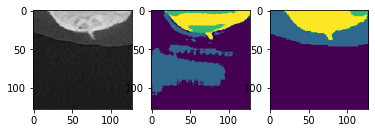

tensor(0.7643, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.96057   0.97989     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.96057     16384
   macro avg    0.50000   0.48029   0.48994     16384
weighted avg    1.00000   0.96057   0.97989     16384

[0.4918968677520752, 0.24788719415664673, 0.4999069571495056, 0.49913328886032104]


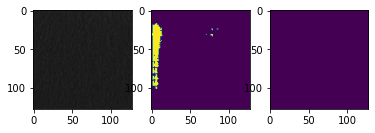

tensor(0.7603, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.96674   0.98309     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.96674     16384
   macro avg    0.50000   0.48337   0.49154     16384
weighted avg    1.00000   0.96674   0.98309     16384

[0.4928765892982483, 0.2647494673728943, 0.4999145269393921, 0.4990720748901367]


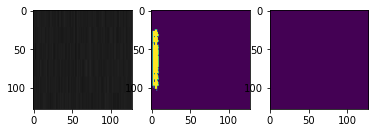

tensor(0.6966, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40497   0.97345   0.57198      5161
           1    0.86134   0.11236   0.19879      8348
           2    0.17458   0.47174   0.25484       460
           3    0.80134   0.54617   0.64959      2415

    accuracy                        0.45764     16384
   macro avg    0.56056   0.52593   0.41880     16384
weighted avg    0.68946   0.45764   0.38437     16384

[0.45530205965042114, 0.5186152458190918, 0.5163597464561462, 0.5269643068313599]


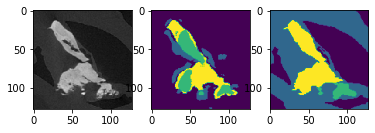

tensor(0.7970, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.72810   0.96993   0.83180     12007
           1    0.07198   0.00640   0.01175      4377

    accuracy                        0.71252     16384
   macro avg    0.40004   0.48817   0.42177     16384
weighted avg    0.55282   0.71252   0.61272     16384

[0.4096147418022156, 0.3942381739616394, 0.49985551834106445, 0.4974430799484253]


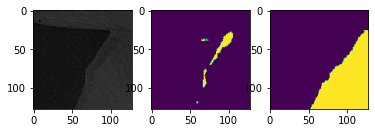

tensor(0.8641, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.40940   0.99399   0.57994      6651
           1    0.83051   0.02014   0.03932      9733

    accuracy                        0.41547     16384
   macro avg    0.61995   0.50706   0.30963     16384
weighted avg    0.65956   0.41547   0.25878     16384

[0.2563678026199341, 0.35405445098876953, 0.4998411536216736, 0.49771642684936523]


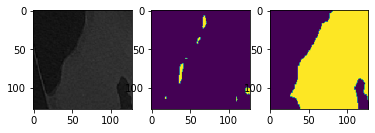

tensor(0.8465, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.47655   0.97944   0.64114      7831
           1    0.44291   0.01497   0.02895      8553

    accuracy                        0.47595     16384
   macro avg    0.45973   0.49720   0.33505     16384
weighted avg    0.45898   0.47595   0.32156     16384

[0.30077284574508667, 0.37204867601394653, 0.4998462200164795, 0.4977116584777832]


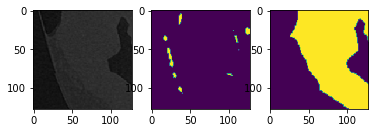

tensor(0.8142, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.77706   0.77700   0.77703     13381
           1    0.00666   0.00666   0.00666      3003

    accuracy                        0.63580     16384
   macro avg    0.39186   0.39183   0.39184     16384
weighted avg    0.63585   0.63580   0.63583     16384

[0.42421066761016846, 0.31901276111602783, 0.49966561794281006, 0.4984092712402344]


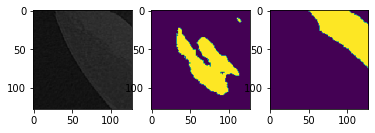

tensor(0.7616, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    1.00000   0.97174   0.98567     16384
           1    0.00000   0.00000   0.00000         0

    accuracy                        0.97174     16384
   macro avg    0.50000   0.48587   0.49283     16384
weighted avg    1.00000   0.97174   0.98567     16384

[0.47534799575805664, 0.37520283460617065, 0.49987661838531494, 0.4984286427497864]


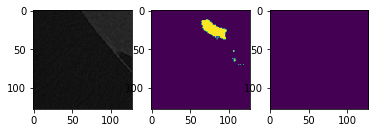

tensor(0.7576, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.38094   0.96424   0.54613      5900
           1    0.64191   0.04050   0.07618      9606
           2    0.00000   0.00000   0.00000         0
           3    0.97862   0.93850   0.95814       878

    accuracy                        0.42126     16384
   macro avg    0.50037   0.48581   0.39511     16384
weighted avg    0.56598   0.42126   0.29268     16384

[0.3490009307861328, 0.5215826034545898, 0.4997282028198242, 0.5463350415229797]


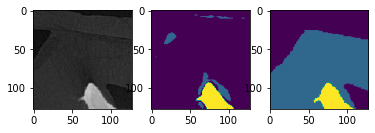

tensor(0.8231, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.17508   0.99764   0.29789      2123
           1    0.93071   0.06513   0.12173     10518
           2    0.00000   0.00000   0.00000        14
           3    0.97073   0.55135   0.70327      3729

    accuracy                        0.29657     16384
   macro avg    0.51913   0.40353   0.28072     16384
weighted avg    0.84111   0.29657   0.27681     16384

[0.26645559072494507, 0.5029605627059937, 0.493388295173645, 0.4572800397872925]


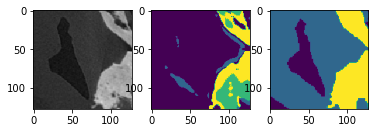

tensor(0.7920, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.80615   0.95929   0.87608     13313
           1    0.00000   0.00000   0.00000      3071

    accuracy                        0.77948     16384
   macro avg    0.40307   0.47964   0.43804     16384
weighted avg    0.65504   0.77948   0.71187     16384

[0.4292067289352417, 0.3772772550582886, 0.49983417987823486, 0.4982948303222656]


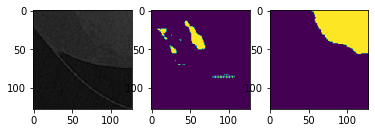

tensor(0.7863, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.42278   0.96570   0.58810      6764
           1    0.44076   0.02044   0.03906      9102
           3    0.98047   0.96911   0.97476       518

    accuracy                        0.44067     16384
   macro avg    0.61467   0.65175   0.53397     16384
weighted avg    0.45040   0.44067   0.29531     16384

[0.3506205081939697, 0.48180341720581055, 0.49976837635040283, 0.5195670127868652]


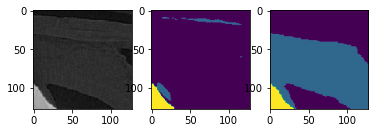

tensor(0.7997, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.63645   0.97240   0.76935     10507
           1    0.12387   0.00698   0.01321      5877

    accuracy                        0.62610     16384
   macro avg    0.38016   0.48969   0.39128     16384
weighted avg    0.45259   0.62610   0.49812     16384

[0.3974074125289917, 0.45569908618927, 0.4998554587364197, 0.4981130361557007]


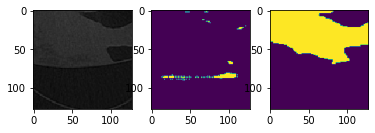

tensor(0.7950, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.70805   0.98291   0.82314     11646
           1    0.08295   0.00380   0.00727      4738

    accuracy                        0.69977     16384
   macro avg    0.39550   0.49336   0.41520     16384
weighted avg    0.52728   0.69977   0.58720     16384

[0.4088115692138672, 0.38429903984069824, 0.4998830556869507, 0.4970605969429016]


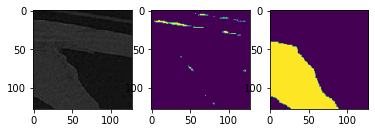

tensor(0.8129, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.55509   0.99989   0.71387      9085
           1    0.94737   0.00247   0.00492      7299

    accuracy                        0.55554     16384
   macro avg    0.75123   0.50118   0.35939     16384
weighted avg    0.72985   0.55554   0.39804     16384

[0.36945050954818726, 0.38911688327789307, 0.4998924136161804, 0.4976874589920044]


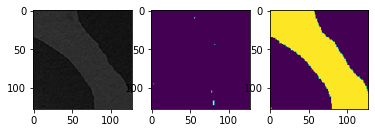

tensor(0.7377, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.50534   0.93623   0.65639      7684
           1    0.58035   0.09024   0.15619      7724
           2    0.60771   0.57166   0.58913       607
           3    0.35638   0.36314   0.35973       369

    accuracy                        0.51099     16384
   macro avg    0.51244   0.49032   0.44036     16384
weighted avg    0.54114   0.51099   0.41140     16384

[0.43600523471832275, 0.4146909713745117, 0.5203949213027954, 0.5001663565635681]


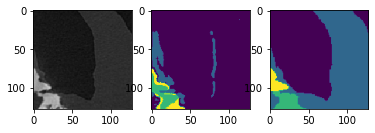

tensor(0.7820, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.29017   0.99219   0.44902      4095
           1    0.86763   0.06808   0.12625     10591
           2    0.74349   0.45147   0.56180      1329
           3    0.19624   0.39566   0.26235       369

    accuracy                        0.33752     16384
   macro avg    0.52438   0.47685   0.34986     16384
weighted avg    0.69811   0.33752   0.24532     16384

[0.3369205594062805, 0.47575753927230835, 0.5197234153747559, 0.4976247549057007]


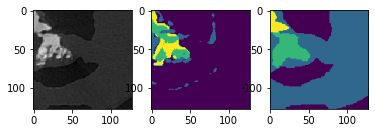

tensor(0.7901, grad_fn=<RsubBackward1>)
              precision    recall  f1-score   support

           0    0.68868   0.99192   0.81295     11269
           1    0.40523   0.01212   0.02354      5115

    accuracy                        0.68604     16384
   macro avg    0.54696   0.50202   0.41824     16384
weighted avg    0.60019   0.68604   0.56650     16384

[0.39971721172332764, 0.48046374320983887, 0.4998672604560852, 0.49806082248687744]


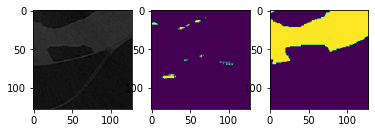

[0.42101365 0.45076558 0.50390414 0.50039087] 0.7689072673625135


In [107]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 
import warnings
warnings.filterwarnings("ignore")


op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 4

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_4_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 4  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


In [ ]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 
import warnings
warnings.filterwarnings("ignore")


op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 5

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_2_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 1  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


## UNET 1

In [ ]:
#---------------------
op_value = None
error = 15
Area = 50
train =  True
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)


image_shape = (64, 64) 
batch_size = 16


data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders = torch.utils.data.DataLoader(data, batch_size)
#----------------------
# Model 
input_channels = 9
num_classes = 5
learning_rate = 1e-3  
epochs = 101
loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_1_more_classes'


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
if not os.path.exists(modelPath):
    os.makedirs(modelPath)

net = UNET_multi(input_channels, num_classes) 
net.to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)
#summary(net)
#sum(p.numel() for p in net.parameters() if p.requires_grad) 
tloss, tloss_list = training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath,  multi= True)
plt.plot(tloss_list)


In [ ]:
#---------------------
op_value = None
error = 15
Area = 100
train =  True
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



In [ ]:
#---------------------
op_value = None
error = 20
Area = 100
train =  True
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)


image_shape = (128, 128) 
batch_size = 16


data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders = torch.utils.data.DataLoader(data, batch_size)
#----------------------
# Model 
input_channels = 9
num_classes = 5
learning_rate = 5e-3  
epochs = 201
loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_2_more_classes'


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
if not os.path.exists(modelPath):
    os.makedirs(modelPath)

net = UNET_multi(input_channels, num_classes) 
net.to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, weight_decay=0)
#summary(net)
#sum(p.numel() for p in net.parameters() if p.requires_grad) 
tloss, tloss_list = training_Unet(dataloaders, epochs, device, loss_fn, net, optimizer, modelPath,  multi= True)
plt.plot(tloss_list)


## Test


In [ ]:
def test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = False):
    loss_classes =  np.array([[0] * num_classes])
    loss = []
    for _, batch in enumerate(dataloaders_test): 
        if multi:
                X, X_af, X_be, y = batch
                X, X_af, X_be, y = X.to(device), X_af.to(device), X_be.to(device), y.to(device)
                pred = net(X, X_af, X_be)
        else:
                X, y = batch
                X, y  = X.to(device), y.to(device)
                pred = net(X)

        seg = torch.argmax(pred, dim=1).numpy()[0]# torch.argmax(pred, 1).numpy()  # Get  prediction classes
        loss_v = loss_fn(pred, y)
        loss_classes_  = []
        for i in range(pred.shape[1]):
            y1 = 1*(y==i)
            pred1 = pred[:,i,:,:].unsqueeze(0)
            loss_classes_.append(-(loss_fn(pred1, y1).item()-1))
        #loss_classes_ , loss_v = loss_fn(pred, y, Test = True)
        loss_classes  = np.concatenate((loss_classes, np.array([loss_classes_])), axis = 0)
        loss.append(loss_v.item())
        print(loss_v)
        if plot_:
            print(loss_classes_)
            _, (ax1, ax2, ax3) = plt.subplots(1,3)
            ax1.imshow(X.squeeze().permute(1,2,0))
            ax2.imshow(seg)
            ax3.imshow(y.squeeze())
            plt.show()
    return loss_classes[1:,:].mean(0), np.mean(loss)


In [ ]:
#---------------------
# 0. Data parameters to create the dataset 


op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



In [ ]:
#---------------------
# 0. Data parameters to create the dataset 


op_value = None
error = 20
Area = 100
train =  False
more_classes =  False
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



In [ ]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 

op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 5

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_1_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 1  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


In [ ]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 

op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (128,128) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 5

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_1_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 1  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)


In [ ]:
#---------------------
# TEST:
#---------------------
#  Data parameters to create the dataset 

op_value = None
error = 20
Area = 100
train =  False
more_classes =  True
image_list, mask_list, name_list, boxes = create_multi_input_data(error, Area, train_ = train, more_imgs=more_classes, value= op_value)
print('Images and masks are created:', len(image_list))
image_list, mask_list =  data_after_before(image_list, mask_list)



image_shape = (64,64) 
batch_size = 1
data = Segmentation_after_before(image_list, mask_list, image_shape)
dataloaders_test = torch.utils.data.DataLoader(data, batch_size)

#----------------------
# Model  Parameters
input_channels = 9
num_classes = 5

loss_fn  =  DiceLoss() 
folder_name = 'model_unet_multi_2_more_classes'
epoch_init = '100.torch'

#----------------------
# Model initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = os.path.join(r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg', folder_name)
net = UNET_multi(input_channels, num_classes) 
net.to(device)
net.load_state_dict(torch.load(os.path.join(modelPath , epoch_init))) # Load trained model
net.eval()
#######################################
# UNET Model 2  Multi Input More classes
loss_fn  =  DiceLoss()  
dice_score_classes, loss = test_multi(net, loss_fn, dataloaders_test, device,num_classes, plot_ = True, multi = True )
print(dice_score_classes, loss)
